<a href="https://colab.research.google.com/github/r6541/NYC_taxi_data_ESTDA/blob/main/LBCARS_Air_Quality.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [558]:
# update geopandas

!pip install --upgrade geopandas


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### STB

# aq25 - New York City (USA) - Sep. 2021 - Dec. 2021 - NYC PM2.5

In [559]:
! pip install geohash2
import geohash2 as geohash


In [560]:
# STB with one time column
import pandas as pd
from datetime import datetime

class STB:
    def __init__(self, geohash, timestamp):
        self.geohash = geohash
        self.timestamp = timestamp

    def __str__(self):
        return f"{self.geohash}|{self.timestamp}"

    @classmethod
    def from_lat_lon_timestamp(cls, latitude, longitude, geohash_str, timestamp):
        """
        Create an STB from latitude, longitude, geohash, and timestamp.
        """
        timestamp_str = datetime.utcfromtimestamp(timestamp).strftime('%Y-%m-%d %H:%M:%S')
        return cls(geohash_str, timestamp_str)

    @staticmethod
    def _get_geohash(latitude, longitude, precision):
        """
        Calculate the geohash based on latitude, longitude, and precision.
        """
        return geohash.encode(latitude, longitude, precision)




## Air quality data (aq25) - reading data
Put all 3 files into 1 dataframe called aq25

In [561]:
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt


In [562]:


# URLs of the CSV files
urls = [
    "https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/NYC_AQ/NYC_PM_Part1.csv",
    "https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/NYC_AQ/NYC_PM_Part2.csv",
    "https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/NYC_AQ/NYC_PM_Part3.csv"
]

# List to hold the DataFrames
dfs = []

# Read each CSV file and append its DataFrame to the list
for url in urls:
    dfs.append(pd.read_csv(url))

# Concatenate all DataFrames into one
aq25 = pd.concat(dfs, ignore_index=True)

# Display the combined DataFrame
print(aq25)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [563]:
earliest_time = aq25['time'].min()
latest_time = aq25['time'].max()

print("Earliest time:", earliest_time)
print("Latest time:", latest_time)

# Convert the earliest and latest times to datetime objects
earliest_datetime = datetime.utcfromtimestamp(earliest_time)
latest_datetime = datetime.utcfromtimestamp(latest_time)

print("Earliest time:", earliest_datetime) #September 10, 2021
print("Latest time:", latest_datetime) #December 15, 2021


Earliest time: 1631276949
Latest time: 1639578955
Earliest time: 2021-09-10 12:29:09
Latest time: 2021-12-15 14:35:55


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Merge aq25 data with geojson to get Neighborhood and Borough

In [564]:
# display only 10 pd rows

pd.set_option('display.max_rows', 10)


In [565]:
"""
# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
"""

"\n# Set display options to show all rows and columns\npd.set_option('display.max_rows', None)\npd.set_option('display.max_columns', None)\n"

In [566]:
from geopandas import read_file, GeoDataFrame
from shapely.geometry import Point

# Load the GeoJSON file into a GeoDataFrame
geojson_url = 'https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/nyc_polygon.geojson'
geo_df = read_file(geojson_url)

# Convert latitude and longitude to a geometry column
geometry = [Point(xy) for xy in zip(aq25['longitude'], aq25['latitude'])]
crs = 'EPSG:4326'  # Assuming the coordinates are in EPSG:4326
sensor_gdf = GeoDataFrame(aq25, crs=crs, geometry=geometry)


In [567]:
# Perform a spatial join
aq25 = sensor_gdf.sjoin(geo_df, how="inner", predicate="within")

# Display the merged DataFrame
print(aq25)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


           SensorID        time   latitude  longitude  bin0  bin1  bin2  bin3  \
0       NYCP2_CS01A  1631277304  40.847672 -73.869316    11     1     1     0   
1       NYCP2_CS01A  1631277308  40.847668 -73.869316    22     4     1     0   
2       NYCP2_CS01A  1631277313  40.847649 -73.869362    40     1     1     0   
3       NYCP2_CS01A  1631277318  40.847649 -73.869362    26     1     0     0   
4       NYCP2_CS01A  1631277323  40.847649 -73.869362    44     4     0     1   
...             ...         ...        ...        ...   ...   ...   ...   ...   
506680  NYCP2_CS05A  1631813374  40.886261 -73.867111    49     4     1     0   
506681  NYCP2_CS05A  1631813379  40.884983 -73.867638    41     5     2     0   
506682  NYCP2_CS05A  1631813384  40.883713 -73.868149    41     2     1     0   
506683  NYCP2_CS05A  1631813389  40.882404 -73.868660    45     7     0     0   
506684  NYCP2_CS05A  1631813394  40.881062 -73.869164    42     5     0     0   

        bin4  bin5  bin6  b

### Adding Geohash and STB to data

In [568]:
# Add STB column
aq25['geohash'] = aq25.apply(lambda row: STB._get_geohash(row['latitude'], row['longitude'], 6), axis=1)
aq25['STB'] = aq25.apply(lambda row: STB.from_lat_lon_timestamp(row['latitude'], row['longitude'], row['geohash'], row['time']), axis=1)

# Display the result
print(aq25[['geohash', 'time', 'STB']].head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  geohash        time                         STB
0  dr72rh  1631277304  dr72rh|2021-09-10 12:35:04
1  dr72rh  1631277308  dr72rh|2021-09-10 12:35:08
2  dr72rh  1631277313  dr72rh|2021-09-10 12:35:13
3  dr72rh  1631277318  dr72rh|2021-09-10 12:35:18
4  dr72rh  1631277323  dr72rh|2021-09-10 12:35:23


In [569]:
print(aq25.head())

      SensorID        time   latitude  longitude  bin0  bin1  bin2  bin3  \
0  NYCP2_CS01A  1631277304  40.847672 -73.869316    11     1     1     0   
1  NYCP2_CS01A  1631277308  40.847668 -73.869316    22     4     1     0   
2  NYCP2_CS01A  1631277313  40.847649 -73.869362    40     1     1     0   
3  NYCP2_CS01A  1631277318  40.847649 -73.869362    26     1     0     0   
4  NYCP2_CS01A  1631277323  40.847649 -73.869362    44     4     0     1   

   bin4  bin5  bin6  bin7  bin8  bin9  bin10  bin11  bin12  bin13  bin14  \
0     0     0     0     0     0     0      0      0      0      0      0   
1     0     2     0     0     0     0      0      0      0      0      0   
2     0     1     0     0     0     0      0      0      0      0      0   
3     0     0     0     0     0     0      0      0      0      0      0   
4     0     0     1     0     0     0      0      0      0      0      0   

   bin15  bin16  bin17  bin18  bin19  bin20  bin21  bin22  bin23  temperature  \
0    

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [570]:
# geohash up to :5

aq25['geohash'] = aq25['geohash'].str[:5]
print(aq25)


           SensorID        time   latitude  longitude  bin0  bin1  bin2  bin3  \
0       NYCP2_CS01A  1631277304  40.847672 -73.869316    11     1     1     0   
1       NYCP2_CS01A  1631277308  40.847668 -73.869316    22     4     1     0   
2       NYCP2_CS01A  1631277313  40.847649 -73.869362    40     1     1     0   
3       NYCP2_CS01A  1631277318  40.847649 -73.869362    26     1     0     0   
4       NYCP2_CS01A  1631277323  40.847649 -73.869362    44     4     0     1   
...             ...         ...        ...        ...   ...   ...   ...   ...   
506680  NYCP2_CS05A  1631813374  40.886261 -73.867111    49     4     1     0   
506681  NYCP2_CS05A  1631813379  40.884983 -73.867638    41     5     2     0   
506682  NYCP2_CS05A  1631813384  40.883713 -73.868149    41     2     1     0   
506683  NYCP2_CS05A  1631813389  40.882404 -73.868660    45     7     0     0   
506684  NYCP2_CS05A  1631813394  40.881062 -73.869164    42     5     0     0   

        bin4  bin5  bin6  b

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## EDA - aq25

#### EDA Based on location

In [571]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [572]:
# Count the number of occurrences of each geohash
geohash_counts = aq25['geohash'].value_counts()

# Display the geohash counts
print(geohash_counts)


geohash
dr72n    373186
dr72r     62940
dr72q     43533
dr72j     24390
dr72p      3237
dr72w      2002
dr72m      1687
dr788      1459
dr782       807
dr5rt       588
dr5rw       352
dr5rz       340
dr72x       310
dr5rv       187
dr5ry       162
dr5xf       155
dr5x8       141
dr780       131
dr5rx       123
dr5xc        54
dr5x9        18
dr781        12
dr5xb         5
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


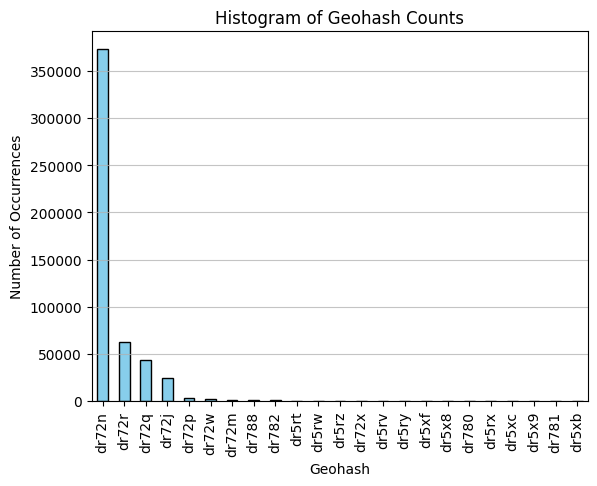

In [573]:
# display histogram of geohash

# Plot a histogram of geohash counts
geohash_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Geohash')
plt.ylabel('Number of Occurrences')
plt.title('Histogram of Geohash Counts')
plt.grid(axis='y', alpha=0.75)
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


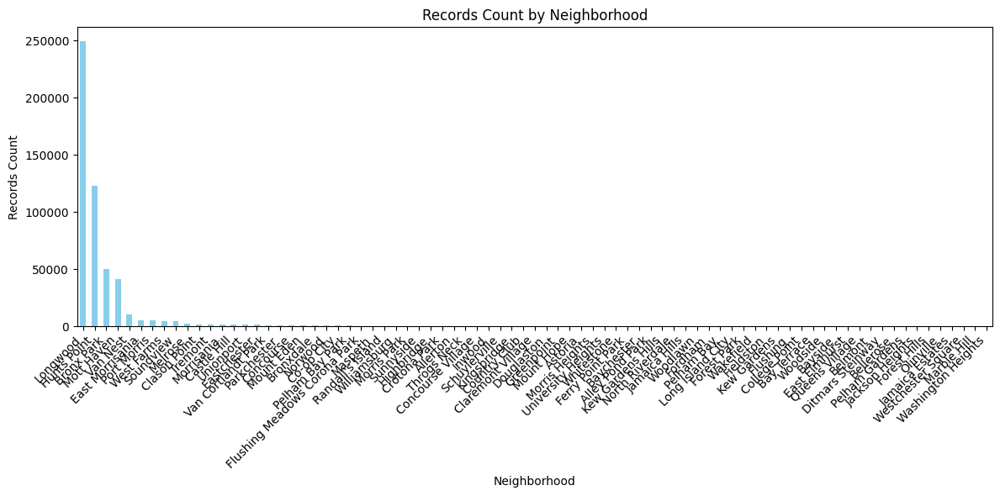


Neighborhood Counts:
neighborhood
Longwood                        249079
Hunts Point                     122656
Bronx Park                       49912
Mott Haven                       41379
Van Nest                         10491
East Morrisania                   5118
Port Morris                       5004
West Farms                        4415
Soundview                         4289
Melrose                           2421
Clason Point                      1719
Tremont                           1700
Morrisania                        1661
Castle Hill                       1462
Unionport                         1357
Eastchester                       1187
Van Cortlandt Park                1160
Parkchester                       1135
Concourse                          910
Mount Eden                         909
Bronxdale                          813
Norwood                            524
Co-op City                         522
Pelham Bay Park                    493
Flushing Meadows Corona Park 

In [574]:
import matplotlib.pyplot as plt

# Get counts for each neighborhood
neighborhood_counts = aq25['neighborhood'].value_counts()

# Plot a bar graph
plt.figure(figsize=(12, 6))
neighborhood_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Neighborhood')
plt.ylabel('Records Count')
plt.title('Records Count by Neighborhood')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print()
print("Neighborhood Counts:")
print(neighborhood_counts)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


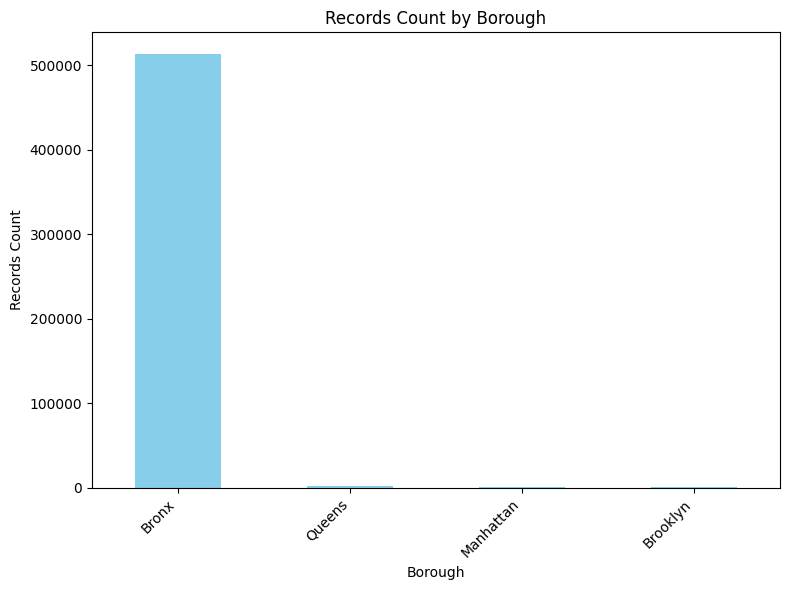


Borough Counts:
borough
Bronx        513088
Queens         1766
Manhattan       515
Brooklyn        450
Name: count, dtype: int64


In [575]:
import matplotlib.pyplot as plt

# Get counts for each borough
borough_counts = aq25['borough'].value_counts()

# Plot a bar graph
plt.figure(figsize=(8, 6))
borough_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Borough')
plt.ylabel('Records Count')
plt.title('Records Count by Borough')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print()
print("Borough Counts:")
print(borough_counts)

#### EDA Based on time

In [576]:
import pandas as pd

# Convert 'time' column to datetime format
aq25['time'] = pd.to_datetime(aq25['time'], unit='s')



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


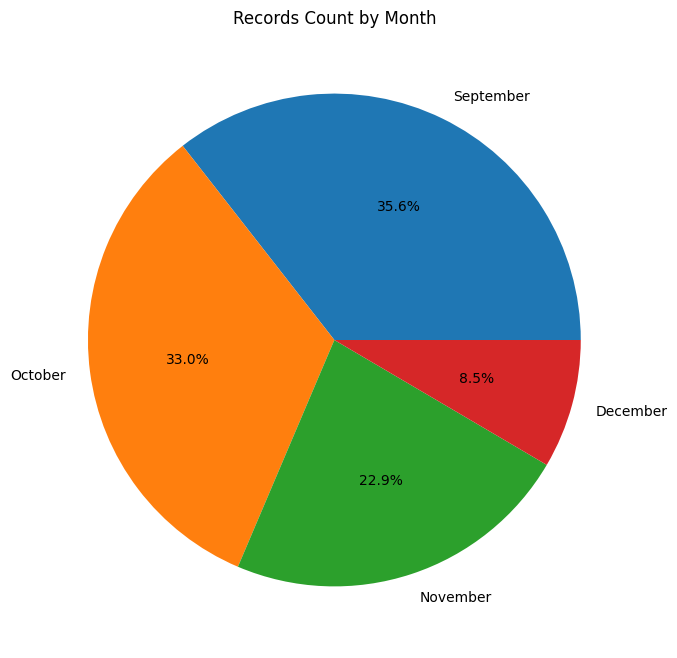


Month Counts:
month
September    183399
October      170461
November     118317
December      43642
Name: count, dtype: int64


In [577]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'time' column is not in datetime format, convert it first
aq25['time'] = pd.to_datetime(aq25['time'], unit='s')

# Create a new 'month' column with month names
aq25['month'] = aq25['time'].dt.month.map({9: 'September', 10: 'October', 11: 'November', 12: 'December'})

# Get counts for each month
month_counts = aq25['month'].value_counts()

# Plot a pie chart
plt.figure(figsize=(8, 8))
plt.pie(month_counts, labels=month_counts.index, autopct="%1.1f%%")
plt.title('Records Count by Month')
plt.show()


print()
print("Month Counts:")
print(month_counts)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


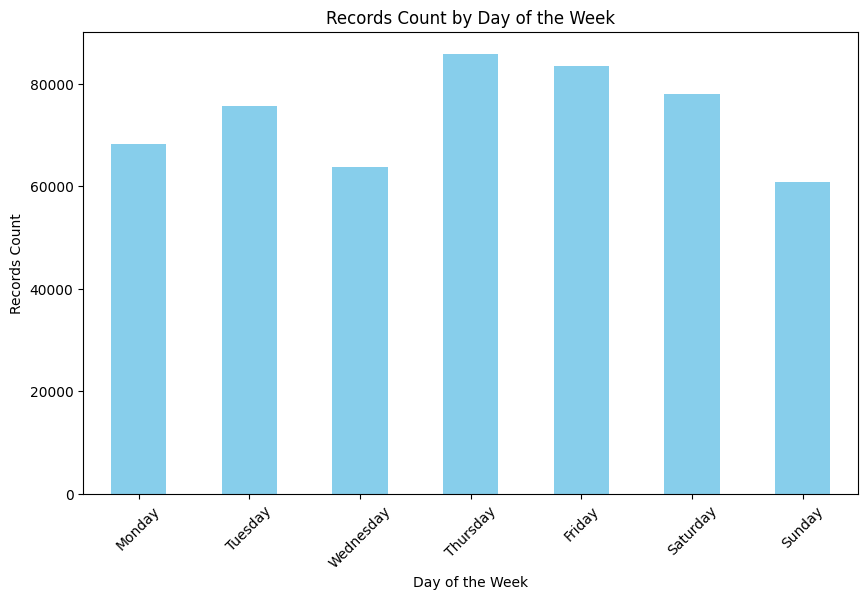

In [578]:
# Getting the name of the day of the week from the 'time' column
aq25['day_of_week'] = aq25['time'].dt.day_name()

# We create a categorical type for days of the week to ensure they are always in the correct order
days_of_week_ordered = pd.Categorical(aq25['day_of_week'],
                                      categories=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
                                      ordered=True)

# Assign the ordered categorical type back to the DataFrame
aq25['day_of_week'] = days_of_week_ordered

# Count the number of records for each day of the week
day_of_week_counts = aq25['day_of_week'].value_counts().sort_index()

# Plotting the bar chart
plt.figure(figsize=(10, 6))
day_of_week_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Day of the Week')
plt.ylabel('Records Count')
plt.title('Records Count by Day of the Week')
plt.xticks(rotation=45)
plt.show()


### General EDA

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


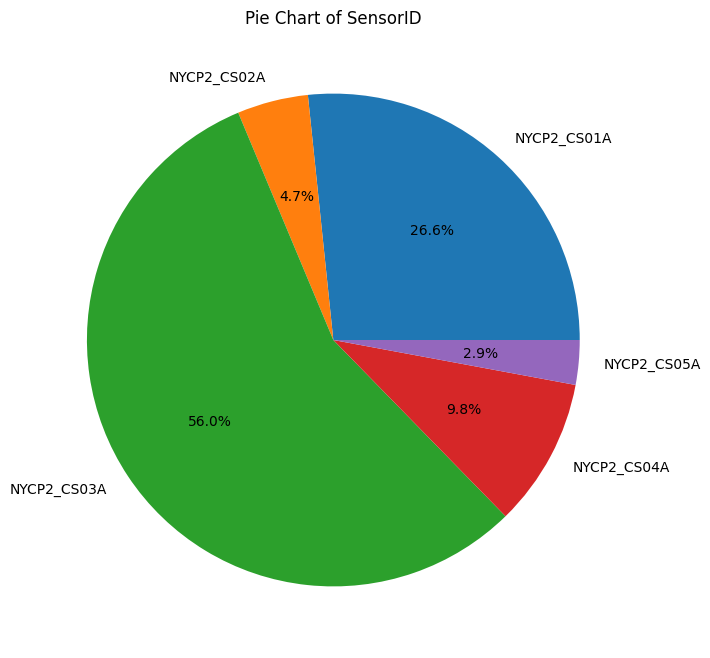

In [579]:
# Group the data by SensorID and count the number of occurrences
sensor_counts = aq25.groupby('SensorID')['SensorID'].count()

# Create a pie chart
plt.figure(figsize=(10, 8))
plt.pie(sensor_counts, labels=sensor_counts.index, autopct="%1.1f%%")
plt.title('Pie Chart of SensorID')
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


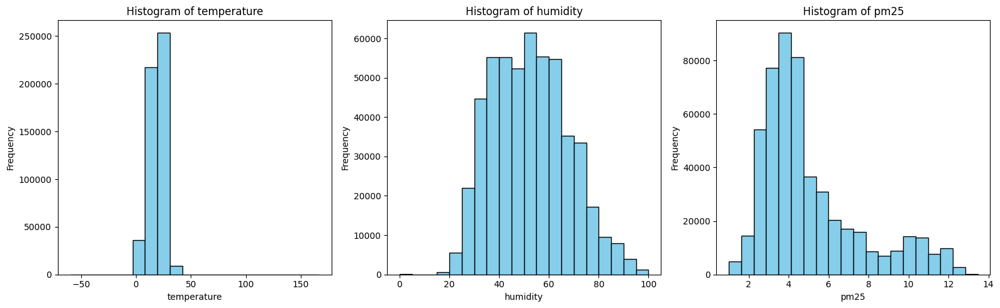


         temperature       humidity           pm25
count  515819.000000  515819.000000  515819.000000
mean       19.120276      52.315376       5.033632
std         6.807867      15.355492       2.502185
min       -59.700000       0.000000       1.012253
25%        14.200000      40.000000       3.292498
50%        19.800000      51.700000       4.263904
75%        24.300000      62.600000       5.924443
max       166.700000     100.000000      13.463396


In [580]:
# Define the columns to describe and plot
columns_to_describe = ['temperature', 'humidity', 'pm25']

# Describe the columns
description = aq25[columns_to_describe].describe()

# Plot histograms
plt.figure(figsize=(16, 5))
for i, col in enumerate(columns_to_describe, 1):
    plt.subplot(1, 3, i)
    plt.hist(aq25[col], bins=20, color='skyblue', edgecolor='black')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {col}')
plt.tight_layout()
plt.show()


# Display the description
print()
print(description)


### EDA Based on PM2.5 values

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


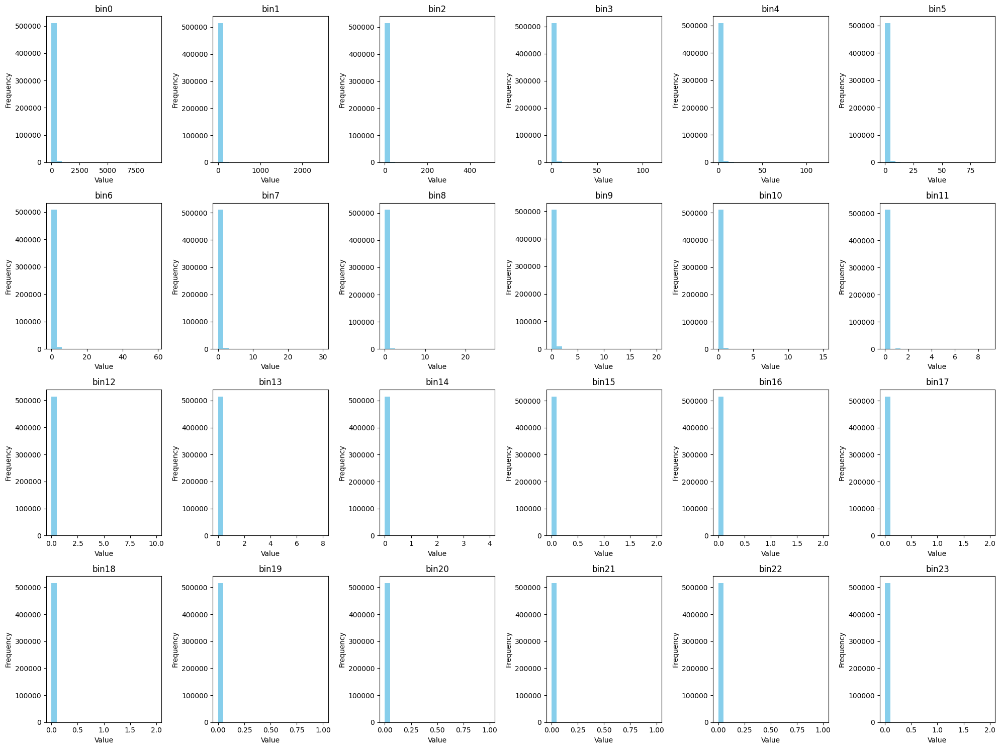

In [581]:
import matplotlib.pyplot as plt

# Select columns that start with 'bin'
bin_columns = [col for col in aq25.columns if col.startswith('bin')]

# Plot histograms for each bin column
plt.figure(figsize=(20, 15))
for i, col in enumerate(bin_columns, start=1):
    plt.subplot(4, 6, i)
    aq25[col].hist(color='skyblue', bins=20)
    plt.title(col)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(False)
plt.tight_layout()
plt.show()


In [582]:
# Describe each bin column
bin_descriptions = aq25[bin_columns].describe().transpose()

# Display the descriptions
print(bin_descriptions)


          count       mean         std  min  25%   50%   75%     max
bin0   515819.0  49.332144  111.427328  0.0  6.0  17.0  47.0  9309.0
bin1   515819.0   5.077837   17.003277  0.0  0.0   1.0   5.0  2493.0
bin2   515819.0   1.251138    3.885998  0.0  0.0   0.0   1.0   493.0
bin3   515819.0   0.329951    1.133661  0.0  0.0   0.0   0.0   115.0
bin4   515819.0   0.484631    1.499178  0.0  0.0   0.0   0.0   119.0
bin5   515819.0   0.351769    1.170565  0.0  0.0   0.0   0.0    92.0
bin6   515819.0   0.207007    0.745518  0.0  0.0   0.0   0.0    59.0
bin7   515819.0   0.077407    0.363871  0.0  0.0   0.0   0.0    30.0
bin8   515819.0   0.059333    0.316550  0.0  0.0   0.0   0.0    26.0
bin9   515819.0   0.023547    0.186991  0.0  0.0   0.0   0.0    20.0
bin10  515819.0   0.011074    0.123228  0.0  0.0   0.0   0.0    15.0
bin11  515819.0   0.006306    0.091011  0.0  0.0   0.0   0.0     9.0
bin12  515819.0   0.003055    0.062162  0.0  0.0   0.0   0.0    10.0
bin13  515819.0   0.001506    0.04

In [583]:
# Define the binning categories and corresponding normalization values
binning_categories = {
    'Less than 25': 1,
    '25–50': 2,
    '50–100': 3,
    '100–300': 4,
    'More than 300': 5
}

# Bin the PM25 values and create a new column
aq25['pm25_category'] = pd.cut(aq25['pm25'],
                             bins=[-float('inf'), 25, 50, 100, 300, float('inf')],
                             labels=['Less than 25', '25–50', '50–100', '100–300', 'More than 300'],
                             right=False)

# Map the categories to their normalization values
aq25['pm25_category'] = aq25['pm25_category'].map(binning_categories)

# Display the DataFrame with the new column
print(aq25[['pm25', 'pm25_category']].head())


       pm25 pm25_category
0  4.508813             1
1  5.462420             1
2  5.154881             1
3  4.508813             1
4  5.539503             1


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [584]:
print(aq25[['pm25', 'pm25_category']].tail(50))


            pm25 pm25_category
506604  8.332111             1
506605  6.460850             1
506606  6.589049             1
506607  8.332111             1
506608  6.560555             1
506609  8.254755             1
506610  6.457339             1
506611  6.654746             1
506612  6.493671             1
506613  6.654746             1
506614  6.607205             1
506615  6.495535             1
506647  6.733144             1
506648  3.631070             1
506649  3.631070             1
506650  6.477422             1
506651  8.254755             1
506652  8.332111             1
506653  8.254755             1
506654  6.644232             1
506655  6.502623             1
506656  8.254755             1
506657  3.631070             1
506658  3.754489             1
506659  6.457339             1
506660  3.887630             1
506661  3.637473             1
506662  3.631070             1
506663  3.637473             1
506664  3.631155             1
506665  3.939246             1
506666  

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [585]:
import pandas as pd

# Assuming 'aq25' is your DataFrame
bins = [0, 25, 50, 100, 300, float('inf')]
labels = [1, 2, 3, 4, 5]
aq25['pm25_category'] = pd.cut(aq25['pm25'], bins=bins, labels=labels, right=False)

# To see the distribution of categories
print(aq25['pm25_category'].value_counts())


pm25_category
1    515819
2         0
3         0
4         0
5         0
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


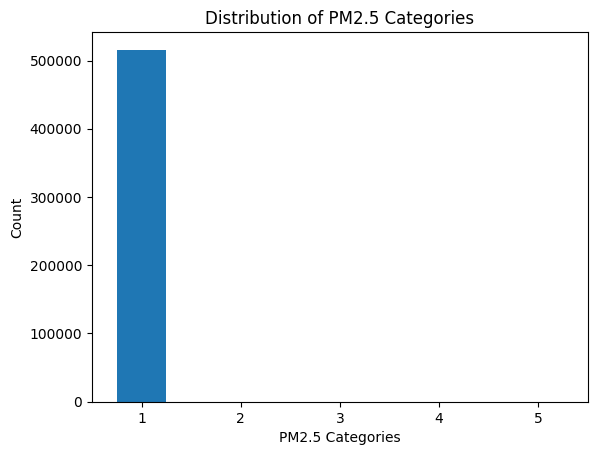

In [586]:
import matplotlib.pyplot as plt

aq25['pm25_category'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of PM2.5 Categories')
plt.xlabel('PM2.5 Categories')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


In [587]:
# Normalize the bin counts by dividing by the maximum count for each bin
# This puts the bin counts on a scale from 0 to 1
for i in range(24):
    bin_column = f'bin{i}'
    aq25[bin_column + '_norm'] = aq25[bin_column] / aq25[bin_column].max()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [588]:
# Use statistical analysis to determine a threshold for large particle bins
# We will use the 75th percentile as an example. This means that any normalized bin count
# greater than this value is in the top 25% of all counts and could be considered high.
##### could also consider using mean + x * standard deviation for a similar analysis.
large_particle_bins = [f'bin{i}_norm' for i in range(16, 24)]  # Focus on larger particles
thresholds = aq25[large_particle_bins].quantile(0.75)
combined_threshold = thresholds.mean()  # Calculate the average of the thresholds


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [589]:
# Vectorized initial category calculation
bins = [0, 25, 50, 100, 300, float('inf')]
labels = [1, 2, 3, 4, 5]
aq25['pm25_category'] = pd.cut(aq25['pm25'], bins=bins, labels=labels, right=False)

# Vectorized threshold comparison for bins 16-23
# We create a boolean DataFrame where each True represents a value exceeding the threshold
bins_exceed_threshold = aq25[[f'bin{i}_norm' for i in range(16, 24)]] > combined_threshold

# Any row in this DataFrame with a True value indicates that the category should be increased by 1
# We use `any(axis=1)` to check if any value in a row is True, this gives us a Series of booleans
rows_to_adjust = bins_exceed_threshold.any(axis=1)

# Now we can add 1 to the category for those rows. We also ensure the category does not exceed 5
aq25.loc[rows_to_adjust, 'pm25_category'] = (aq25.loc[rows_to_adjust, 'pm25_category'].astype(int) + 1).clip(upper=5)

# Check the distribution of the new PM2.5 categories
category_distribution = aq25['pm25_category'].value_counts().sort_index()
print(category_distribution)

pm25_category
1    515463
2       356
3         0
4         0
5         0
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


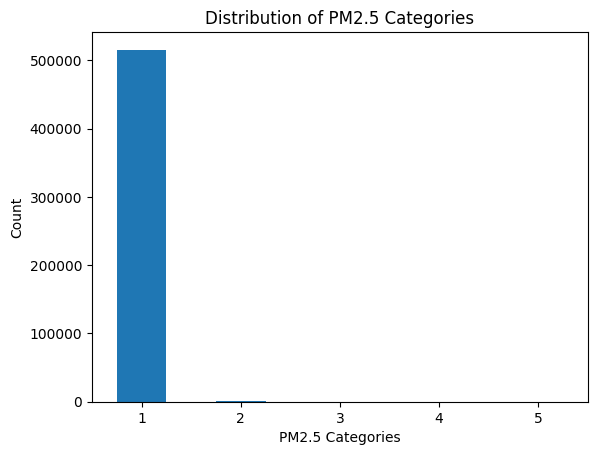

In [590]:
import matplotlib.pyplot as plt

aq25['pm25_category'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of PM2.5 Categories')
plt.xlabel('PM2.5 Categories')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


In [591]:
print(aq25.head())

      SensorID                time   latitude  longitude  bin0  bin1  bin2  \
0  NYCP2_CS01A 2021-09-10 12:35:04  40.847672 -73.869316    11     1     1   
1  NYCP2_CS01A 2021-09-10 12:35:08  40.847668 -73.869316    22     4     1   
2  NYCP2_CS01A 2021-09-10 12:35:13  40.847649 -73.869362    40     1     1   
3  NYCP2_CS01A 2021-09-10 12:35:18  40.847649 -73.869362    26     1     0   
4  NYCP2_CS01A 2021-09-10 12:35:23  40.847649 -73.869362    44     4     0   

   bin3  bin4  bin5  bin6  bin7  bin8  bin9  bin10  bin11  bin12  bin13  \
0     0     0     0     0     0     0     0      0      0      0      0   
1     0     0     2     0     0     0     0      0      0      0      0   
2     0     0     1     0     0     0     0      0      0      0      0   
3     0     0     0     0     0     0     0      0      0      0      0   
4     1     0     0     1     0     0     0      0      0      0      0   

   bin14  bin15  bin16  bin17  bin18  bin19  bin20  bin21  bin22  bin23  \
0    

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [592]:
type(aq25)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


geopandas.geodataframe.GeoDataFrame

Correlation: To determine the strength and direction of the linear relationship between two continuous variables.
Covariance: To assess how much two random variables vary together.
Histograms: To visualize the distribution of a single continuous variable.
Boxplots: To visually represent the distribution of a continuous variable and identify outliers.
Scatter plots: To visually assess the relationship between two continuous variables.

In [593]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Correlation
correlation_matrix = aq25[['pm25', 'temperature', 'humidity']].corr()
print("Correlation Matrix:")
print(correlation_matrix)



Correlation Matrix:
                 pm25  temperature  humidity
pm25         1.000000     0.539605  0.139895
temperature  0.539605     1.000000 -0.079104
humidity     0.139895    -0.079104  1.000000


In [594]:
# Covariance
covariance_matrix = aq25[['pm25', 'temperature', 'humidity']].cov()
print("\nCovariance Matrix:")
print(covariance_matrix)




Covariance Matrix:
                 pm25  temperature    humidity
pm25         6.260932     9.191925    5.375087
temperature  9.191925    46.347048   -8.269416
humidity     5.375087    -8.269416  235.791140


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


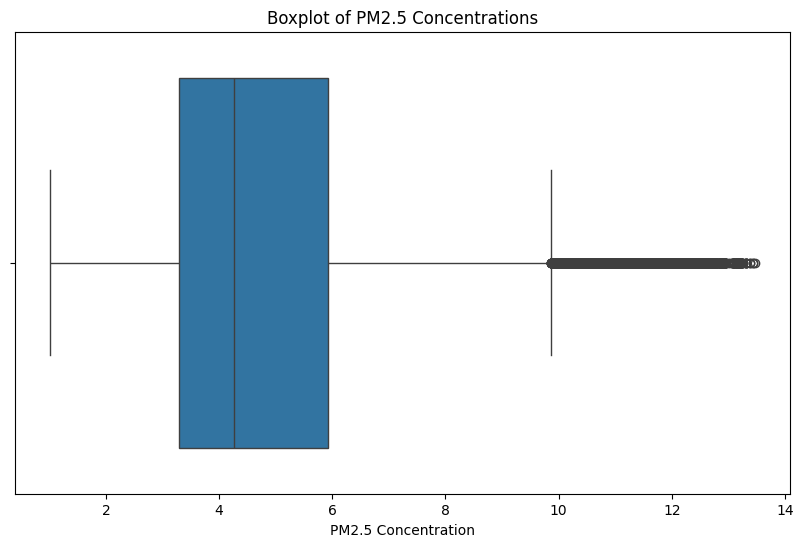

In [595]:
# Boxplots for PM2.5
plt.figure(figsize=(10, 6))
sns.boxplot(x=aq25['pm25'])
plt.title('Boxplot of PM2.5 Concentrations')
plt.xlabel('PM2.5 Concentration')
plt.show()



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


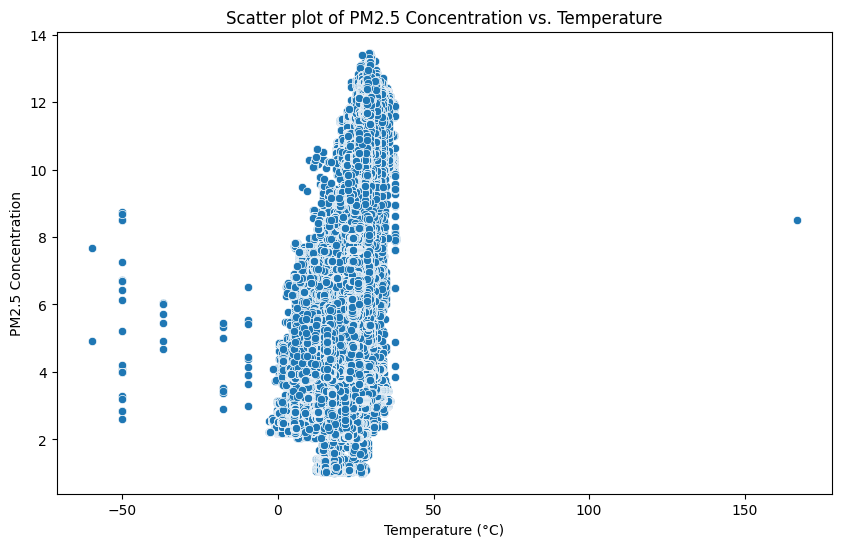

In [596]:
# Scatter plot for PM2.5 vs. Temperature
plt.figure(figsize=(10, 6))
sns.scatterplot(data=aq25, x='temperature', y='pm25')
plt.title('Scatter plot of PM2.5 Concentration vs. Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('PM2.5 Concentration')
plt.show()



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


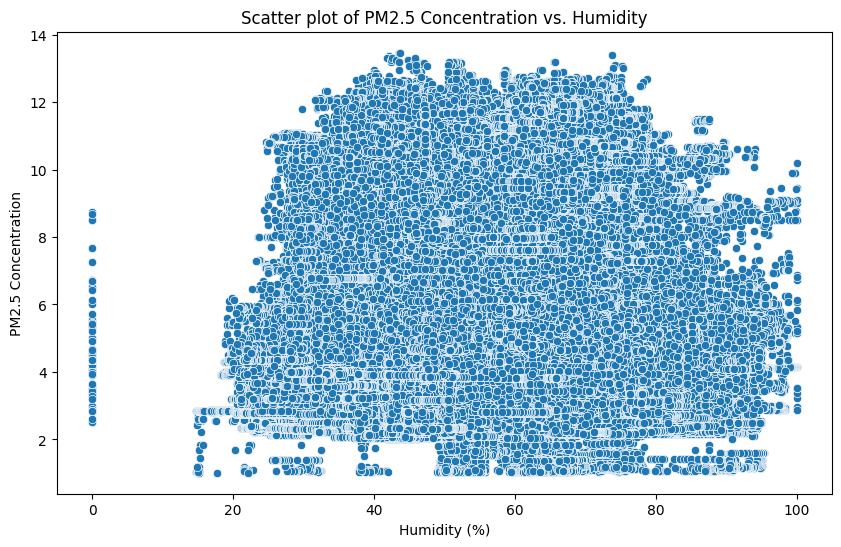

In [597]:
# Scatter plot for PM2.5 vs. Humidity
plt.figure(figsize=(10, 6))
sns.scatterplot(data=aq25, x='humidity', y='pm25')
plt.title('Scatter plot of PM2.5 Concentration vs. Humidity')
plt.xlabel('Humidity (%)')
plt.ylabel('PM2.5 Concentration')
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


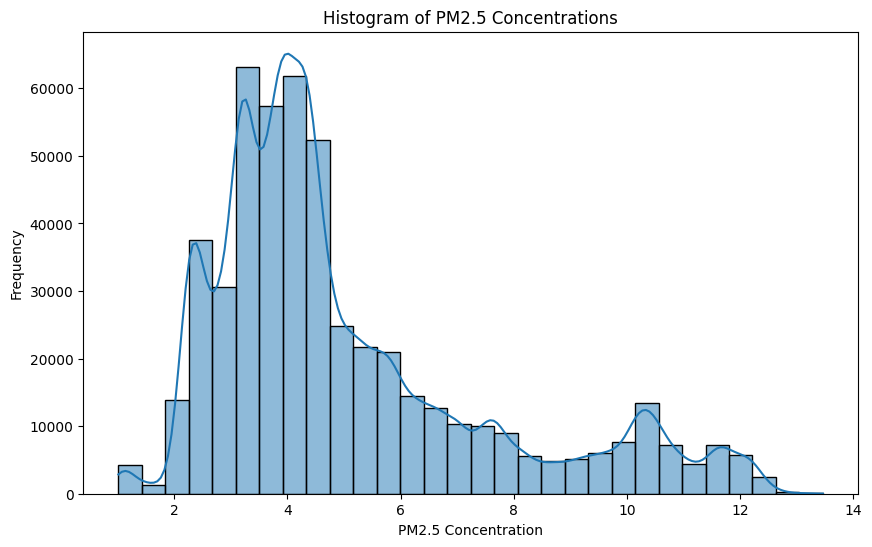

In [598]:
# Histograms for PM2.5
plt.figure(figsize=(10, 6))
sns.histplot(aq25['pm25'], bins=30, kde=True)
plt.title('Histogram of PM2.5 Concentrations')
plt.xlabel('PM2.5 Concentration')
plt.ylabel('Frequency')
plt.show()



### Binning/rating

`the-lower-the-better`


rating:
[0 - 3] mapped to 1
[3 - 4] mapped to 2
[5 - 6] mapped to 3
[6 - 8] mapped to 4
[8 - 14] mapped to 5

In [599]:

#Code to add rating column:

import pandas as pd
import numpy as np

def categorize_pm25(value):
    if value <= 3:
        return 1
    elif value <= 6:
        return 2
    elif value <= 9:
        return 3
    elif value <= 12:
        return 4
    else:
        return 5  # Assuming the next category goes up to 14, and any higher is also in this category

aq25['rating'] = aq25['pm25'].apply(categorize_pm25)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [600]:
"""
import matplotlib.pyplot as plt

# Plotting the histogram
plt.hist(aq25['rating'], bins=np.arange(1, 7) - 0.5, edgecolor='black')
plt.xticks(range(1, 6))
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Histogram of PM2.5 Ratings')
plt.show()
"""

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


"\nimport matplotlib.pyplot as plt\n\n# Plotting the histogram\nplt.hist(aq25['rating'], bins=np.arange(1, 7) - 0.5, edgecolor='black')\nplt.xticks(range(1, 6))\nplt.xlabel('Rating')\nplt.ylabel('Count')\nplt.title('Histogram of PM2.5 Ratings')\nplt.show()\n"

In [601]:
#Code to add rating column:
"""
import pandas as pd
import numpy as np

def categorize_pm25(value):
    if value <= 3:
        return 1
    elif value <= 4:
        return 2
    elif value <= 6:
        return 3
    elif value <= 8:
        return 4
    else:
        return 5  # Assuming the next category goes up to 14, and any higher is also in this category

aq25['rating'] = aq25['pm25'].apply(categorize_pm25)
"""

"\nimport pandas as pd\nimport numpy as np\n\ndef categorize_pm25(value):\n    if value <= 3:\n        return 1\n    elif value <= 4:\n        return 2\n    elif value <= 6:\n        return 3\n    elif value <= 8:\n        return 4\n    else:\n        return 5  # Assuming the next category goes up to 14, and any higher is also in this category\n\naq25['rating'] = aq25['pm25'].apply(categorize_pm25)\n"

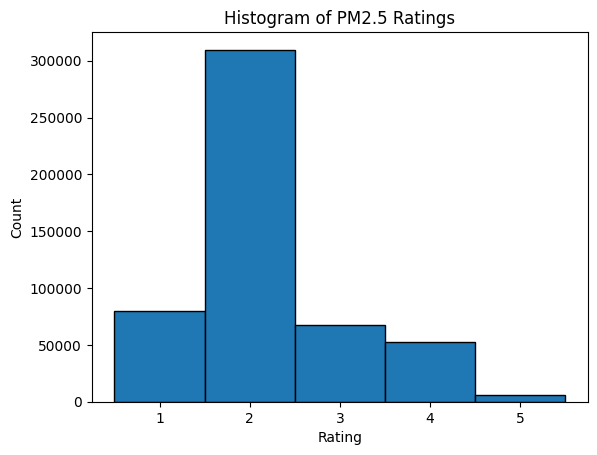

In [602]:
import matplotlib.pyplot as plt

# Plotting the histogram
plt.hist(aq25['rating'], bins=np.arange(1, 7) - 0.5, edgecolor='black')
plt.xticks(range(1, 6))
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Histogram of PM2.5 Ratings')
plt.show()


# NO2 - New York City (USA) <date> - <date> - NO2 levels in the air


## Air quality data (no2) - reading data
Put all 2 files into 1 dataframe called no2

In [603]:
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt


In [604]:


# URLs of the CSV files
urls = [
    "https://raw.githubusercontent.com/r6541/NYC_taxi_data_ESTDA/main/NYC_Pilot2_NO2_Part1.csv",
    "https://raw.githubusercontent.com/r6541/NYC_taxi_data_ESTDA/main/NYC_Pilot2_NO2_Part2.csv"
]

# List to hold the DataFrames
dfs = []

# Read each CSV file and append its DataFrame to the list
for url in urls:
    dfs.append(pd.read_csv(url))

# Concatenate all DataFrames into one
no2 = pd.concat(dfs, ignore_index=True)

# Display the combined DataFrame
print(no2.head())


      SensorID        time   latitude  longitude  temperature  humidity  \
0  NYCP2_CS01A  1631278083  40.847057 -73.869904         21.7      61.2   
1  NYCP2_CS01A  1631278088  40.847057 -73.869904         21.7      60.9   
2  NYCP2_CS01A  1631278093  40.847054 -73.869904         21.7      60.7   
3  NYCP2_CS01A  1631278098  40.847050 -73.869904         21.7      60.3   
4  NYCP2_CS01A  1631278103  40.847038 -73.869919         21.7      60.7   

         no2  
0  12.041785  
1  12.041785  
2  12.041785  
3  12.041785  
4  12.041785  


In [605]:
earliest_time = no2['time'].min()
latest_time = no2['time'].max()

print("Earliest time:", earliest_time)
print("Latest time:", latest_time)

# Convert the earliest and latest times to datetime objects
earliest_datetime = datetime.utcfromtimestamp(earliest_time)
latest_datetime = datetime.utcfromtimestamp(latest_time)

print("Earliest time:", earliest_datetime) #September 10, 2021
print("Latest time:", latest_datetime) #December 15, 2021


Earliest time: 1631277207
Latest time: 1639581805
Earliest time: 2021-09-10 12:33:27
Latest time: 2021-12-15 15:23:25


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Merge NO2 data with geojson to get Neighborhood and Borough

In [606]:
# display only 10 pd rows

pd.set_option('display.max_rows', 10)


In [607]:
"""
# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
"""

"\n# Set display options to show all rows and columns\npd.set_option('display.max_rows', None)\npd.set_option('display.max_columns', None)\n"

In [608]:
from geopandas import read_file, GeoDataFrame
from shapely.geometry import Point

# Load the GeoJSON file into a GeoDataFrame
geojson_url = 'https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/nyc_polygon.geojson'
geo_df = read_file(geojson_url)

# Convert latitude and longitude to a geometry column
geometry = [Point(xy) for xy in zip(no2['longitude'], no2['latitude'])]
crs = 'EPSG:4326'  # Assuming the coordinates are in EPSG:4326
sensor_gdf = GeoDataFrame(no2, crs=crs, geometry=geometry)


In [609]:
# Perform a spatial join
no2 = sensor_gdf.sjoin(geo_df, how="inner", predicate="within")

# Display the merged DataFrame
print(no2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


           SensorID        time   latitude  longitude  temperature  humidity  \
0       NYCP2_CS01A  1631278083  40.847057 -73.869904         21.7      61.2   
1       NYCP2_CS01A  1631278088  40.847057 -73.869904         21.7      60.9   
2       NYCP2_CS01A  1631278093  40.847054 -73.869904         21.7      60.7   
3       NYCP2_CS01A  1631278098  40.847050 -73.869904         21.7      60.3   
4       NYCP2_CS01A  1631278103  40.847038 -73.869919         21.7      60.7   
...             ...         ...        ...        ...          ...       ...   
483859  NYCP2_CS05A  1631813374  40.886261 -73.867111         25.8      63.5   
483860  NYCP2_CS05A  1631813379  40.884983 -73.867638         25.8      64.0   
483861  NYCP2_CS05A  1631813384  40.883713 -73.868149         25.8      64.0   
483862  NYCP2_CS05A  1631813389  40.882404 -73.868660         25.8      63.6   
483863  NYCP2_CS05A  1631813394  40.881062 -73.869164         25.8      64.3   

              no2                    ge

### Adding Geohash and STB to data

In [610]:
# Add STB column
no2['geohash'] = no2.apply(lambda row: STB._get_geohash(row['latitude'], row['longitude'], 6), axis=1)
no2['STB'] = no2.apply(lambda row: STB.from_lat_lon_timestamp(row['latitude'], row['longitude'], row['geohash'], row['time']), axis=1)

# Display the result
print(no2[['geohash', 'time', 'STB']].head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  geohash        time                         STB
0  dr72r5  1631278083  dr72r5|2021-09-10 12:48:03
1  dr72r5  1631278088  dr72r5|2021-09-10 12:48:08
2  dr72r5  1631278093  dr72r5|2021-09-10 12:48:13
3  dr72r5  1631278098  dr72r5|2021-09-10 12:48:18
4  dr72r5  1631278103  dr72r5|2021-09-10 12:48:23


In [611]:
print(no2.head())

      SensorID        time   latitude  longitude  temperature  humidity  \
0  NYCP2_CS01A  1631278083  40.847057 -73.869904         21.7      61.2   
1  NYCP2_CS01A  1631278088  40.847057 -73.869904         21.7      60.9   
2  NYCP2_CS01A  1631278093  40.847054 -73.869904         21.7      60.7   
3  NYCP2_CS01A  1631278098  40.847050 -73.869904         21.7      60.3   
4  NYCP2_CS01A  1631278103  40.847038 -73.869919         21.7      60.7   

         no2                    geometry  index_right neighborhood  \
0  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0           2   Bronx  http://nyc.pediacities.com/Re

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [612]:
# geohash up to :5

no2['geohash'] = no2['geohash'].str[:5]
print(no2)


           SensorID        time   latitude  longitude  temperature  humidity  \
0       NYCP2_CS01A  1631278083  40.847057 -73.869904         21.7      61.2   
1       NYCP2_CS01A  1631278088  40.847057 -73.869904         21.7      60.9   
2       NYCP2_CS01A  1631278093  40.847054 -73.869904         21.7      60.7   
3       NYCP2_CS01A  1631278098  40.847050 -73.869904         21.7      60.3   
4       NYCP2_CS01A  1631278103  40.847038 -73.869919         21.7      60.7   
...             ...         ...        ...        ...          ...       ...   
483859  NYCP2_CS05A  1631813374  40.886261 -73.867111         25.8      63.5   
483860  NYCP2_CS05A  1631813379  40.884983 -73.867638         25.8      64.0   
483861  NYCP2_CS05A  1631813384  40.883713 -73.868149         25.8      64.0   
483862  NYCP2_CS05A  1631813389  40.882404 -73.868660         25.8      63.6   
483863  NYCP2_CS05A  1631813394  40.881062 -73.869164         25.8      64.3   

              no2                    ge

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## EDA - NO2

#### EDA Based on location

In [613]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [614]:
# Count the number of occurrences of each geohash
geohash_counts = no2['geohash'].value_counts()

# Display the geohash counts
print(geohash_counts)


geohash
dr72n    362312
dr72q     45639
dr72r     43693
dr72j     28113
dr72w      3892
dr72p      2162
dr72m      1911
dr788       994
dr5rt       972
dr782       512
dr72x       410
dr5rw       274
dr5rv       182
dr5ry       178
dr5x8       133
dr5rz       104
dr5xf       104
dr5rx        74
dr780        72
dr5rs        67
dr5xc        11
dr5xb         5
dr781         5
dr72t         2
dr5x9         1
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


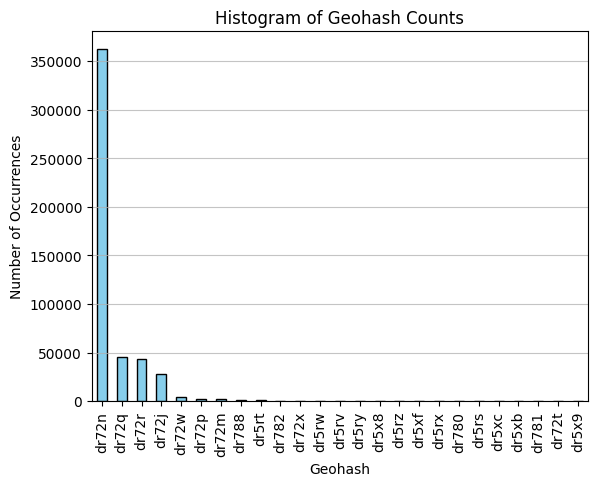

In [615]:
# display histogram of geohash

# Plot a histogram of geohash counts
geohash_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Geohash')
plt.ylabel('Number of Occurrences')
plt.title('Histogram of Geohash Counts')
plt.grid(axis='y', alpha=0.75)
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


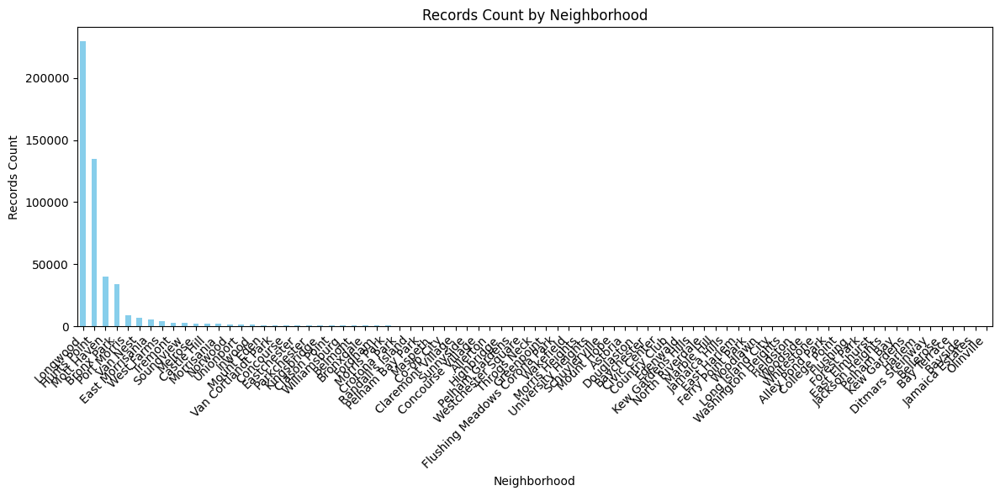


Neighborhood Counts:
neighborhood
Longwood                        229385
Hunts Point                     134527
Mott Haven                       40146
Bronx Park                       34113
Port Morris                       8555
Van Nest                          6602
East Morrisania                   5319
West Farms                        3894
Tremont                           2872
Soundview                         2567
Melrose                           2305
Castle Hill                       1811
Morrisania                        1790
Norwood                           1229
Unionport                         1227
Inwood                            1091
Mount Eden                        1058
Van Cortlandt Park                1014
Concourse                          914
Eastchester                        823
Parkchester                        816
Kingsbridge                        749
Clason Point                       712
Williamsburg                       700
Belmont                      

In [616]:
import matplotlib.pyplot as plt

# Get counts for each neighborhood
neighborhood_counts = no2['neighborhood'].value_counts()

# Plot a bar graph
plt.figure(figsize=(12, 6))
neighborhood_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Neighborhood')
plt.ylabel('Records Count')
plt.title('Records Count by Neighborhood')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print()
print("Neighborhood Counts:")
print(neighborhood_counts)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


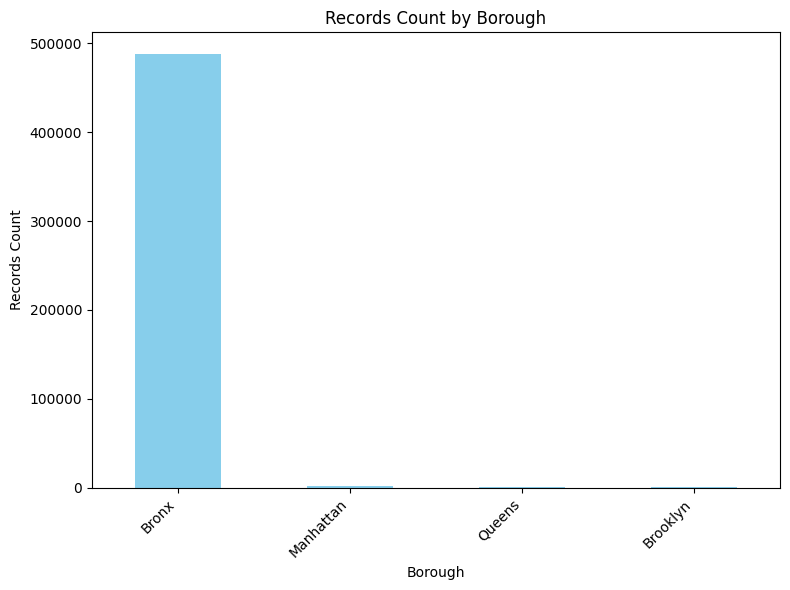


Borough Counts:
borough
Bronx        488098
Manhattan      1658
Queens         1216
Brooklyn        850
Name: count, dtype: int64


In [617]:
import matplotlib.pyplot as plt

# Get counts for each borough
borough_counts = no2['borough'].value_counts()

# Plot a bar graph
plt.figure(figsize=(8, 6))
borough_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Borough')
plt.ylabel('Records Count')
plt.title('Records Count by Borough')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print()
print("Borough Counts:")
print(borough_counts)

#### EDA Based on time

In [618]:
import pandas as pd

# Convert 'time' column to datetime format
no2['time'] = pd.to_datetime(no2['time'], unit='s')



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


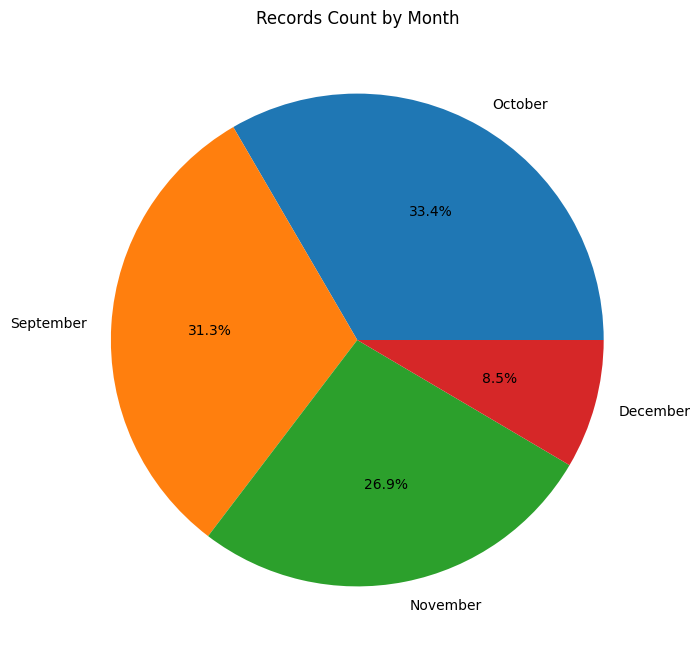


Month Counts:
month
October      164239
September    153724
November     132154
December      41705
Name: count, dtype: int64


In [619]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'time' column is not in datetime format, convert it first
no2['time'] = pd.to_datetime(no2['time'], unit='s')

# Create a new 'month' column with month names
no2['month'] = no2['time'].dt.month.map({9: 'September', 10: 'October', 11: 'November', 12: 'December'})

# Get counts for each month
month_counts = no2['month'].value_counts()

# Plot a pie chart
plt.figure(figsize=(8, 8))
plt.pie(month_counts, labels=month_counts.index, autopct="%1.1f%%")
plt.title('Records Count by Month')
plt.show()


print()
print("Month Counts:")
print(month_counts)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


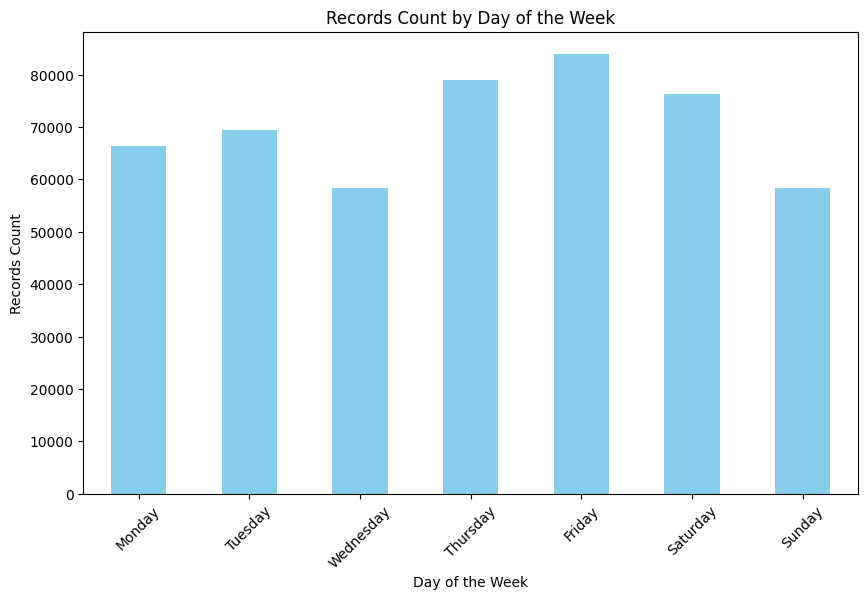

In [620]:
# Getting the name of the day of the week from the 'time' column
no2['day_of_week'] = no2['time'].dt.day_name()

# We create a categorical type for days of the week to ensure they are always in the correct order
days_of_week_ordered = pd.Categorical(no2['day_of_week'],
                                      categories=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
                                      ordered=True)

# Assign the ordered categorical type back to the DataFrame
no2['day_of_week'] = days_of_week_ordered

# Count the number of records for each day of the week
day_of_week_counts = no2['day_of_week'].value_counts().sort_index()

# Plotting the bar chart
plt.figure(figsize=(10, 6))
day_of_week_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Day of the Week')
plt.ylabel('Records Count')
plt.title('Records Count by Day of the Week')
plt.xticks(rotation=45)
plt.show()


### General EDA

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


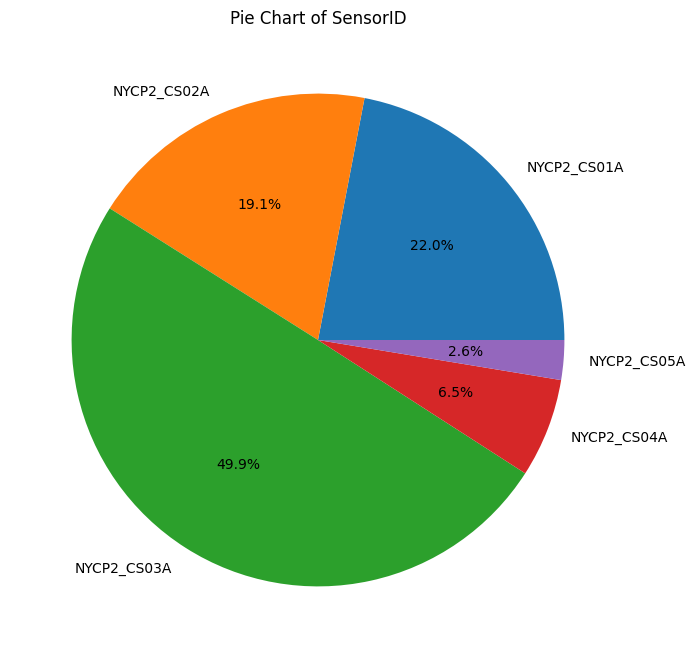

In [621]:
# Group the data by SensorID and count the number of occurrences
sensor_counts = no2.groupby('SensorID')['SensorID'].count()

# Create a pie chart
plt.figure(figsize=(10, 8))
plt.pie(sensor_counts, labels=sensor_counts.index, autopct="%1.1f%%")
plt.title('Pie Chart of SensorID')
plt.show()


In [622]:
no2.columns

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['SensorID', 'time', 'latitude', 'longitude', 'temperature', 'humidity',
       'no2', 'geometry', 'index_right', 'neighborhood', 'boroughCode',
       'borough', '@id', 'geohash', 'STB', 'month', 'day_of_week'],
      dtype='object')

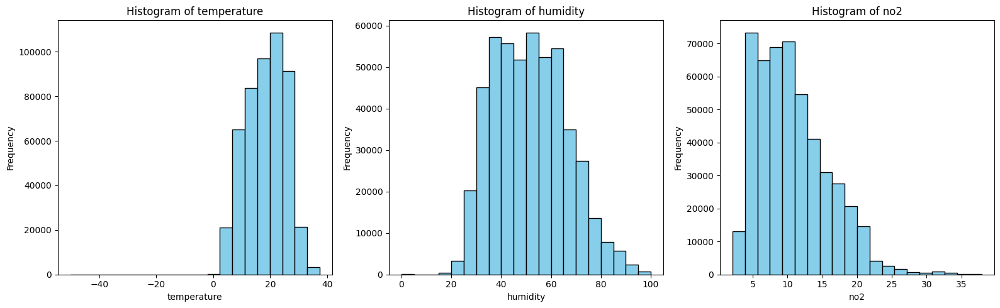


         temperature       humidity            no2
count  491822.000000  491822.000000  491822.000000
mean       18.532759      51.566376      10.719234
std         6.847682      14.659409       5.107222
min       -50.200000       0.000000       2.094472
25%        13.100000      39.600000       6.621483
50%        18.900000      50.900000       9.785441
75%        24.000000      61.800000      13.760083
max        37.400000     100.000000      37.946020


In [623]:
# Define the columns to describe and plot
columns_to_describe = ['temperature', 'humidity', 'no2']

# Describe the columns
description = no2[columns_to_describe].describe()

# Plot histograms
plt.figure(figsize=(16, 5))
for i, col in enumerate(columns_to_describe, 1):
    plt.subplot(1, 3, i)
    plt.hist(no2[col], bins=20, color='skyblue', edgecolor='black')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {col}')
plt.tight_layout()
plt.show()


# Display the description
print()
print(description)


In [624]:
print(no2.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:48:03  40.847057 -73.869904         21.7   
1  NYCP2_CS01A 2021-09-10 12:48:08  40.847057 -73.869904         21.7   
2  NYCP2_CS01A 2021-09-10 12:48:13  40.847054 -73.869904         21.7   
3  NYCP2_CS01A 2021-09-10 12:48:18  40.847050 -73.869904         21.7   
4  NYCP2_CS01A 2021-09-10 12:48:23  40.847038 -73.869919         21.7   

   humidity        no2                    geometry  index_right neighborhood  \
0      61.2  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1      60.9  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2      60.7  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3      60.3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4      60.7  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0   

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [625]:
type(no2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


geopandas.geodataframe.GeoDataFrame

Correlation: To determine the strength and direction of the linear relationship between two continuous variables.
Covariance: To assess how much two random variables vary together.
Histograms: To visualize the distribution of a single continuous variable.
Boxplots: To visually represent the distribution of a continuous variable and identify outliers.
Scatter plots: To visually assess the relationship between two continuous variables.

In [626]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Correlation
correlation_matrix = no2[['no2', 'temperature', 'humidity']].corr()
print("Correlation Matrix:")
print(correlation_matrix)



Correlation Matrix:
                  no2  temperature  humidity
no2          1.000000     0.008561  0.105127
temperature  0.008561     1.000000 -0.016072
humidity     0.105127    -0.016072  1.000000


In [627]:
# Covariance
covariance_matrix = no2[['no2', 'temperature', 'humidity']].cov()
print("\nCovariance Matrix:")
print(covariance_matrix)




Covariance Matrix:
                   no2  temperature    humidity
no2          26.083716     0.299386    7.870716
temperature   0.299386    46.890755   -1.613364
humidity      7.870716    -1.613364  214.898267


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


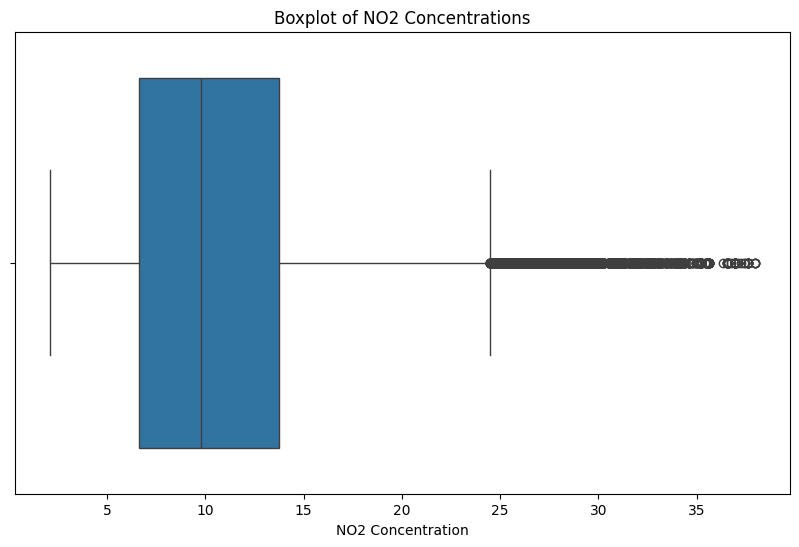

In [628]:
# Boxplots for NO2
plt.figure(figsize=(10, 6))
sns.boxplot(x=no2['no2'])
plt.title('Boxplot of NO2 Concentrations')
plt.xlabel('NO2 Concentration')
plt.show()



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


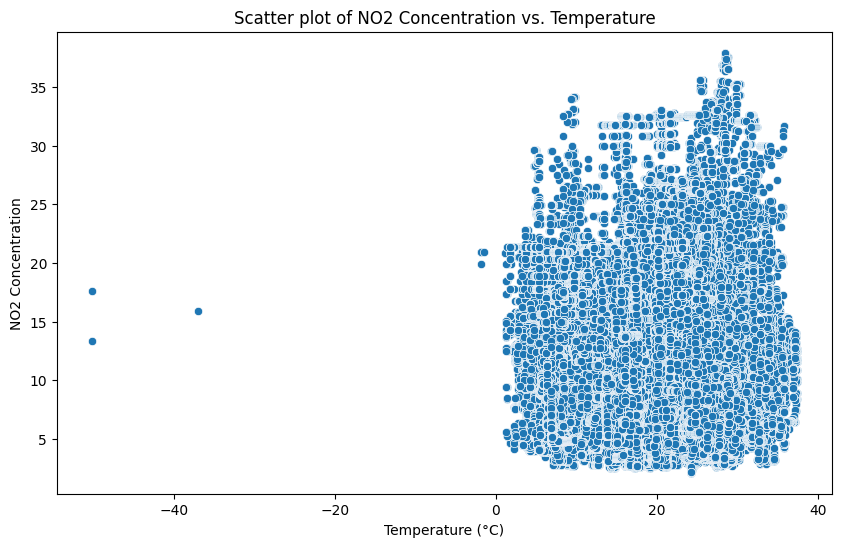

In [629]:
# Scatter plot for NO2 vs. Temperature
plt.figure(figsize=(10, 6))
sns.scatterplot(data=no2, x='temperature', y='no2')
plt.title('Scatter plot of NO2 Concentration vs. Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('NO2 Concentration')
plt.show()



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


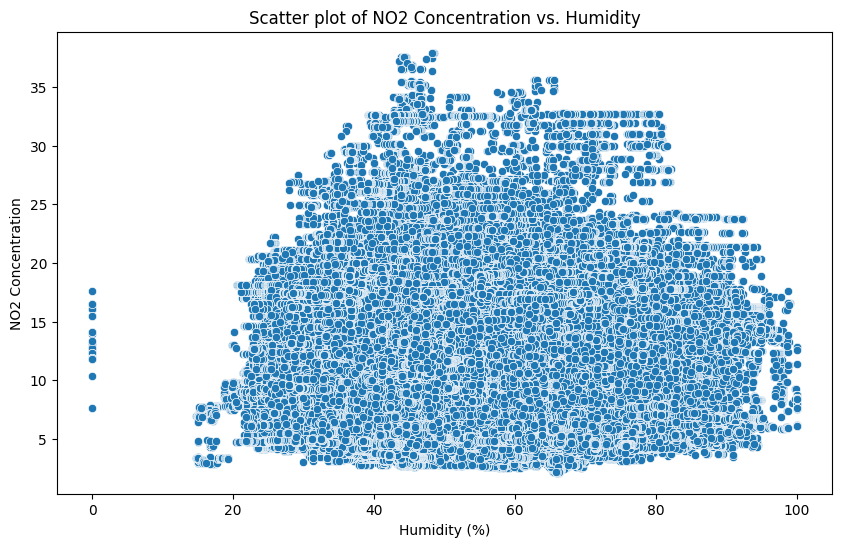

In [630]:
# Scatter plot for NO2 vs. Humidity
plt.figure(figsize=(10, 6))
sns.scatterplot(data=no2, x='humidity', y='no2')
plt.title('Scatter plot of NO2 Concentration vs. Humidity')
plt.xlabel('Humidity (%)')
plt.ylabel('NO2 Concentration')
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


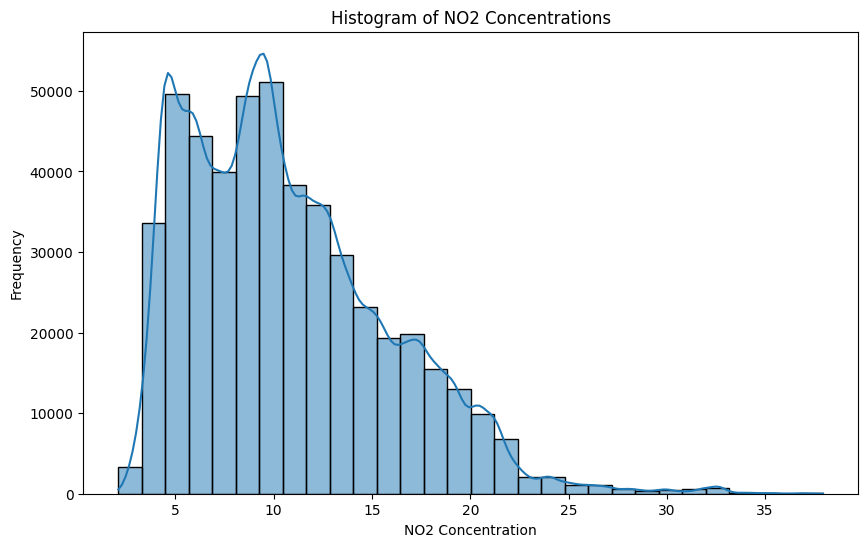

In [631]:
# Histograms for NO2
plt.figure(figsize=(10, 6))
sns.histplot(no2['no2'], bins=30, kde=True)
plt.title('Histogram of NO2 Concentrations')
plt.xlabel('NO2 Concentration')
plt.ylabel('Frequency')
plt.show()



### Binning/rating

`the-lower-the-better`


rating:
[0 - 6] mapped to 1
[6 - 10] mapped to 2
[10 - 14] mapped to 3
[14 - 18] mapped to 4
[18 - 37] mapped to 5

In [632]:
#Code to add rating column for NO2:

import pandas as pd
import numpy as np

def categorize_no2(value):
    if value <= 5:
        return 1
    elif value <= 10:
        return 2
    elif value <= 15:
        return 3
    elif value <= 20:
        return 4
    else:
        return 5

no2['rating'] = no2['no2'].apply(categorize_no2)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [633]:
#Code to add rating column for NO2:
'''
import pandas as pd
import numpy as np

def categorize_no2(value):
    if value <= 6:
        return 1
    elif value <= 10:
        return 2
    elif value <= 14:
        return 3
    elif value <= 18:
        return 4
    else:
        return 5

no2['rating'] = no2['no2'].apply(categorize_no2)
'''

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


"\nimport pandas as pd\nimport numpy as np\n\ndef categorize_no2(value):\n    if value <= 6:\n        return 1\n    elif value <= 10:\n        return 2\n    elif value <= 14:\n        return 3\n    elif value <= 18:\n        return 4\n    else:\n        return 5\n\nno2['rating'] = no2['no2'].apply(categorize_no2)\n"

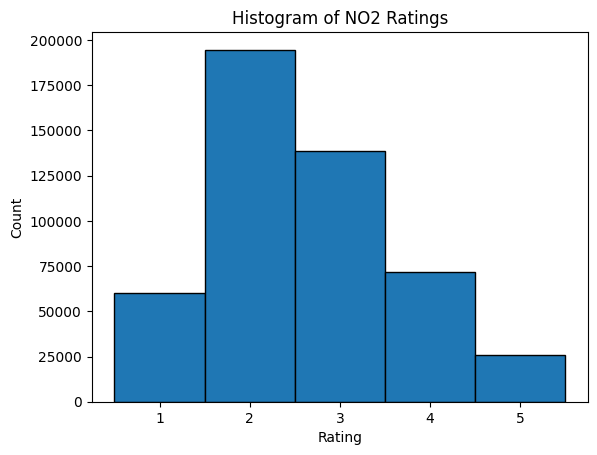

In [634]:
import matplotlib.pyplot as plt

# Plotting the histogram
plt.hist(no2['rating'], bins=np.arange(1, 7) - 0.5, edgecolor='black')
plt.xticks(range(1, 6))
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Histogram of NO2 Ratings')
plt.show()


# Shortest path

streets: https://raw.githubusercontent.com/r6541/NYC_taxi_data_ESTDA/main/nyc-streets.geojson
originally streets data was from here: https://github.com/fillerwriter/nyc-streets/blob/master/nyc-streets.geojson

##  Shortest Path - Preprocessing

### PM: grouping data according to week, day, hour

In [635]:
import pandas as pd

# Ensure the 'time' column is in datetime format
aq25['time'] = pd.to_datetime(aq25['time'])

# Extract the week of the year, day of the week, and hour of the day
aq25['week_of_year'] = aq25['time'].dt.isocalendar().week
aq25['day_of_week_number'] = aq25['time'].dt.isocalendar().day
aq25['hour_of_day'] = aq25['time'].dt.hour  # 24-hour format

# Group by week of the year, day of the week, hour of the day, and geohash, then calculate the average rating
average_rating = aq25.groupby(['week_of_year', 'day_of_week_number', 'hour_of_day', 'geohash'])['rating'].mean().reset_index()

# Rename the average rating column to make it clear
average_rating.rename(columns={'rating': 'average_rating'}, inplace=True)

# Optionally merge back to the original DataFrame to maintain all data points with their corresponding average rating
aq25 = pd.merge(aq25, average_rating, on=['week_of_year', 'day_of_week_number', 'hour_of_day', 'geohash'], how='left')

# Print the updated DataFrame with average ratings
print(aq25.head())


      SensorID                time   latitude  longitude  bin0  bin1  bin2  \
0  NYCP2_CS01A 2021-09-10 12:35:04  40.847672 -73.869316    11     1     1   
1  NYCP2_CS01A 2021-09-10 12:35:08  40.847668 -73.869316    22     4     1   
2  NYCP2_CS01A 2021-09-10 12:35:13  40.847649 -73.869362    40     1     1   
3  NYCP2_CS01A 2021-09-10 12:35:18  40.847649 -73.869362    26     1     0   
4  NYCP2_CS01A 2021-09-10 12:35:23  40.847649 -73.869362    44     4     0   

   bin3  bin4  bin5  bin6  bin7  bin8  bin9  bin10  bin11  bin12  bin13  \
0     0     0     0     0     0     0     0      0      0      0      0   
1     0     0     2     0     0     0     0      0      0      0      0   
2     0     0     1     0     0     0     0      0      0      0      0   
3     0     0     0     0     0     0     0      0      0      0      0   
4     1     0     0     1     0     0     0      0      0      0      0   

   bin14  bin15  bin16  bin17  bin18  bin19  bin20  bin21  bin22  bin23  \
0    

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


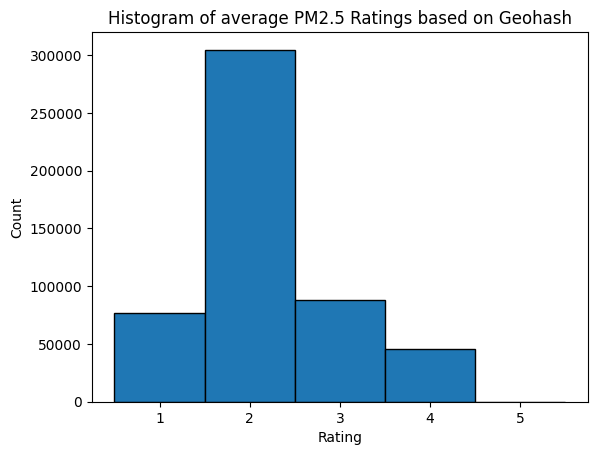

In [636]:
import matplotlib.pyplot as plt

# Plotting the histogram
plt.hist(aq25['average_rating'], bins=np.arange(1, 7) - 0.5, edgecolor='black')
plt.xticks(range(1, 6))
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Histogram of average PM2.5 Ratings based on Geohash')
plt.show()


In [637]:
import pandas as pd

# Convert the 'time' column to datetime format and extract relevant time components
aq25['time'] = pd.to_datetime(aq25['time'])
aq25['week_of_year'] = aq25['time'].dt.isocalendar().week
aq25['day_of_week_number'] = aq25['time'].dt.isocalendar().day
aq25['hour_of_day'] = aq25['time'].dt.hour

# Group by week of the year, day of the week, hour of the day, and geohash
# Then calculate the average rating, rounding it, and ensuring it's within 1-5
aq25['rounded_average_rating'] = aq25['rating'].round().clip(1, 5)
average_rating = aq25.groupby(['week_of_year', 'day_of_week_number', 'hour_of_day', 'geohash'])['rounded_average_rating'].mean().reset_index()


In [638]:
print(aq25.head())

      SensorID                time   latitude  longitude  bin0  bin1  bin2  \
0  NYCP2_CS01A 2021-09-10 12:35:04  40.847672 -73.869316    11     1     1   
1  NYCP2_CS01A 2021-09-10 12:35:08  40.847668 -73.869316    22     4     1   
2  NYCP2_CS01A 2021-09-10 12:35:13  40.847649 -73.869362    40     1     1   
3  NYCP2_CS01A 2021-09-10 12:35:18  40.847649 -73.869362    26     1     0   
4  NYCP2_CS01A 2021-09-10 12:35:23  40.847649 -73.869362    44     4     0   

   bin3  bin4  bin5  bin6  bin7  bin8  bin9  bin10  bin11  bin12  bin13  \
0     0     0     0     0     0     0     0      0      0      0      0   
1     0     0     2     0     0     0     0      0      0      0      0   
2     0     0     1     0     0     0     0      0      0      0      0   
3     0     0     0     0     0     0     0      0      0      0      0   
4     1     0     0     1     0     0     0      0      0      0      0   

   bin14  bin15  bin16  bin17  bin18  bin19  bin20  bin21  bin22  bin23  \
0    

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


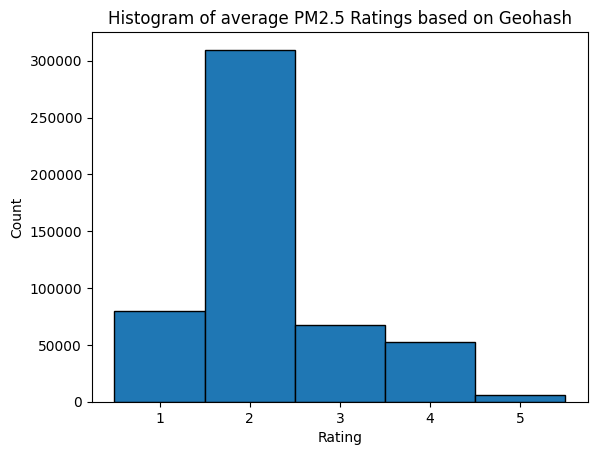

In [639]:
import matplotlib.pyplot as plt

# Plotting the histogram
plt.hist(aq25['rounded_average_rating'], bins=np.arange(1, 7) - 0.5, edgecolor='black')
plt.xticks(range(1, 6))
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Histogram of average PM2.5 Ratings based on Geohash')
plt.show()


In [640]:
print(aq25.head())

      SensorID                time   latitude  longitude  bin0  bin1  bin2  \
0  NYCP2_CS01A 2021-09-10 12:35:04  40.847672 -73.869316    11     1     1   
1  NYCP2_CS01A 2021-09-10 12:35:08  40.847668 -73.869316    22     4     1   
2  NYCP2_CS01A 2021-09-10 12:35:13  40.847649 -73.869362    40     1     1   
3  NYCP2_CS01A 2021-09-10 12:35:18  40.847649 -73.869362    26     1     0   
4  NYCP2_CS01A 2021-09-10 12:35:23  40.847649 -73.869362    44     4     0   

   bin3  bin4  bin5  bin6  bin7  bin8  bin9  bin10  bin11  bin12  bin13  \
0     0     0     0     0     0     0     0      0      0      0      0   
1     0     0     2     0     0     0     0      0      0      0      0   
2     0     0     1     0     0     0     0      0      0      0      0   
3     0     0     0     0     0     0     0      0      0      0      0   
4     1     0     0     1     0     0     0      0      0      0      0   

   bin14  bin15  bin16  bin17  bin18  bin19  bin20  bin21  bin22  bin23  \
0    

In [641]:
bin_columns = [col for col in aq25.columns if col.startswith('bin')]

# Drop these columns from the DataFrame
aq25 = aq25.drop(columns=bin_columns)

# Now df should have all the 'bin' columns removed
print(aq25.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:35:04  40.847672 -73.869316         23.7   
1  NYCP2_CS01A 2021-09-10 12:35:08  40.847668 -73.869316         23.7   
2  NYCP2_CS01A 2021-09-10 12:35:13  40.847649 -73.869362         23.7   
3  NYCP2_CS01A 2021-09-10 12:35:18  40.847649 -73.869362         23.6   
4  NYCP2_CS01A 2021-09-10 12:35:23  40.847649 -73.869362         23.6   

   humidity      pm25                    geometry  index_right neighborhood  \
0      57.3  4.508813  POINT (-73.86932 40.84767)           38   Bronx Park   
1      57.8  5.462420  POINT (-73.86932 40.84767)           38   Bronx Park   
2      57.8  5.154881  POINT (-73.86936 40.84765)           38   Bronx Park   
3      57.6  4.508813  POINT (-73.86936 40.84765)           38   Bronx Park   
4      57.5  5.539503  POINT (-73.86936 40.84765)           38   Bronx Park   

  boroughCode borough                                                @id  \
0         

### NO2: grouping data according to week, day, hour

In [642]:
import pandas as pd

# Ensure the 'time' column is in datetime format
no2['time'] = pd.to_datetime(no2['time'])

# Extract the week of the year, day of the week, and hour of the day
no2['week_of_year'] = no2['time'].dt.isocalendar().week
no2['day_of_week_number'] = no2['time'].dt.isocalendar().day
no2['hour_of_day'] = no2['time'].dt.hour  # 24-hour format

# Group by week of the year, day of the week, hour of the day, and geohash, then calculate the average rating
average_rating = no2.groupby(['week_of_year', 'day_of_week_number', 'hour_of_day', 'geohash'])['rating'].mean().reset_index()

# Rename the average rating column to make it clear
average_rating.rename(columns={'rating': 'average_rating'}, inplace=True)

# Optionally merge back to the original DataFrame to maintain all data points with their corresponding average rating
no2 = pd.merge(no2, average_rating, on=['week_of_year', 'day_of_week_number', 'hour_of_day', 'geohash'], how='left')

# Print the updated DataFrame with average ratings
print(no2.head())


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:48:03  40.847057 -73.869904         21.7   
1  NYCP2_CS01A 2021-09-10 12:48:08  40.847057 -73.869904         21.7   
2  NYCP2_CS01A 2021-09-10 12:48:13  40.847054 -73.869904         21.7   
3  NYCP2_CS01A 2021-09-10 12:48:18  40.847050 -73.869904         21.7   
4  NYCP2_CS01A 2021-09-10 12:48:23  40.847038 -73.869919         21.7   

   humidity        no2                    geometry  index_right neighborhood  \
0      61.2  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1      60.9  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2      60.7  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3      60.3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4      60.7  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0   

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


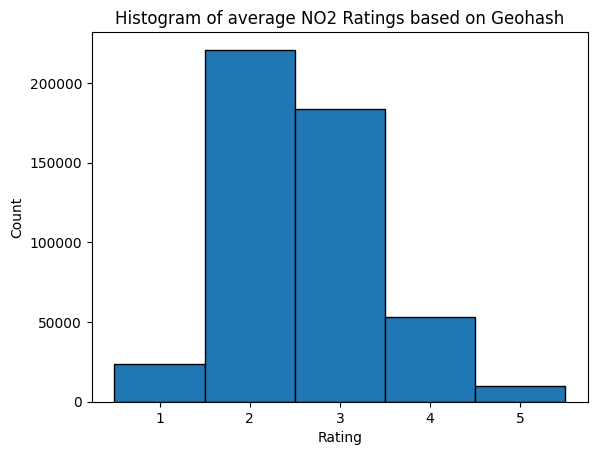

In [643]:
import matplotlib.pyplot as plt

# Plotting the histogram
plt.hist(no2['average_rating'], bins=np.arange(1, 7) - 0.5, edgecolor='black')
plt.xticks(range(1, 6))
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Histogram of average NO2 Ratings based on Geohash')
plt.show()


In [644]:
import pandas as pd

# Convert the 'time' column to datetime format and extract relevant time components
no2['time'] = pd.to_datetime(no2['time'])
no2['week_of_year'] = no2['time'].dt.isocalendar().week
no2['day_of_week_number'] = no2['time'].dt.isocalendar().day
no2['hour_of_day'] = no2['time'].dt.hour

# Group by week of the year, day of the week, hour of the day, and geohash
# Then calculate the average rating, rounding it, and ensuring it's within 1-5
no2['rounded_average_rating'] = no2['rating'].round().clip(1, 5)
average_rating = no2.groupby(['week_of_year', 'day_of_week_number', 'hour_of_day', 'geohash'])['rounded_average_rating'].mean().reset_index()


In [645]:
print(no2.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:48:03  40.847057 -73.869904         21.7   
1  NYCP2_CS01A 2021-09-10 12:48:08  40.847057 -73.869904         21.7   
2  NYCP2_CS01A 2021-09-10 12:48:13  40.847054 -73.869904         21.7   
3  NYCP2_CS01A 2021-09-10 12:48:18  40.847050 -73.869904         21.7   
4  NYCP2_CS01A 2021-09-10 12:48:23  40.847038 -73.869919         21.7   

   humidity        no2                    geometry  index_right neighborhood  \
0      61.2  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1      60.9  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2      60.7  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3      60.3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4      60.7  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0   

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


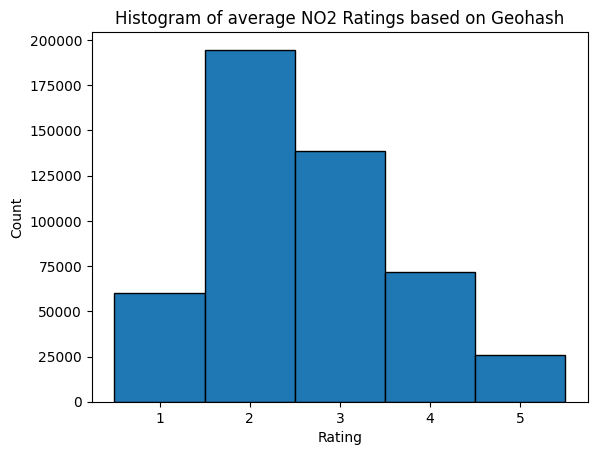

In [646]:
import matplotlib.pyplot as plt

# Plotting the histogram
plt.hist(no2['rounded_average_rating'], bins=np.arange(1, 7) - 0.5, edgecolor='black')
plt.xticks(range(1, 6))
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Histogram of average NO2 Ratings based on Geohash')
plt.show()


In [647]:
print(no2.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:48:03  40.847057 -73.869904         21.7   
1  NYCP2_CS01A 2021-09-10 12:48:08  40.847057 -73.869904         21.7   
2  NYCP2_CS01A 2021-09-10 12:48:13  40.847054 -73.869904         21.7   
3  NYCP2_CS01A 2021-09-10 12:48:18  40.847050 -73.869904         21.7   
4  NYCP2_CS01A 2021-09-10 12:48:23  40.847038 -73.869919         21.7   

   humidity        no2                    geometry  index_right neighborhood  \
0      61.2  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1      60.9  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2      60.7  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3      60.3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4      60.7  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0   

###Stratified sampling - 40%, 60%, 80%

Here we created different stratified samples based on Geohash
40%, 60% and 80% for both the PM data and the NO2 data

#### PM Data samples

In [648]:
print(aq25.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:35:04  40.847672 -73.869316         23.7   
1  NYCP2_CS01A 2021-09-10 12:35:08  40.847668 -73.869316         23.7   
2  NYCP2_CS01A 2021-09-10 12:35:13  40.847649 -73.869362         23.7   
3  NYCP2_CS01A 2021-09-10 12:35:18  40.847649 -73.869362         23.6   
4  NYCP2_CS01A 2021-09-10 12:35:23  40.847649 -73.869362         23.6   

   humidity      pm25                    geometry  index_right neighborhood  \
0      57.3  4.508813  POINT (-73.86932 40.84767)           38   Bronx Park   
1      57.8  5.462420  POINT (-73.86932 40.84767)           38   Bronx Park   
2      57.8  5.154881  POINT (-73.86936 40.84765)           38   Bronx Park   
3      57.6  4.508813  POINT (-73.86936 40.84765)           38   Bronx Park   
4      57.5  5.539503  POINT (-73.86936 40.84765)           38   Bronx Park   

  boroughCode borough                                                @id  \
0         

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [649]:
import pandas as pd
from sklearn.model_selection import train_test_split
# Stratified sampling based on geohash for different fractions
pm20, _ = train_test_split(aq25, test_size=0.8, stratify=aq25['geohash'], random_state=42)
pm40, _ = train_test_split(aq25, test_size=0.6, stratify=aq25['geohash'], random_state=42)
pm60, _ = train_test_split(aq25, test_size=0.4, stratify=aq25['geohash'], random_state=42)
pm80, _ = train_test_split(aq25, test_size=0.2, stratify=aq25['geohash'], random_state=42)

print(pm40.head())
print(pm60.head())
print(pm80.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


           SensorID                time   latitude  longitude  temperature  \
245816  NYCP2_CS03A 2021-10-28 21:39:36  40.826931 -73.898056         14.8   
156850  NYCP2_CS03A 2021-09-25 13:24:29  40.825294 -73.890907         24.8   
118206  NYCP2_CS03A 2021-09-14 15:09:39  40.816177 -73.896027         26.4   
31613   NYCP2_CS01A 2021-11-08 05:35:19  40.847195 -73.870033          8.7   
490660  NYCP2_CS02A 2021-09-10 15:41:54  40.822834 -73.869316         23.8   

        humidity       pm25                    geometry  index_right  \
245816      59.4   7.432278  POINT (-73.89806 40.82693)          176   
156850      41.1   2.145716  POINT (-73.89091 40.82529)          176   
118206      54.0  11.689648  POINT (-73.89603 40.81618)          176   
31613       60.2   2.614624  POINT (-73.87003 40.84719)           38   
490660      44.8   4.334732  POINT (-73.86932 40.82283)          266   

       neighborhood boroughCode borough  \
245816     Longwood           2   Bronx   
156850     L

In [650]:
print(pm20.shape)
print(pm40.shape)
print(pm60.shape)
print(pm80.shape)

(103163, 24)
(206327, 24)
(309491, 24)
(412655, 24)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### NO2 Data samples

In [651]:
print(no2.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:48:03  40.847057 -73.869904         21.7   
1  NYCP2_CS01A 2021-09-10 12:48:08  40.847057 -73.869904         21.7   
2  NYCP2_CS01A 2021-09-10 12:48:13  40.847054 -73.869904         21.7   
3  NYCP2_CS01A 2021-09-10 12:48:18  40.847050 -73.869904         21.7   
4  NYCP2_CS01A 2021-09-10 12:48:23  40.847038 -73.869919         21.7   

   humidity        no2                    geometry  index_right neighborhood  \
0      61.2  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1      60.9  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2      60.7  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3      60.3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4      60.7  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0   

In [652]:
## due to sparsity in NO2 data "geohash" will have to be shortened:
# Truncate geohash to a shorter length
no2['short_geohash'] = no2['geohash'].str[:4]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [653]:
print(no2.head())
print(no2.shape)

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:48:03  40.847057 -73.869904         21.7   
1  NYCP2_CS01A 2021-09-10 12:48:08  40.847057 -73.869904         21.7   
2  NYCP2_CS01A 2021-09-10 12:48:13  40.847054 -73.869904         21.7   
3  NYCP2_CS01A 2021-09-10 12:48:18  40.847050 -73.869904         21.7   
4  NYCP2_CS01A 2021-09-10 12:48:23  40.847038 -73.869919         21.7   

   humidity        no2                    geometry  index_right neighborhood  \
0      61.2  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1      60.9  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2      60.7  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3      60.3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4      60.7  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0   

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [654]:
# prompt: get geohash counts that are minimum

min_count = no2['short_geohash'].value_counts().min()
print("Minimum geohash count:", min_count)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Minimum geohash count: 254


In [655]:
import pandas as pd
from sklearn.model_selection import train_test_split
# Stratified sampling based on geohash for different fractions
no2_20, _ = train_test_split(no2, test_size=0.8, stratify=no2['short_geohash'], random_state=42)
no2_40, _ = train_test_split(no2, test_size=0.6, stratify=no2['short_geohash'], random_state=42)
no2_60, _ = train_test_split(no2, test_size=0.4, stratify=no2['short_geohash'], random_state=42)
no2_80, _ = train_test_split(no2, test_size=0.2, stratify=no2['short_geohash'], random_state=42)

print(no2_20.head())
print(no2_40.head())
print(no2_60.head())
print(no2_80.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


           SensorID                time   latitude  longitude  temperature  \
26989   NYCP2_CS03A 2021-11-19 16:40:25  40.845989 -73.870377         12.3   
262887  NYCP2_CS03A 2021-12-14 11:31:12  40.824444 -73.897682         10.6   
329910  NYCP2_CS03A 2021-09-16 15:51:52  40.809887 -73.883118         26.6   
24070   NYCP2_CS01A 2021-12-05 22:03:32  40.845066 -73.870857          9.1   
397259  NYCP2_CS04A 2021-10-16 16:06:45  40.802368 -73.872971         26.4   

        humidity        no2                    geometry  index_right  \
26989       30.6   6.213868  POINT (-73.87038 40.84599)           38   
262887      31.5  17.167942  POINT (-73.89768 40.82444)          176   
329910      56.9   5.167519  POINT (-73.88312 40.80989)          140   
24070       37.4  15.453095  POINT (-73.87086 40.84507)           38   
397259      62.5  11.315091  POINT (-73.87297 40.80237)          140   

       neighborhood boroughCode borough  \
26989    Bronx Park           2   Bronx   
262887     L

In [656]:
print(no2_20.shape)
print(no2_40.shape)
print(no2_60.shape)
print(no2_80.shape)

(98364, 24)
(196728, 24)
(295093, 24)
(393457, 24)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### PM & NO2 - converting data to geodataframe

In [657]:
#PM
import geopandas as gpd
pm_gdf = gpd.GeoDataFrame(aq25, geometry='geometry')
print(pm_gdf.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:35:04  40.847672 -73.869316         23.7   
1  NYCP2_CS01A 2021-09-10 12:35:08  40.847668 -73.869316         23.7   
2  NYCP2_CS01A 2021-09-10 12:35:13  40.847649 -73.869362         23.7   
3  NYCP2_CS01A 2021-09-10 12:35:18  40.847649 -73.869362         23.6   
4  NYCP2_CS01A 2021-09-10 12:35:23  40.847649 -73.869362         23.6   

   humidity      pm25                    geometry  index_right neighborhood  \
0      57.3  4.508813  POINT (-73.86932 40.84767)           38   Bronx Park   
1      57.8  5.462420  POINT (-73.86932 40.84767)           38   Bronx Park   
2      57.8  5.154881  POINT (-73.86936 40.84765)           38   Bronx Park   
3      57.6  4.508813  POINT (-73.86936 40.84765)           38   Bronx Park   
4      57.5  5.539503  POINT (-73.86936 40.84765)           38   Bronx Park   

  boroughCode borough                                                @id  \
0         

In [658]:
#NO2
import geopandas as gpd
no2_gdf = gpd.GeoDataFrame(no2, geometry='geometry')
print(no2_gdf.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:48:03  40.847057 -73.869904         21.7   
1  NYCP2_CS01A 2021-09-10 12:48:08  40.847057 -73.869904         21.7   
2  NYCP2_CS01A 2021-09-10 12:48:13  40.847054 -73.869904         21.7   
3  NYCP2_CS01A 2021-09-10 12:48:18  40.847050 -73.869904         21.7   
4  NYCP2_CS01A 2021-09-10 12:48:23  40.847038 -73.869919         21.7   

   humidity        no2                    geometry  index_right neighborhood  \
0      61.2  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1      60.9  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2      60.7  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3      60.3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4      60.7  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0   

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [659]:
# Load the GeoJSON into a GeoDataFrame
streets_gdf = gpd.read_file('https://raw.githubusercontent.com/r6541/NYC_taxi_data_ESTDA/main/nyc-streets.geojson')

# Set the geometry column to 'geometry'
streets_gdf = streets_gdf.set_geometry('geometry')
print(streets_gdf.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  STATEFP COUNTYFP      LINEARID      FULLNAME RTTYP  MTFCC  \
0      36      005  110391528508  Longwood Ave     M  S1400   
1      36      005  110391524085    E 149th St     M  S1400   
2      36      005  110391528025    Timpson Pl     M  S1400   
3      36      005  110391523563        I- 278     I  S1100   
4      36      005  110391524522      Barry St     M  S1400   

                                            geometry  
0  MULTILINESTRING ((-73.90002 40.81860, -73.8998...  
1  LINESTRING (-73.91763 40.81605, -73.91677 40.8...  
2  LINESTRING (-73.90647 40.80956, -73.90625 40.8...  
3  LINESTRING (-73.91863 40.79910, -73.91834 40.7...  
4  LINESTRING (-73.89560 40.81168, -73.89539 40.8...  


####Converting samples to geodataframes

In [660]:
#PM
import geopandas as gpd
pm40_gdf = gpd.GeoDataFrame(pm40, geometry='geometry')
pm60_gdf = gpd.GeoDataFrame(pm60, geometry='geometry')
pm80_gdf = gpd.GeoDataFrame(pm80, geometry='geometry')
print(pm40_gdf.head())
print(pm60_gdf.head())
print(pm80_gdf.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


           SensorID                time   latitude  longitude  temperature  \
245816  NYCP2_CS03A 2021-10-28 21:39:36  40.826931 -73.898056         14.8   
156850  NYCP2_CS03A 2021-09-25 13:24:29  40.825294 -73.890907         24.8   
118206  NYCP2_CS03A 2021-09-14 15:09:39  40.816177 -73.896027         26.4   
31613   NYCP2_CS01A 2021-11-08 05:35:19  40.847195 -73.870033          8.7   
490660  NYCP2_CS02A 2021-09-10 15:41:54  40.822834 -73.869316         23.8   

        humidity       pm25                    geometry  index_right  \
245816      59.4   7.432278  POINT (-73.89806 40.82693)          176   
156850      41.1   2.145716  POINT (-73.89091 40.82529)          176   
118206      54.0  11.689648  POINT (-73.89603 40.81618)          176   
31613       60.2   2.614624  POINT (-73.87003 40.84719)           38   
490660      44.8   4.334732  POINT (-73.86932 40.82283)          266   

       neighborhood boroughCode borough  \
245816     Longwood           2   Bronx   
156850     L

In [661]:
#NO2
import geopandas as gpd
no2_40gdf = gpd.GeoDataFrame(no2_40, geometry='geometry')
no2_60gdf = gpd.GeoDataFrame(no2_60, geometry='geometry')
no2_80gdf = gpd.GeoDataFrame(no2_80, geometry='geometry')

print(no2_40gdf.head())
print(no2_60gdf.head())
print(no2_80gdf.head())

           SensorID                time   latitude  longitude  temperature  \
82824   NYCP2_CS02A 2021-10-28 16:34:20  40.817616 -73.898270         14.9   
233353  NYCP2_CS03A 2021-11-08 19:33:24  40.818813 -73.898460         19.9   
298294  NYCP2_CS02A 2021-10-29 16:57:38  40.813015 -73.889641         15.1   
433254  NYCP2_CS01A 2021-10-07 15:54:37  40.806141 -73.909386         26.3   
303926  NYCP2_CS02A 2021-11-05 16:00:18  40.814156 -73.885544         12.8   

        humidity        no2                    geometry  index_right  \
82824       57.4   7.856401  POINT (-73.89827 40.81762)          176   
233353      34.0   4.529729  POINT (-73.89846 40.81881)          176   
298294      69.3   5.903144  POINT (-73.88964 40.81302)          140   
433254      55.0  16.535676  POINT (-73.90939 40.80614)          195   
303926      37.8   5.556847  POINT (-73.88554 40.81416)          140   

       neighborhood boroughCode borough  \
82824      Longwood           2   Bronx   
233353     L

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Shortest Path - Population data: from Richard Morris Hunt to Hotel Belleclaire

In [662]:
#imports:
import altair as alt
import geopandas as gpd
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [663]:
# Hide warnings due to issue in shapely package
# See: https://github.com/shapely/shapely/issues/1345
np.seterr(invalid="ignore");

In [664]:
!pip install osmnx
import osmnx as ox

In [665]:
nyc = ox.geocode_to_gdf("New York, USA")

print(nyc.head())
print(nyc.crs)

                                            geometry  bbox_north  bbox_south  \
0  MULTIPOLYGON (((-74.25884 40.49887, -74.25814 ...    40.91763   40.476578   

   bbox_east  bbox_west   place_id  osm_type  osm_id        lat        lon  \
0 -73.700233 -74.258843  371663561  relation  175905  40.712728 -74.006015   

      class            type  place_rank  importance addresstype      name  \
0  boundary  administrative          10    0.817577        city  New York   

              display_name  
0  New York, United States  
epsg:4326


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


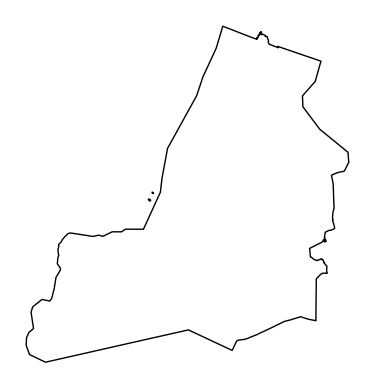

In [666]:
# Project it to Web Mercator first and plot
ax = nyc.to_crs(epsg=3857).plot(facecolor="none", edgecolor="black")
ax.set_axis_off()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


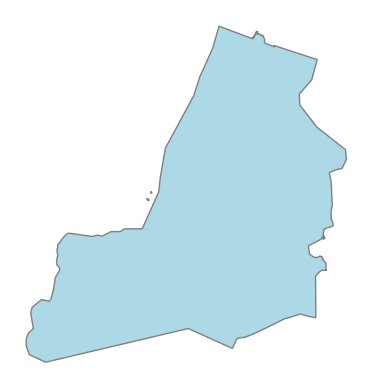

In [667]:
ax = ox.project_gdf(nyc).plot(fc="lightblue", ec="gray")
ax.set_axis_off()

In [668]:
#'amenity', 'building', 'landuse', 'highway', tourism
#amenities = ox.features_from_place("New York, USA", tags={"amenity": True})
tourism = ox.features_from_place("New York, USA", tags={"tourism": True})
#building = ox.features_from_place("New York, USA", tags={"building": True})
#landuse = ox.features_from_place("New York, USA", tags={"landuse": True})
#highway = ox.features_from_place("New York, USA", tags={"highway": True})

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [669]:
print(len(tourism))
#print(len(amenities))
#print(len(building))
#print(len(landuse))
#print(len(highway))

3220


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


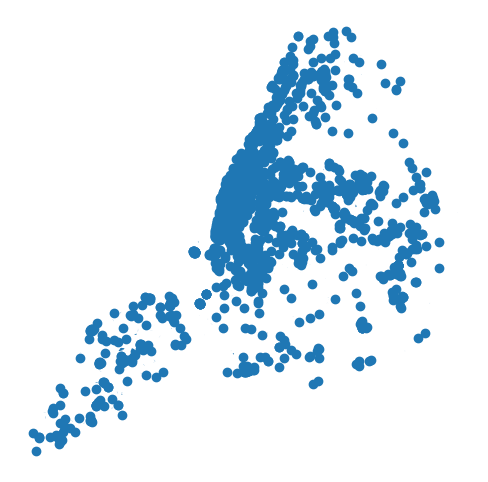

In [670]:
fig, ax = plt.subplots(figsize=(10, 6))

ax = tourism.plot(ax=ax)
ax.set_axis_off()

In [671]:
"""
fig, ax = plt.subplots(figsize=(10, 6))

ax = building.plot(ax=ax)
ax.set_axis_off()
"""
"""
fig, ax = plt.subplots(figsize=(10, 6))

ax = landuse.plot(ax=ax)
ax.set_axis_off()
"""
"""
fig, ax = plt.subplots(figsize=(10, 6))

ax = highwa.plot(ax=ax)
ax.set_axis_off()
"""
"""
fig, ax = plt.subplots(figsize=(10, 6))

ax = amenities.plot(ax=ax)
ax.set_axis_off()
"""

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'\nfig, ax = plt.subplots(figsize=(10, 6))\n\nax = amenities.plot(ax=ax)\nax.set_axis_off()\n'

In [672]:
G = ox.graph_from_polygon(nyc.geometry[0], network_type="drive")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


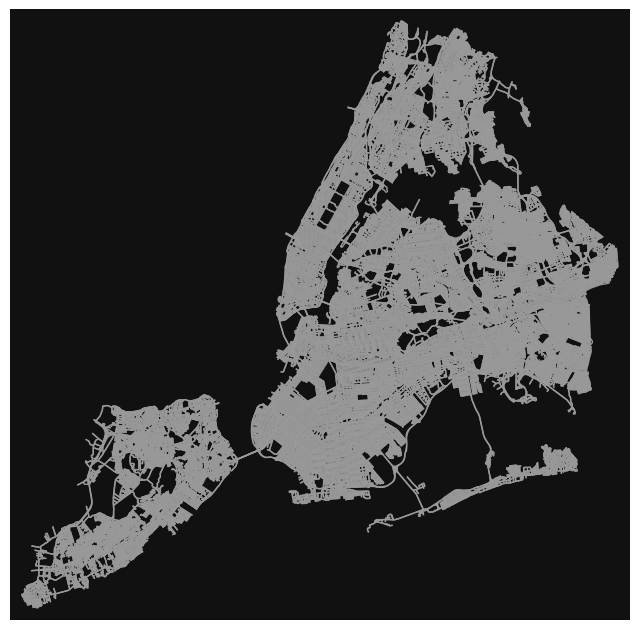

In [673]:
ox.plot_graph(G, node_size=0);

In [674]:
"""
G = ox.graph_from_polygon(nyc.geometry[0], network_type="walk")
ox.plot_graph(G, node_size=0);
"""

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'\nG = ox.graph_from_polygon(nyc.geometry[0], network_type="walk")\nox.plot_graph(G, node_size=0);\n'

In [675]:
nyc_url = 'https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/nyc_polygon.geojson'
nycPolygon = read_file(nyc_url)

In [676]:
print(nycPolygon.head())
print(nycPolygon.crs)

      neighborhood boroughCode        borough  \
0         Allerton           2          Bronx   
1  Alley Pond Park           4         Queens   
2    Arden Heights           5  Staten Island   
3        Arlington           5  Staten Island   
4         Arrochar           5  Staten Island   

                                                 @id  \
0  http://nyc.pediacities.com/Resource/Neighborho...   
1  http://nyc.pediacities.com/Resource/Neighborho...   
2  http://nyc.pediacities.com/Resource/Neighborho...   
3  http://nyc.pediacities.com/Resource/Neighborho...   
4  http://nyc.pediacities.com/Resource/Neighborho...   

                                            geometry  
0  POLYGON ((-73.84860 40.87167, -73.84582 40.870...  
1  POLYGON ((-73.74333 40.73888, -73.74371 40.739...  
2  POLYGON ((-74.16983 40.56108, -74.16982 40.561...  
3  POLYGON ((-74.15975 40.64142, -74.15998 40.641...  
4  POLYGON ((-74.06078 40.59319, -74.06079 40.593...  
EPSG:4326


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


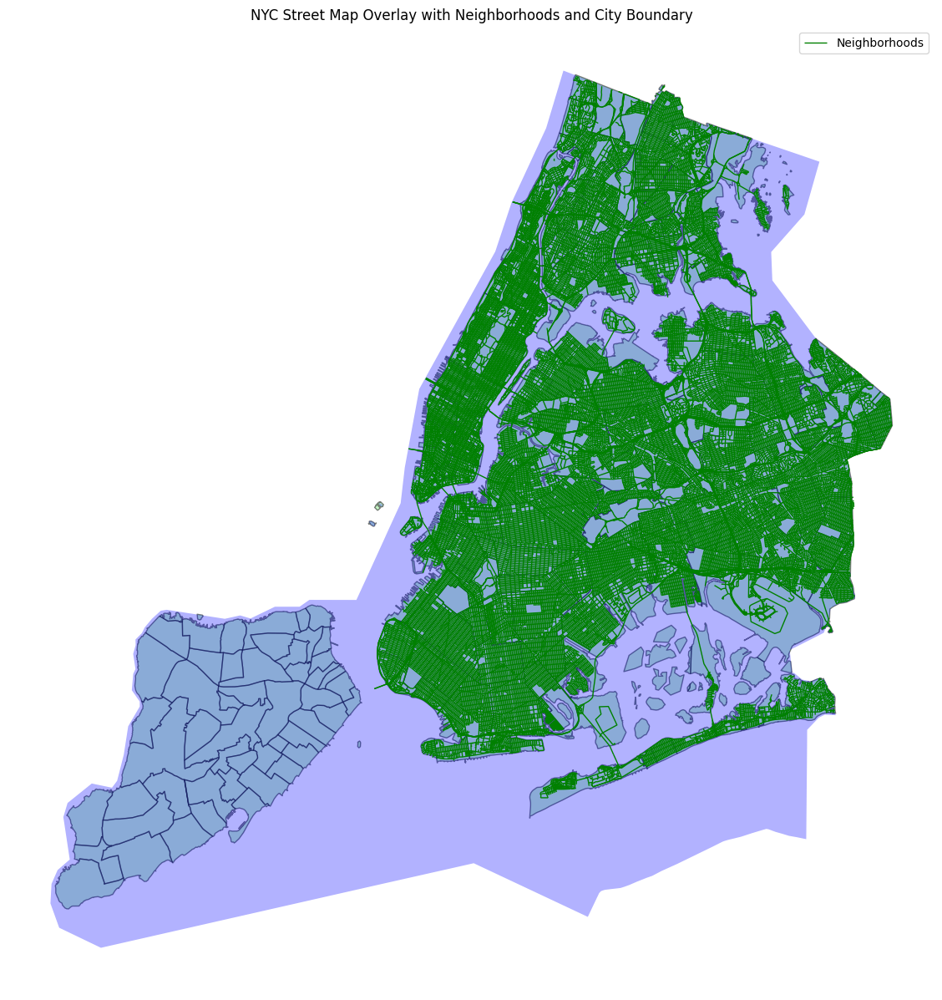

In [677]:
import geopandas as gpd
import matplotlib.pyplot as plt



# Check CRS and convert if necessary
if streets_gdf.crs != "EPSG:4326":
    streets_gdf = streets_gdf.to_crs("EPSG:4326")
if nyc.crs != "EPSG:4326":
    nyc = nyc.to_crs("EPSG:4326")
if nycPolygon.crs != "EPSG:4326":
    nycPolygon = nycPolygon.to_crs("EPSG:4326")

# Create a plot
fig, ax = plt.subplots(figsize=(15, 15))

# Plot each dataset with different styles
nycPolygon.plot(ax=ax, color='lightgreen', edgecolor='black', alpha=0.5)  # Neighborhood polygons
nyc.plot(ax=ax, color='blue', alpha=0.3)  # City outline or area
streets_gdf.plot(ax=ax, color='green', linewidth=1)  # Streets

# Set title and legend
ax.set_title('NYC Street Map Overlay with Neighborhoods and City Boundary')
ax.legend(['Neighborhoods', 'City Boundary', 'Streets'])

# Remove axis for better visual appearance
ax.set_axis_off()

# Show the plot
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-678-e13314414c4b>:6: FutureWarning: The `utils.config` function is deprecated and will be removed in the v2.0.0 release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ox.config(use_cache=True, log_console=True)


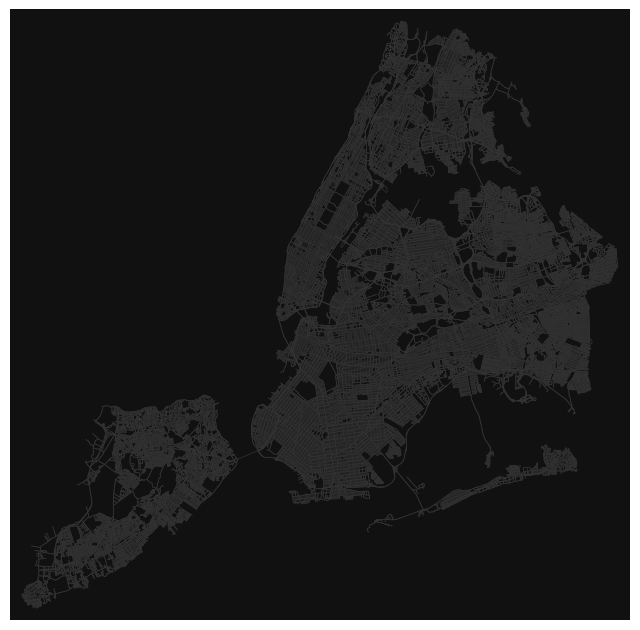

In [678]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Set up the configuration for osmnx to log its process and use cache for speed
ox.config(use_cache=True, log_console=True)


# You might need to ensure that the data is suitable for osmnx, which usually needs a shapely polygon
area_of_interest = nycPolygon.unary_union  # This combines all polygons into a single one, if you have multiple

# Get the walking network graph within the specified polygon
G_drive = ox.graph_from_polygon(area_of_interest, network_type='drive') # using drive because walk takes too long

# Plot the network
fig, ax = ox.plot_graph(G_drive, node_size=0, edge_linewidth=0.5, edge_color="#333333")
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


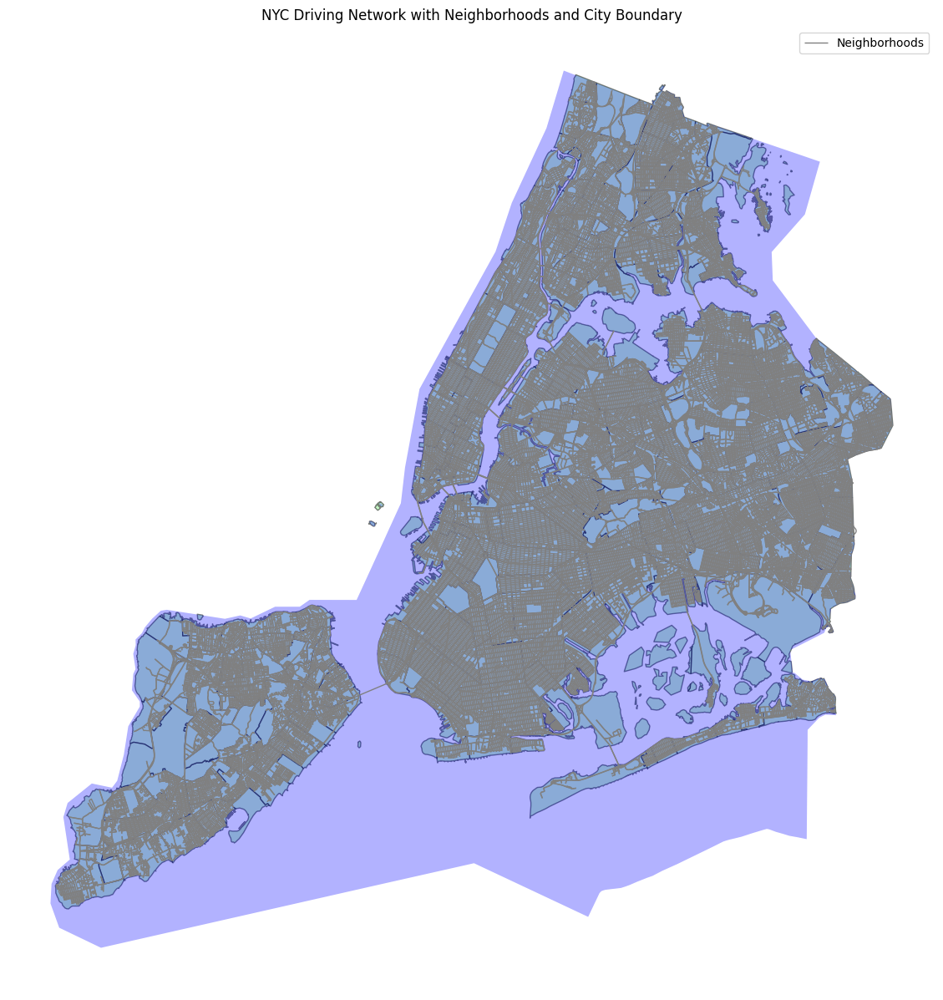

In [679]:
# Convert the network graph to GeoDataFrames
edges_gdf = ox.graph_to_gdfs(G_drive, nodes=False, edges=True)

# Create a plot
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the neighborhood and city boundaries first
nycPolygon.plot(ax=ax, color='lightgreen', edgecolor='black', alpha=0.5)
nyc.plot(ax=ax, color='blue', alpha=0.3)

# Then plot the walking network
edges_gdf.plot(ax=ax, linewidth=1, edgecolor='gray')

# Customize the plot
ax.set_title('NYC Driving Network with Neighborhoods and City Boundary')
ax.legend(['Neighborhoods', 'City Boundary', 'Walking Network'])
ax.set_axis_off()

# Show the plot
plt.show()


In [680]:
!pip install mapclassify
import mapclassify

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


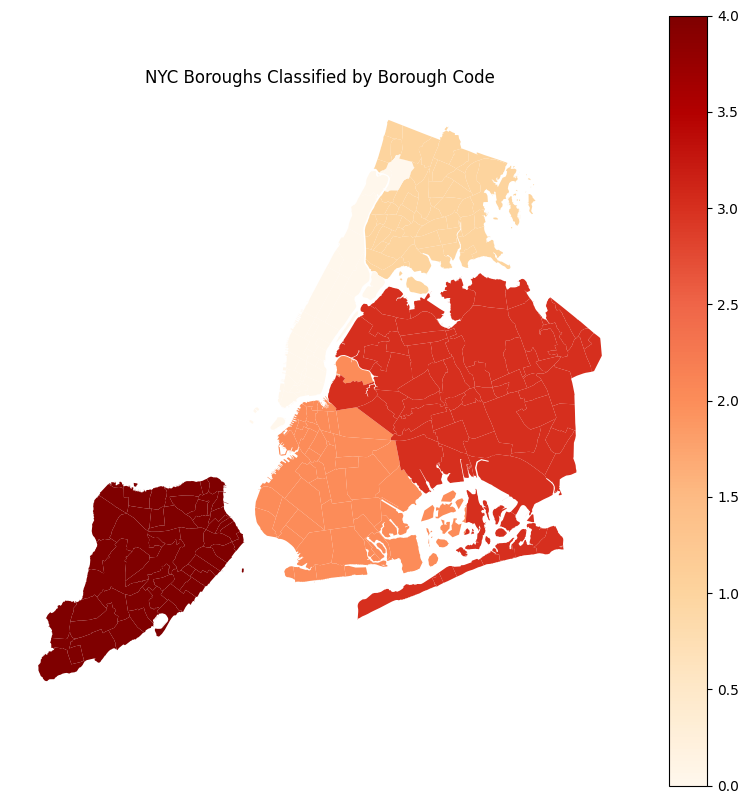

In [681]:
# Ensure your GeoDataFrames are loaded and have the correct CRS
nycPolygon = nycPolygon.to_crs(epsg=4326)

# Using a simple classification to demonstrate; ensure you have a numeric column for more meaningful classifications
classifier = mapclassify.NaturalBreaks.make(k=5)  # Using Natural Breaks classification, adjust 'k' as needed, 5 is good

# You might need to convert a categorical to a numeric value if needed; here, we pretend 'boroughCode' is numeric
# For actual numeric data, replace 'boroughCode' with that column
nycPolygon['boroughCode_numeric'] = nycPolygon['boroughCode'].astype(int)

# Apply classification
nycPolygon['class'] = nycPolygon[['boroughCode_numeric']].apply(classifier)

# Create plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

nycPolygon.plot(column='class', cmap='OrRd', legend=True, ax=ax)

# Styling
ax.set_title('NYC Boroughs Classified by Borough Code')
ax.set_axis_off()

plt.show()

In [682]:
print(type(edges_gdf))
print(edges_gdf.crs)
print(edges_gdf.head())

<class 'geopandas.geodataframe.GeoDataFrame'>
epsg:4326
                                                  osmid  oneway  \
u        v         key                                            
39076461 42854803  0                           25161578    True   
         274283981 0              [122633397, 25161349]    True   
39076490 277672046 0                            5699971    True   
         277672005 0                         1014007069    True   
39076504 462124701 0    [618709517, 618709515, 5700693]    True   

                              highway reversed   length  \
u        v         key                                    
39076461 42854803  0    motorway_link    False  254.709   
         274283981 0         motorway    False  767.800   
39076490 277672046 0    motorway_link    False  259.674   
         277672005 0         motorway    False  291.839   
39076504 462124701 0    motorway_link    False  433.148   

                                                            

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [683]:
# only get the edges
cc_edges = ox.graph_to_gdfs(G_drive, edges=True, nodes=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [684]:
# we have lots of data associated with each edge!
cc_edges.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid  oneway  \
u        v         key                                            
39076461 42854803  0                           25161578    True   
         274283981 0              [122633397, 25161349]    True   
39076490 277672046 0                            5699971    True   
         277672005 0                         1014007069    True   
39076504 462124701 0    [618709517, 618709515, 5700693]    True   

                              highway reversed   length  \
u        v         key                                    
39076461 42854803  0    motorway_link    False  254.709   
         274283981 0         motorway    False  767.800   
39076490 277672046 0    motorway_link    False  259.674   
         277672005 0         motorway    False  291.839   
39076504 462124701 0    motorway_link    False  433.148   

                                                                 geometry  \
u        v         key                                                      
39076461 42854803  0    LINESTRING (-73.79463 40.78641, -73.79361 40.7...   
         274283981 0    LINESTRING (-73.79463 40.78641, -73.79309 40.7...   
39076490 277672046 0    LINESTRING (-73.75709 40.76243, -73.75721 40.7...   
         277672005 0    LINESTRING (-73.75709 40.76243, -73.75741 40.7...   
39076504 462124701 0    LINESTRING (-73.74416 40.75347, -73.74453 40.7...   

                       lanes  ref                  name maxspeed bridge  \
u        v         key                                                    
39076461 42854803  0     NaN  NaN                   NaN      NaN    NaN   
         274283981 0       2   CI  Cross Island Parkway   50 mph    NaN   
39076490 277672046 0     NaN  NaN                   NaN      NaN    NaN   
         277672005 0       3   CI  Cross Island Parkway   50 mph    NaN   
39076504 462124701 0       1  NaN                   NaN      NaN    yes   

                       access tunnel width junction est_width  
u        v         key                                         
39076461 42854803  0      NaN    NaN   NaN      NaN       NaN  
         274283981 0      NaN    NaN   NaN      NaN       NaN  
39076490 277672046 0      NaN    NaN   NaN      NaN       NaN  
         277672005 0      NaN    NaN   NaN      NaN       NaN  
39076504 462124701 0      NaN    NaN   NaN      NaN       NaN

In [685]:
len(tourism)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


3220

In [686]:
tourism.head(20)

highway                    geometry  alt_name  ele  \
element_type osmid                                                          
node         158801311     NaN  POINT (-73.97958 40.72510)  Loisaida    4   
             158809984     NaN  POINT (-73.99875 40.72288)       NaN    9   
             158862484     NaN  POINT (-73.97139 40.74862)       NaN   18   
             320948228     NaN  POINT (-74.00291 40.70575)       NaN  NaN   
             357582588     NaN  POINT (-73.81875 40.58427)       NaN    2   
             357618558     NaN  POINT (-73.99725 40.73227)       NaN    7   
             357620718     NaN  POINT (-73.96799 40.77146)       NaN   26   
             357621823     NaN  POINT (-73.97648 40.79411)       NaN   19   
             368042980     NaN  POINT (-73.99710 40.72148)       NaN  NaN   
             368043598     NaN  POINT (-74.00215 40.73380)       NaN    7   
             368043670     NaN  POINT (-74.00644 40.74709)       NaN    2   
             368052081     NaN  POINT (-74.01135 40.70339)       NaN  NaN   
             368061337     NaN  POINT (-74.01375 40.70403)       NaN    3   
             368061366     NaN  POINT (-73.98412 40.75933)       NaN   15   
             368061418     NaN  POINT (-73.98117 40.78238)       NaN   24   
             368061423     NaN  POINT (-73.98250 40.78194)       NaN   25   
             368061518     NaN  POINT (-73.91995 40.83109)       NaN   27   
             368061605     NaN  POINT (-73.99383 40.73798)       NaN   11   
             368061607     NaN  POINT (-74.00491 40.72510)       NaN   16   
             368061644     NaN  POINT (-73.92401 40.75619)       NaN   11   

                       gnis:feature_id  \
element_type osmid                       
node         158801311         2062665   
             158809984         2045148   
             158862484         2083304   
             320948228             NaN   
             357582588          962744   
             357618558         2080738   
             357620718         2083525   
             357621823         2084645   
             368042980         2063269   
             368043598         2082946   
             368043670         2083022   
             368052081         2057419   
             368061337         2057415   
             368061366         2083221   
             368061418         2083403   
             368061423         2083398   
             368061518         2072320   
             368061605         2091590   
             368061607         2091587   
             368061644         2079317   

                                                                     name  \
element_type osmid                                                          
node         158801311                                      Alphabet City   
             158809984                                               SoHo   
             158862484                                         Tudor City   
             320948228                               South Street Seaport   
             357582588                     Rockaway Playland (historical)   
             357618558  New York Studio School of Drawing, Painting an...   
             357620718                                Richard Morris Hunt   
             357621823                               Joan of Arc Memorial   
             368042980                Storefront for Art and Architecture   
             368043598                                      Stonewall Inn   
             368043670                               Paula Cooper Gallery   
             368052081                             Fraunces Tavern Museum   
             368061337             National Museum of the American Indian   
             368061366               Times Square Museum & Visitor Center   
             368061418                                  Hotel Belleclaire   
             368061423                                    Hotel Churchill   
             3680

### Shortest path according to distance

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


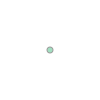

In [687]:
Richard_Morris_Hunt = tourism[tourism['name'] == 'Richard Morris Hunt'].squeeze()
Richard_Morris_Hunt.geometry


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


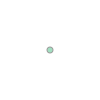

In [688]:
Hotel_Belleclaire = tourism[tourism['name'] == 'Hotel Belleclaire'].squeeze()
Hotel_Belleclaire.geometry

In [689]:
%timeit -r 1 -n 50

Richard_Morris_Hunt_x = Richard_Morris_Hunt.geometry.x
Richard_Morris_Hunt_y = Richard_Morris_Hunt.geometry.y
Hotel_Belleclaire_x = Hotel_Belleclaire.geometry.x
Hotel_Belleclaire_y = Hotel_Belleclaire.geometry.y
# Get the origin node
orig_node = ox.nearest_nodes(G_drive, Richard_Morris_Hunt_x, Richard_Morris_Hunt_y)

# Get the destination node
dest_node = ox.nearest_nodes(G_drive, Hotel_Belleclaire_x, Hotel_Belleclaire_y)
# get the shortest path --> just a list of node IDs
route1 = ox.shortest_path(G_drive, orig_node, dest_node, weight="length")

route1

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


499500


##### Average execution time after 50 runs:

In [690]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Plot distance using distance

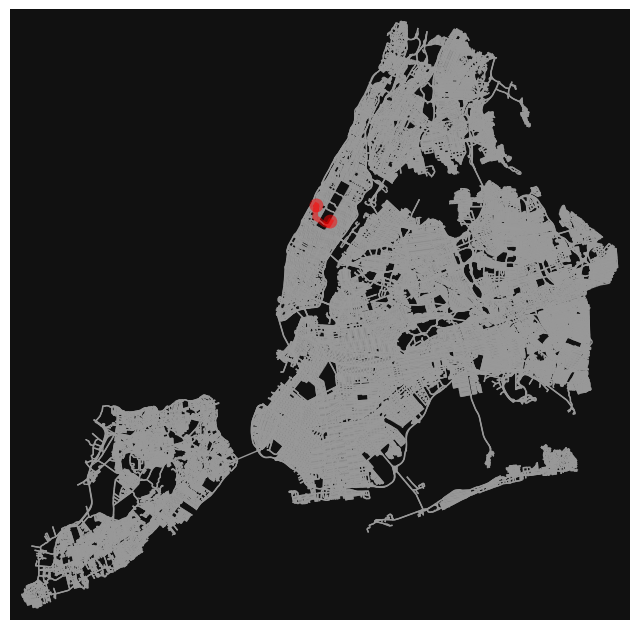

In [691]:
ox.plot_graph_route(G_drive, route1, node_size=0);

In [692]:
ox.utils_graph.route_to_gdf(G_drive, route1, weight="length").explore(
    tiles="cartodb positron",
    color="red",
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-692-e32761e55ddb>:1: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ox.utils_graph.route_to_gdf(G_drive, route1, weight="length").explore(


#### convert route to linestring

In [693]:
print(route1)

[42429680, 42455693, 42431671, 42437423, 42447228, 42457788, 247223720, 7802856352, 3718672443, 1061531707, 1061531527, 1061531787, 1061531608, 1061531597, 1996323622, 1061531491, 6207264908, 42432564, 1061531757, 1061531500, 1061531634, 1061531566, 1061531695, 42428648]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [694]:
"""
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in route1]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/route1.geojson'
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
"""

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in route1]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/route1.geojson\'\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

### Shortest path  Using PM value rating

In [695]:
# impute speed on all edges missing data
G_drive = ox.add_edge_speeds(G_drive)

# calculate travel time (seconds) for all edges
G_drive = ox.add_edge_travel_times(G_drive)

In [696]:
cc_edges.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid  oneway  \
u        v         key                                            
39076461 42854803  0                           25161578    True   
         274283981 0              [122633397, 25161349]    True   
39076490 277672046 0                            5699971    True   
         277672005 0                         1014007069    True   
39076504 462124701 0    [618709517, 618709515, 5700693]    True   

                              highway reversed   length  \
u        v         key                                    
39076461 42854803  0    motorway_link    False  254.709   
         274283981 0         motorway    False  767.800   
39076490 277672046 0    motorway_link    False  259.674   
         277672005 0         motorway    False  291.839   
39076504 462124701 0    motorway_link    False  433.148   

                                                                 geometry  \
u        v         key                                                      
39076461 42854803  0    LINESTRING (-73.79463 40.78641, -73.79361 40.7...   
         274283981 0    LINESTRING (-73.79463 40.78641, -73.79309 40.7...   
39076490 277672046 0    LINESTRING (-73.75709 40.76243, -73.75721 40.7...   
         277672005 0    LINESTRING (-73.75709 40.76243, -73.75741 40.7...   
39076504 462124701 0    LINESTRING (-73.74416 40.75347, -73.74453 40.7...   

                       lanes  ref                  name maxspeed bridge  \
u        v         key                                                    
39076461 42854803  0     NaN  NaN                   NaN      NaN    NaN   
         274283981 0       2   CI  Cross Island Parkway   50 mph    NaN   
39076490 277672046 0     NaN  NaN                   NaN      NaN    NaN   
         277672005 0       3   CI  Cross Island Parkway   50 mph    NaN   
39076504 462124701 0       1  NaN                   NaN      NaN    yes   

                       access tunnel width junction est_width  
u        v         key                                         
39076461 42854803  0      NaN    NaN   NaN      NaN       NaN  
         274283981 0      NaN    NaN   NaN      NaN       NaN  
39076490 277672046 0      NaN    NaN   NaN      NaN       NaN  
         277672005 0      NaN    NaN   NaN      NaN       NaN  
39076504 462124701 0      NaN    NaN   NaN      NaN       NaN

In [697]:
print(pm_gdf.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:35:04  40.847672 -73.869316         23.7   
1  NYCP2_CS01A 2021-09-10 12:35:08  40.847668 -73.869316         23.7   
2  NYCP2_CS01A 2021-09-10 12:35:13  40.847649 -73.869362         23.7   
3  NYCP2_CS01A 2021-09-10 12:35:18  40.847649 -73.869362         23.6   
4  NYCP2_CS01A 2021-09-10 12:35:23  40.847649 -73.869362         23.6   

   humidity      pm25                    geometry  index_right neighborhood  \
0      57.3  4.508813  POINT (-73.86932 40.84767)           38   Bronx Park   
1      57.8  5.462420  POINT (-73.86932 40.84767)           38   Bronx Park   
2      57.8  5.154881  POINT (-73.86936 40.84765)           38   Bronx Park   
3      57.6  4.508813  POINT (-73.86936 40.84765)           38   Bronx Park   
4      57.5  5.539503  POINT (-73.86936 40.84765)           38   Bronx Park   

  boroughCode borough                                                @id  \
0         

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [698]:
#Computing route 1 - based on length
route1 = ox.shortest_path(G_drive, orig_node, dest_node, weight="length")  # Minimizing length

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Ensure CRS compatibility between your sensor data and the street network.
Convert the network graph to a GeoDataFrame for spatial operations.
Spatially join the sensor data to the nearest network edges.
Update the network graph's edge weights based on the sensor ratings.
Compute and visualize the shortest path using these updated weights.

Why the inverse of the weight is being used?

In practical terms, using the inverse of the rating amplifies differences among lower ratings while still recognizing that any rated path is better than paths with extremely high ratings. It provides a balanced approach to ensuring that the best paths (according to the rating system used) are chosen more frequently by the routing algorithm, without completely disregarding paths that are rated poorly but might be necessary for reaching certain destinations.

This method is particularly effective in applications where you want to maximize a positive attribute (like safety or air quality) that is inversely related to a numeric rating or where ratings reflect a cost or risk that should be minimized

In [699]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and pm_gdf with necessary columns
assert 'latitude' in pm_gdf.columns and 'longitude' in pm_gdf.columns and 'rating' in pm_gdf.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for pm_gdf to match G_drive's graph CRS
pm_gdf['geometry'] = pm_gdf.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
pm_gdf = pm_gdf.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for pm_gdf
pm_gdf['geohash'] = pm_gdf.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(pm_gdf[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Richard_Morris_Hunt_x, Richard_Morris_Hunt_y = Richard_Morris_Hunt.geometry.x, Richard_Morris_Hunt.geometry.y
Hotel_Belleclaire_x, Hotel_Belleclaire_y = Hotel_Belleclaire.geometry.x, Hotel_Belleclaire.geometry.y

orig_node = ox.nearest_nodes(G_drive, Richard_Morris_Hunt_x, Richard_Morris_Hunt_y)
dest_node = ox.nearest_nodes(G_drive, Hotel_Belleclaire_x, Hotel_Belleclaire_y)



# Compute PM  route

route2 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

499500


##### Average execution time after 50 runs:

In [700]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### plotting shortest route: PM vs distance

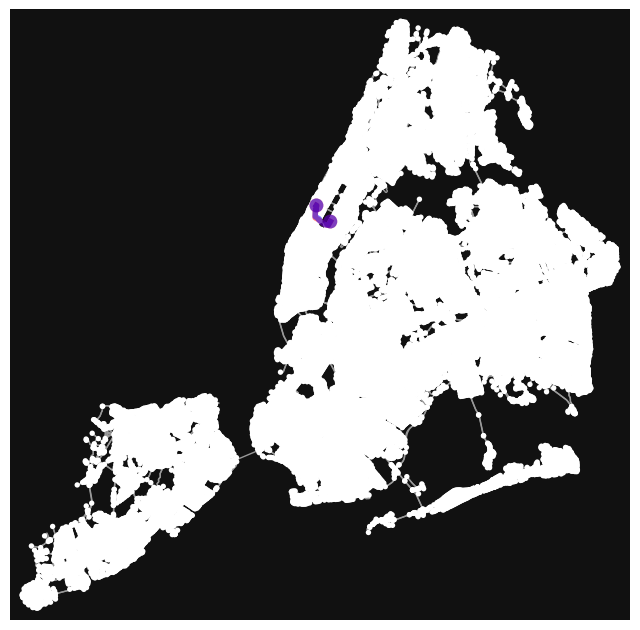

In [701]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, route2], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [702]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf2 = ox.utils_graph.route_to_gdf(G_drive, route2)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdf2.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-702-d7d3d6338a58>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-702-d7d3d6338a58>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

#### convert route to linestring

In [703]:
print(route1)
print(route2)

[42429680, 42455693, 42431671, 42437423, 42447228, 42457788, 247223720, 7802856352, 3718672443, 1061531707, 1061531527, 1061531787, 1061531608, 1061531597, 1996323622, 1061531491, 6207264908, 42432564, 1061531757, 1061531500, 1061531634, 1061531566, 1061531695, 42428648]
[42429680, 42455693, 42431671, 42437423, 42447228, 42457788, 247223720, 7802856352, 7802856341, 4557495130, 1061531527, 1061531787, 1061531608, 1061531597, 1996323622, 1061531491, 6207264908, 42432564, 1061531757, 1061531500, 1061531634, 1061531566, 1061531695, 42428648]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [704]:
"""
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in route2]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/route2.geojson' #route 2 is for PM
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
"""

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in route2]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/route2.geojson\' #route 2 is for PM\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

### Shortest path  Using NO2 value rating

In [705]:
# impute speed on all edges missing data
G_drive = ox.add_edge_speeds(G_drive)

# calculate travel time (seconds) for all edges
G_drive = ox.add_edge_travel_times(G_drive)

In [706]:
cc_edges.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid  oneway  \
u        v         key                                            
39076461 42854803  0                           25161578    True   
         274283981 0              [122633397, 25161349]    True   
39076490 277672046 0                            5699971    True   
         277672005 0                         1014007069    True   
39076504 462124701 0    [618709517, 618709515, 5700693]    True   

                              highway reversed   length  \
u        v         key                                    
39076461 42854803  0    motorway_link    False  254.709   
         274283981 0         motorway    False  767.800   
39076490 277672046 0    motorway_link    False  259.674   
         277672005 0         motorway    False  291.839   
39076504 462124701 0    motorway_link    False  433.148   

                                                                 geometry  \
u        v         key                                                      
39076461 42854803  0    LINESTRING (-73.79463 40.78641, -73.79361 40.7...   
         274283981 0    LINESTRING (-73.79463 40.78641, -73.79309 40.7...   
39076490 277672046 0    LINESTRING (-73.75709 40.76243, -73.75721 40.7...   
         277672005 0    LINESTRING (-73.75709 40.76243, -73.75741 40.7...   
39076504 462124701 0    LINESTRING (-73.74416 40.75347, -73.74453 40.7...   

                       lanes  ref                  name maxspeed bridge  \
u        v         key                                                    
39076461 42854803  0     NaN  NaN                   NaN      NaN    NaN   
         274283981 0       2   CI  Cross Island Parkway   50 mph    NaN   
39076490 277672046 0     NaN  NaN                   NaN      NaN    NaN   
         277672005 0       3   CI  Cross Island Parkway   50 mph    NaN   
39076504 462124701 0       1  NaN                   NaN      NaN    yes   

                       access tunnel width junction est_width  
u        v         key                                         
39076461 42854803  0      NaN    NaN   NaN      NaN       NaN  
         274283981 0      NaN    NaN   NaN      NaN       NaN  
39076490 277672046 0      NaN    NaN   NaN      NaN       NaN  
         277672005 0      NaN    NaN   NaN      NaN       NaN  
39076504 462124701 0      NaN    NaN   NaN      NaN       NaN

In [707]:
print(no2_gdf.head())

      SensorID                time   latitude  longitude  temperature  \
0  NYCP2_CS01A 2021-09-10 12:48:03  40.847057 -73.869904         21.7   
1  NYCP2_CS01A 2021-09-10 12:48:08  40.847057 -73.869904         21.7   
2  NYCP2_CS01A 2021-09-10 12:48:13  40.847054 -73.869904         21.7   
3  NYCP2_CS01A 2021-09-10 12:48:18  40.847050 -73.869904         21.7   
4  NYCP2_CS01A 2021-09-10 12:48:23  40.847038 -73.869919         21.7   

   humidity        no2                    geometry  index_right neighborhood  \
0      61.2  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
1      60.9  12.041785  POINT (-73.86990 40.84706)           38   Bronx Park   
2      60.7  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
3      60.3  12.041785  POINT (-73.86990 40.84705)           38   Bronx Park   
4      60.7  12.041785  POINT (-73.86992 40.84704)           38   Bronx Park   

  boroughCode borough                                                @id  \
0   

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Ensure CRS compatibility between your sensor data and the street network.
Convert the network graph to a GeoDataFrame for spatial operations.
Spatially join the sensor data to the nearest network edges.
Update the network graph's edge weights based on the sensor ratings.
Compute and visualize the shortest path using these updated weights.

In [708]:
# update geopandas

!pip install --upgrade geopandas


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [709]:
#computing route 1 - distance
route1 = ox.shortest_path(G_drive, orig_node, dest_node, weight="length")  # Minimizing length

Why the inverse of the weight is being used?

In practical terms, using the inverse of the rating amplifies differences among lower ratings while still recognizing that any rated path is better than paths with extremely high ratings. It provides a balanced approach to ensuring that the best paths (according to the rating system used) are chosen more frequently by the routing algorithm, without completely disregarding paths that are rated poorly but might be necessary for reaching certain destinations.

This method is particularly effective in applications where you want to maximize a positive attribute (like safety or air quality) that is inversely related to a numeric rating or where ratings reflect a cost or risk that should be minimized

In [710]:
%timeit -r 1 -n 50
import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and no2_gdf with necessary columns
assert 'latitude' in no2_gdf.columns and 'longitude' in no2_gdf.columns and 'rating' in no2_gdf.columns, "no2_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for no2_gdf to match G_drive's graph CRS
no2_gdf['geometry'] = no2_gdf.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
no2_gdf = no2_gdf.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for no2_gdf
no2_gdf['geohash'] = no2_gdf.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes_no2, edges_no2 = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges_no2.columns:
    edges_no2['geohash'] = edges_no2['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge no2_gdf with edges based on geohash
edges_no2 = edges_no2.merge(no2_gdf[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges_no2['weight'] = edges_no2['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges_no2['osmid']):
    edges_no2['osmid'] = edges_no2['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges_no2.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd

# Coordinates and nodes fetching is correct
Richard_Morris_Hunt_x, Richard_Morris_Hunt_y = Richard_Morris_Hunt.geometry.x, Richard_Morris_Hunt.geometry.y
Hotel_Belleclaire_x, Hotel_Belleclaire_y = Hotel_Belleclaire.geometry.x, Hotel_Belleclaire.geometry.y

orig_node = ox.nearest_nodes(G_drive, Richard_Morris_Hunt_x, Richard_Morris_Hunt_y)
dest_node = ox.nearest_nodes(G_drive, Hotel_Belleclaire_x, Hotel_Belleclaire_y)



# Compute route 2 - PM

route3 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

499500


##### Average execution time after 50 runs:

In [711]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### plotting shortest route: NO2 vs distance

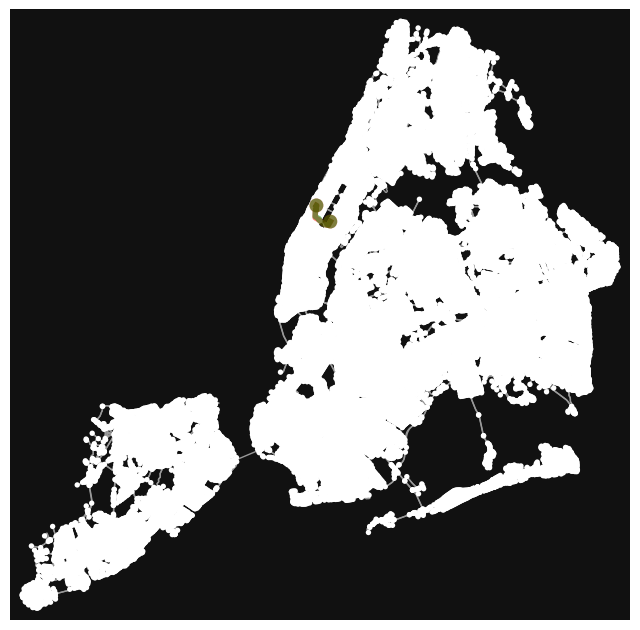

In [712]:
import matplotlib.pyplot as plt



# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, route3], route_colors=['red', 'green'], route_linewidth=6)
plt.show()





In [713]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf3 = ox.utils_graph.route_to_gdf(G_drive, route3)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m3 = route_gdf3.explore(tiles="CartoDB positron", color="green", m=m1) #NO2
m3

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-713-ad2512d6c7ed>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-713-ad2512d6c7ed>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

#### convert route to linestring

In [714]:
print(route1)
print(route3)


[42429680, 42455693, 42431671, 42437423, 42447228, 42457788, 247223720, 7802856352, 3718672443, 1061531707, 1061531527, 1061531787, 1061531608, 1061531597, 1996323622, 1061531491, 6207264908, 42432564, 1061531757, 1061531500, 1061531634, 1061531566, 1061531695, 42428648]
[42429680, 42455693, 42431671, 42437423, 42447228, 42457788, 247223720, 7802856352, 7802856341, 4557495130, 1061531527, 1061531787, 1061531608, 1061531597, 1996323622, 1061531491, 6207264908, 42432564, 1061531757, 1061531500, 1061531634, 1061531566, 1061531695, 42428648]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [715]:
"""
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in route3]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/route3.geojson' #route 2 is for PM
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
"""

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in route3]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/route3.geojson\' #route 2 is for PM\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

### Comparing routes from RMH to HB

In [716]:
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming G_drive is already loaded with the appropriate region
def create_linestring_from_route(route, graph):
    node_points = [(graph.nodes[node]['x'], graph.nodes[node]['y']) for node in route]
    return LineString(node_points)

linestring1 = create_linestring_from_route(route1, G_drive)
linestring2 = create_linestring_from_route(route2, G_drive)
linestring3 = create_linestring_from_route(route3, G_drive)


####Calculate Hausdorff Distance

In [717]:
distance1_2 = linestring1.hausdorff_distance(linestring2)
distance1_3 = linestring1.hausdorff_distance(linestring3)
distance2_3 = linestring2.hausdorff_distance(linestring3)

print(f"Hausdorff distance between Route 1 and Route 2: {distance1_2}")
print(f"Hausdorff distance between Route 1 and Route 3: {distance1_3}")
print(f"Hausdorff distance between Route 2 and Route 3: {distance2_3}")


Hausdorff distance between Route 1 and Route 2: 0.000763588640158143
Hausdorff distance between Route 1 and Route 3: 0.000763588640158143
Hausdorff distance between Route 2 and Route 3: 0.0


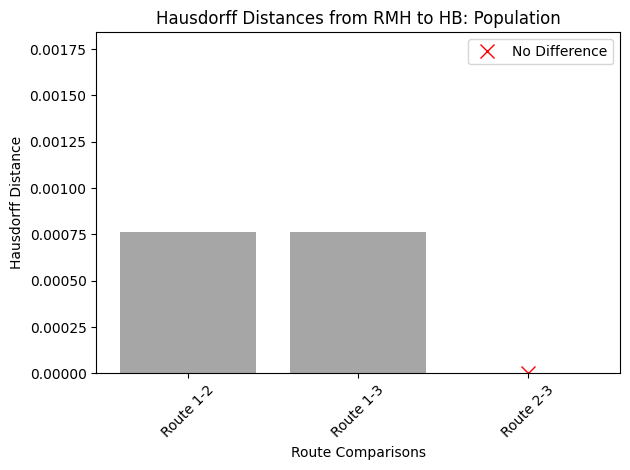

In [828]:
import matplotlib.pyplot as plt
import numpy as np

# Labels for the comparisons
labels = [ 'Route 1-2', 'Route 1-3', 'Route 2-3']

# Corresponding Hausdorff distances
distances = [0.000763588640158143, 0.000763588640158143, 0.0]

# Create the bar graph
fig, ax = plt.subplots()
bars = ax.bar(labels, distances, color='gray', alpha=0.7)

# Adding markers for zero values
zero_distances = [0 if dist == 0 else None for dist in distances]  # Mark only zero values
x_positions = range(len(labels))  # X positions for the labels
markers, = ax.plot(x_positions, zero_distances, 'rx', markersize=10, label='No Difference')  # 'rx' for red X

# Adding labels and title
ax.set_xlabel('Route Comparisons')
ax.set_ylabel('Hausdorff Distance')
ax.set_title('Hausdorff Distances from RMH to HB: Population')
ax.set_ylim(0, max(distances) * 1.1 + 0.001)  # Set y-axis limits to slightly above the highest distance

# Adding a legend to explain markers
ax.legend()

# Display the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to make room for label rotation
plt.show()


In [718]:
intersection1_2 = linestring1.intersection(linestring2)
intersection1_3 = linestring1.intersection(linestring3)
intersection2_3 = linestring2.intersection(linestring3)

# Checking if there are intersections and what type they are
print("Do routes 1 and 2 intersect?", "Yes" if not intersection1_2.is_empty else "No")
print("Do routes 1 and 3 intersect?", "Yes" if not intersection1_3.is_empty else "No")
print("Do routes 2 and 3 intersect?", "Yes" if not intersection2_3.is_empty else "No")


Do routes 1 and 2 intersect? Yes
Do routes 1 and 3 intersect? Yes
Do routes 2 and 3 intersect? Yes


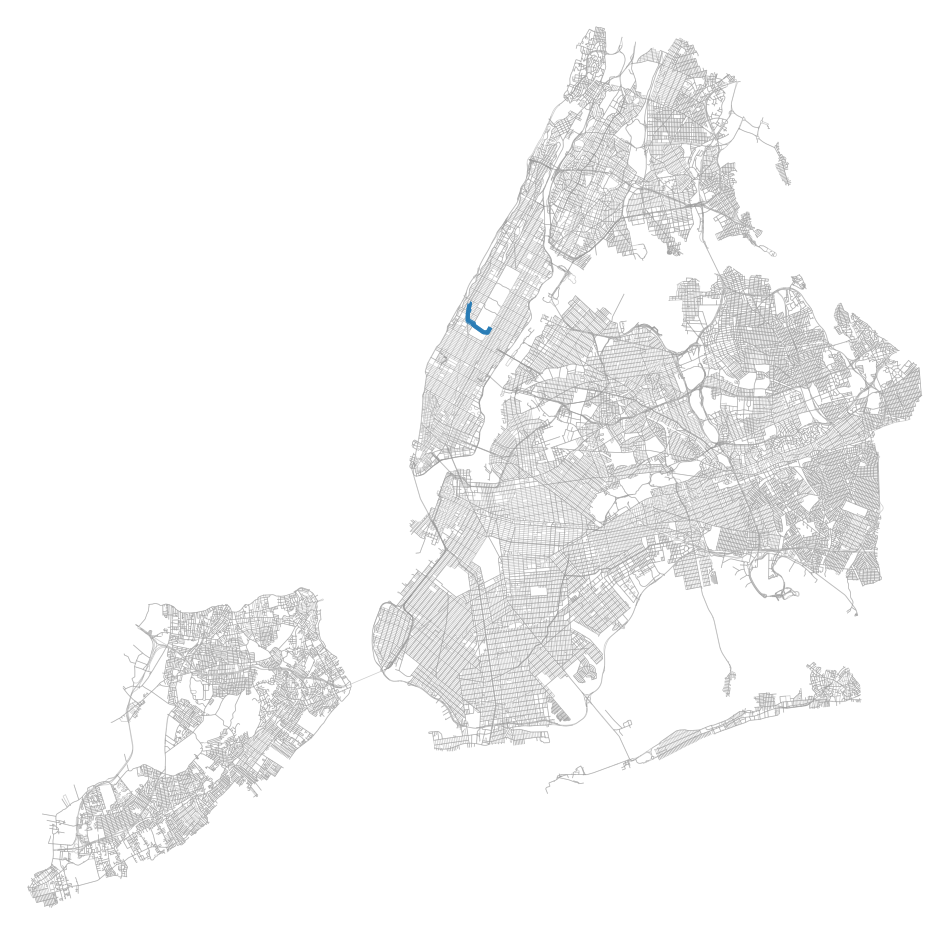

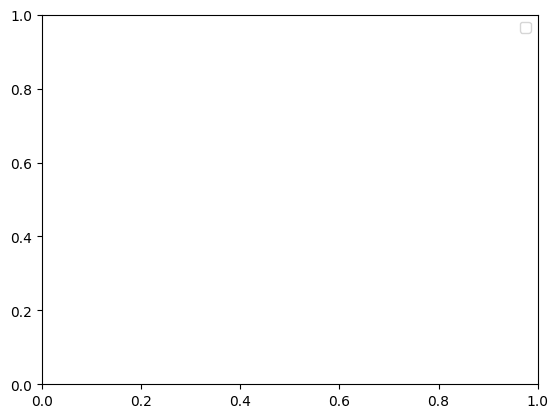

In [719]:
# Create a GeoDataFrame for easier plotting
gdf = gpd.GeoDataFrame(geometry=[linestring1, linestring2, linestring3], index=['Route 1', 'Route 2', 'Route 3'])

# Plotting
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(ax=ax, linewidth=3, alpha=0.6)
ox.plot_graph(G_drive, ax=ax, node_size=0, edge_linewidth=0.5, edge_alpha=0.5)
plt.legend(gdf.index)
plt.show()


In [720]:
import osmnx as ox

route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf2 = ox.utils_graph.route_to_gdf(G_drive, route2)
route_gdf3 = ox.utils_graph.route_to_gdf(G_drive, route3)

# Start with the first route
m1 = route_gdf1.explore(tiles='CartoDB positron', color='red', name='Route 1')

# Add the second route
m2 = route_gdf2.explore(tiles='CartoDB positron', color='blue', m=m1, name='Route 2')

# Finally, add the third route
m3 = route_gdf3.explore(tiles='CartoDB positron', color='green', m=m2, name='Route 3')

# Show the map
m3
#---------
#seems like route 2 and route 3 are completely ovelapping

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-720-db3cf05153c7>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-720-db3cf05153c7>:4: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

In [721]:
import osmnx as ox
import geopandas as gpd
import folium

# Assuming G_drive and routes are already defined and loaded correctly
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf2 = ox.utils_graph.route_to_gdf(G_drive, route2)
route_gdf3 = ox.utils_graph.route_to_gdf(G_drive, route3)

# Start with the first route
m1 = route_gdf1.explore(tiles='CartoDB positron', color='red', name='Route 1', style_kwds={'weight':5, 'opacity':0.8})

# Add the second route with different style
m2 = route_gdf2.explore(tiles='CartoDB positron', color='blue', m=m1, name='Route 2', style_kwds={'weight':5, 'opacity':0.6, 'dashArray': '5, 5'})

# Finally, add the third route with another distinct style
m3 = route_gdf3.explore(tiles='CartoDB positron', color='green', m=m2, name='Route 3', style_kwds={'weight':5, 'opacity':0.4, 'dashArray': '10, 10'})



# Show the map
m3



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-721-f0527ab350dc>:6: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-721-f0527ab350dc>:7: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

# Population: Shortest path - GNC to KKZ

#### PM rating - distance from `Greenbelt Nature Center (GNC)` to `Kids Korral (KKZ)` zoo

In [722]:
tourism.head(100)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


highway                    geometry  \
element_type osmid                                            
node         158801311      NaN  POINT (-73.97958 40.72510)   
             158809984      NaN  POINT (-73.99875 40.72288)   
             158862484      NaN  POINT (-73.97139 40.74862)   
             320948228      NaN  POINT (-74.00291 40.70575)   
             357582588      NaN  POINT (-73.81875 40.58427)   
             357618558      NaN  POINT (-73.99725 40.73227)   
             357620718      NaN  POINT (-73.96799 40.77146)   
             357621823      NaN  POINT (-73.97648 40.79411)   
             368042980      NaN  POINT (-73.99710 40.72148)   
             368043598      NaN  POINT (-74.00215 40.73380)   
             368043670      NaN  POINT (-74.00644 40.74709)   
             368052081      NaN  POINT (-74.01135 40.70339)   
             368061337      NaN  POINT (-74.01375 40.70403)   
             368061366      NaN  POINT (-73.98412 40.75933)   
             368061418      NaN  POINT (-73.98117 40.78238)   
             368061423      NaN  POINT (-73.98250 40.78194)   
             368061518      NaN  POINT (-73.91995 40.83109)   
             368061605      NaN  POINT (-73.99383 40.73798)   
             368061607      NaN  POINT (-74.00491 40.72510)   
             368061644      NaN  POINT (-73.92401 40.75619)   
             368061648      NaN  POINT (-73.98998 40.69052)   
             368061657      NaN  POINT (-73.99778 40.72500)   
             368061660      NaN  POINT (-73.99003 40.71878)   
             368061667      NaN  POINT (-73.95750 40.64944)   
             368061866      NaN  POINT (-73.80564 40.87178)   
             368062506      NaN  POINT (-73.95333 40.72699)   
             368062558      NaN  POINT (-73.98042 40.77073)   
             373069793      NaN  POINT (-74.01345 40.70556)   
             409697407      NaN  POINT (-74.11440 40.59517)   
             409729594      NaN  POINT (-74.13898 40.58843)   
             409753882      NaN  POINT (-74.14054 40.57601)   
             409759300      NaN  POINT (-74.06268 40.61524)   
             411499455      NaN  POINT (-74.24722 40.49635)   
             411504676      NaN  POINT (-74.25136 40.51340)   
             411628705      NaN  POINT (-74.05521 40.60469)   
             411628957      NaN  POINT (-74.05755 40.60786)   
             411668741      NaN  POINT (-74.11653 40.62513)   
             417259741      NaN  POINT (-74.07649 40.64679)   
             419361418      NaN  POINT (-73.99098 40.70335)   
             419367024      NaN  POINT (-73.97305 40.67758)   
             422438959      NaN  POINT (-73.97234 40.77014)   
             422438963      NaN  POINT (-73.97257 40.77019)   
             422438965      NaN  POINT (-73.97277 40.76991)   
             424048139      NaN  POINT (-74.10176 40.64431)   
             424048146      NaN  POINT (-74.10210 40.64438)   
             424048153      NaN  POINT (-74.10275 40.64452)   
             424061246      NaN  POINT (-74.10266 40.64400)   
             424069190      NaN  POINT (-74.10198 40.64447)   
             455890655      NaN  POINT (-73.78644 40.66768)   
             561042174      NaN  POINT (-74.01389 40.71050)   
             561950053      NaN  POINT (-73.97237 40.76980)   
             561950133      NaN  POINT (-73.97315 40.77038)   
             561950155      NaN  POINT (-73.97214 40.77066)   
             561950603      NaN  POINT (-73.96653 40.77504)   
             566445454      NaN  POINT (-73.98373 40.75574)   
             600524231      NaN  POINT (-73.95212 40.79528)   
             600524342      NaN  POINT (-73.95287 40.79653)   
             607275263      NaN  POINT (-73.95148 40.80418)   
             617741648      NaN  POINT (-73.94168 40.71450)   
             622409660      NaN  POINT (-73.93849 40.75307)   
             685477309      NaN  POINT (-73.82418 40.61677)   
             738683442      NaN  POINT (-74.21359 40.50

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


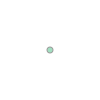

In [723]:
Greenbelt_Nature_Center = tourism[tourism['name'] == 'Greenbelt Nature Center'].squeeze()
Greenbelt_Nature_Center.geometry

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


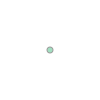

In [724]:
Kids_Korral	= tourism[tourism['name'] == 'Kids Korral'].squeeze()
Kids_Korral.geometry

##### shortest path using distance vs PM

In [725]:
%timeit -r 1 -n 50
# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt


# Compute two different routes
route1 = ox.shortest_path(G_drive, orig_node, dest_node, weight="length")  # Minimizing length


# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


499500


In [726]:
%timeit -r 1 -n 50
# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt


# Compute two different routes

route2 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


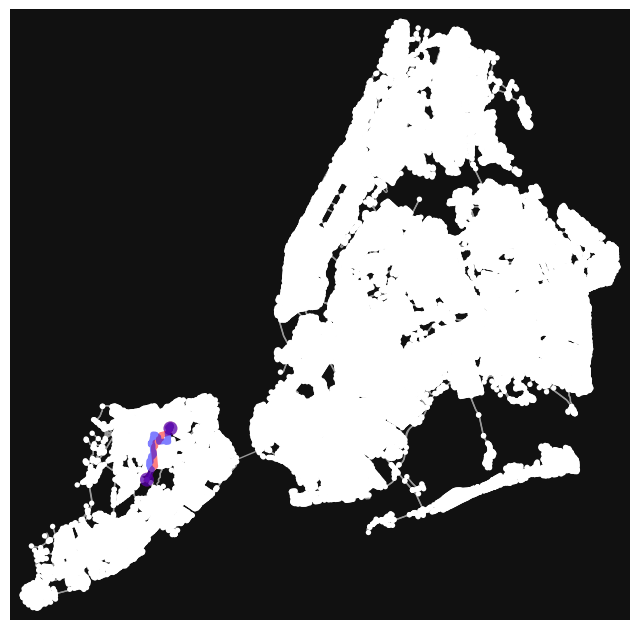

In [727]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, route2], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()





In [728]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf2 = ox.utils_graph.route_to_gdf(G_drive, route2)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdf2.explore(tiles="CartoDB positron", color="blue", m=m1) #lower rating = healthier
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-728-962bf8ff6803>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-728-962bf8ff6803>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

#### NO2 rating - distance from `Greenbelt Nature Center (GNC)` to `Kids Korral (KKZ)` zoo

In [729]:
tourism.head(100)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


highway                    geometry  \
element_type osmid                                            
node         158801311      NaN  POINT (-73.97958 40.72510)   
             158809984      NaN  POINT (-73.99875 40.72288)   
             158862484      NaN  POINT (-73.97139 40.74862)   
             320948228      NaN  POINT (-74.00291 40.70575)   
             357582588      NaN  POINT (-73.81875 40.58427)   
             357618558      NaN  POINT (-73.99725 40.73227)   
             357620718      NaN  POINT (-73.96799 40.77146)   
             357621823      NaN  POINT (-73.97648 40.79411)   
             368042980      NaN  POINT (-73.99710 40.72148)   
             368043598      NaN  POINT (-74.00215 40.73380)   
             368043670      NaN  POINT (-74.00644 40.74709)   
             368052081      NaN  POINT (-74.01135 40.70339)   
             368061337      NaN  POINT (-74.01375 40.70403)   
             368061366      NaN  POINT (-73.98412 40.75933)   
             368061418      NaN  POINT (-73.98117 40.78238)   
             368061423      NaN  POINT (-73.98250 40.78194)   
             368061518      NaN  POINT (-73.91995 40.83109)   
             368061605      NaN  POINT (-73.99383 40.73798)   
             368061607      NaN  POINT (-74.00491 40.72510)   
             368061644      NaN  POINT (-73.92401 40.75619)   
             368061648      NaN  POINT (-73.98998 40.69052)   
             368061657      NaN  POINT (-73.99778 40.72500)   
             368061660      NaN  POINT (-73.99003 40.71878)   
             368061667      NaN  POINT (-73.95750 40.64944)   
             368061866      NaN  POINT (-73.80564 40.87178)   
             368062506      NaN  POINT (-73.95333 40.72699)   
             368062558      NaN  POINT (-73.98042 40.77073)   
             373069793      NaN  POINT (-74.01345 40.70556)   
             409697407      NaN  POINT (-74.11440 40.59517)   
             409729594      NaN  POINT (-74.13898 40.58843)   
             409753882      NaN  POINT (-74.14054 40.57601)   
             409759300      NaN  POINT (-74.06268 40.61524)   
             411499455      NaN  POINT (-74.24722 40.49635)   
             411504676      NaN  POINT (-74.25136 40.51340)   
             411628705      NaN  POINT (-74.05521 40.60469)   
             411628957      NaN  POINT (-74.05755 40.60786)   
             411668741      NaN  POINT (-74.11653 40.62513)   
             417259741      NaN  POINT (-74.07649 40.64679)   
             419361418      NaN  POINT (-73.99098 40.70335)   
             419367024      NaN  POINT (-73.97305 40.67758)   
             422438959      NaN  POINT (-73.97234 40.77014)   
             422438963      NaN  POINT (-73.97257 40.77019)   
             422438965      NaN  POINT (-73.97277 40.76991)   
             424048139      NaN  POINT (-74.10176 40.64431)   
             424048146      NaN  POINT (-74.10210 40.64438)   
             424048153      NaN  POINT (-74.10275 40.64452)   
             424061246      NaN  POINT (-74.10266 40.64400)   
             424069190      NaN  POINT (-74.10198 40.64447)   
             455890655      NaN  POINT (-73.78644 40.66768)   
             561042174      NaN  POINT (-74.01389 40.71050)   
             561950053      NaN  POINT (-73.97237 40.76980)   
             561950133      NaN  POINT (-73.97315 40.77038)   
             561950155      NaN  POINT (-73.97214 40.77066)   
             561950603      NaN  POINT (-73.96653 40.77504)   
             566445454      NaN  POINT (-73.98373 40.75574)   
             600524231      NaN  POINT (-73.95212 40.79528)   
             600524342      NaN  POINT (-73.95287 40.79653)   
             607275263      NaN  POINT (-73.95148 40.80418)   
             617741648      NaN  POINT (-73.94168 40.71450)   
             622409660      NaN  POINT (-73.93849 40.75307)   
             685477309      NaN  POINT (-73.82418 40.61677)   
             738683442      NaN  POINT (-74.21359 40.50

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


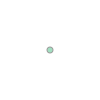

In [730]:
Greenbelt_Nature_Center = tourism[tourism['name'] == 'Greenbelt Nature Center'].squeeze()
Greenbelt_Nature_Center.geometry

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


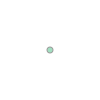

In [731]:
Kids_Korral	= tourism[tourism['name'] == 'Kids Korral'].squeeze()
Kids_Korral.geometry

#####shortest path using distance vs NO2

In [732]:
%timeit -r 1 -n 50
# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y


orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)


# Compute two different routes
route1 = ox.shortest_path(G_drive, orig_node, dest_node, weight="length")  # Minimizing length


# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


499500


In [733]:
%timeit -r 1 -n 50
# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y


orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)


# Compute two different routes

route3 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


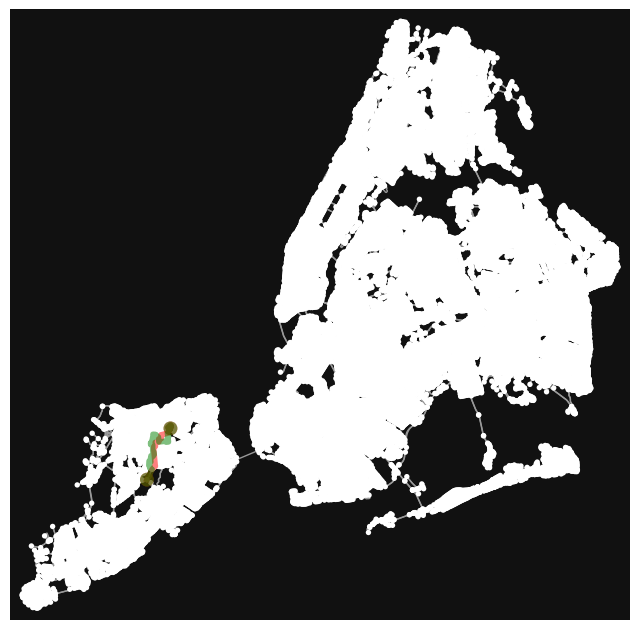

In [734]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt


# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, route3], route_colors=['red', 'green'], route_linewidth=6)
plt.show()





In [735]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf3 = ox.utils_graph.route_to_gdf(G_drive, route3)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m3 = route_gdf3.explore(tiles="CartoDB positron", color="green", m=m1) #lower rating = healthier
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-735-a09692735886>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-735-a09692735886>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

### Comparing routes from GNC to KKZ

#### convert routes to linestring

In [736]:
print(route1)
print(route2)
print(route3)


[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]
[42959081, 6937755088, 2523812078, 42977771, 42981971, 43002963, 42977134, 42977131, 42959891, 42959888, 42959885, 42961658, 42961653, 42953995, 43003329, 42976224, 42976197, 43006850, 2554418647, 42981553, 42989809, 42961868, 11754651792, 42982389, 42978238, 42961916, 2571915585, 42953967, 2571915602, 42973102, 42954333, 42954315, 42956720, 42975626, 42975623, 42975617, 42975610, 42975604, 42975596, 42994463, 42977329, 42994457,

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [737]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in route1]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/route1_G2K.geojson'
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in route1]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/route1_G2K.geojson\'\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

In [738]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in route2]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/route2_G2K.geojson'
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in route2]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/route2_G2K.geojson\'\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

In [739]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in route3]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/route3_G2K.geojson'
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in route3]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/route3_G2K.geojson\'\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

In [740]:
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming G_drive is already loaded with the appropriate region
def create_linestring_from_route(route, graph):
    node_points = [(graph.nodes[node]['x'], graph.nodes[node]['y']) for node in route]
    return LineString(node_points)

linestring1 = create_linestring_from_route(route1, G_drive)
linestring2 = create_linestring_from_route(route2, G_drive)
linestring3 = create_linestring_from_route(route3, G_drive)


####Calculate Hausdorff Distance

In [741]:
distance1_2_PM = linestring1.hausdorff_distance(linestring2)
distance1_3_PM = linestring1.hausdorff_distance(linestring3)
distance2_3_PM = linestring2.hausdorff_distance(linestring3)

print(f"Hausdorff distance between Route 1 and Route 2: {distance1_2}")
print(f"Hausdorff distance between Route 1 and Route 3: {distance1_3}")
print(f"Hausdorff distance between Route 2 and Route 3: {distance2_3}")


Hausdorff distance between Route 1 and Route 2: 0.006156401744530814
Hausdorff distance between Route 1 and Route 3: 0.006156401744530814
Hausdorff distance between Route 2 and Route 3: 0.0


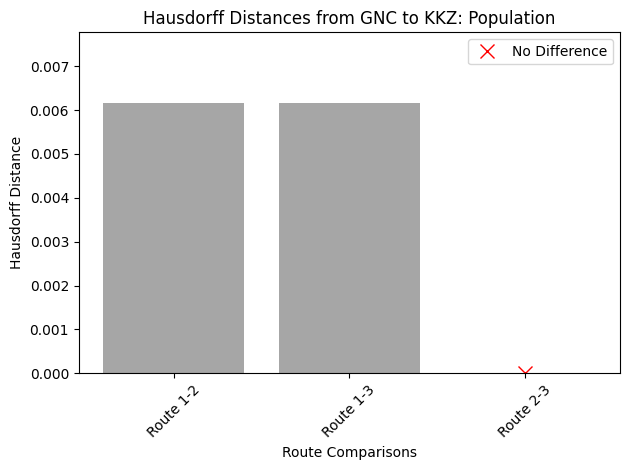

In [829]:
import matplotlib.pyplot as plt
import numpy as np

# Labels for the comparisons
labels = [ 'Route 1-2', 'Route 1-3', 'Route 2-3']

# Corresponding Hausdorff distances
distances = [0.006156401744530814, 0.006156401744530814, 0.0]

# Create the bar graph
fig, ax = plt.subplots()
bars = ax.bar(labels, distances, color='gray', alpha=0.7)

# Adding markers for zero values
zero_distances = [0 if dist == 0 else None for dist in distances]  # Mark only zero values
x_positions = range(len(labels))  # X positions for the labels
markers, = ax.plot(x_positions, zero_distances, 'rx', markersize=10, label='No Difference')  # 'rx' for red X

# Adding labels and title
ax.set_xlabel('Route Comparisons')
ax.set_ylabel('Hausdorff Distance')
ax.set_title('Hausdorff Distances from GNC to KKZ: Population')
ax.set_ylim(0, max(distances) * 1.1 + 0.001)  # Set y-axis limits to slightly above the highest distance

# Adding a legend to explain markers
ax.legend()

# Display the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to make room for label rotation
plt.show()


In [742]:
intersection1_2 = linestring1.intersection(linestring2)
intersection1_3 = linestring1.intersection(linestring3)
intersection2_3 = linestring2.intersection(linestring3)

# Checking if there are intersections and what type they are
print("Do routes 1 and 2 intersect?", "Yes" if not intersection1_2.is_empty else "No")
print("Do routes 1 and 3 intersect?", "Yes" if not intersection1_3.is_empty else "No")
print("Do routes 2 and 3 intersect?", "Yes" if not intersection2_3.is_empty else "No")


Do routes 1 and 2 intersect? Yes
Do routes 1 and 3 intersect? Yes
Do routes 2 and 3 intersect? Yes


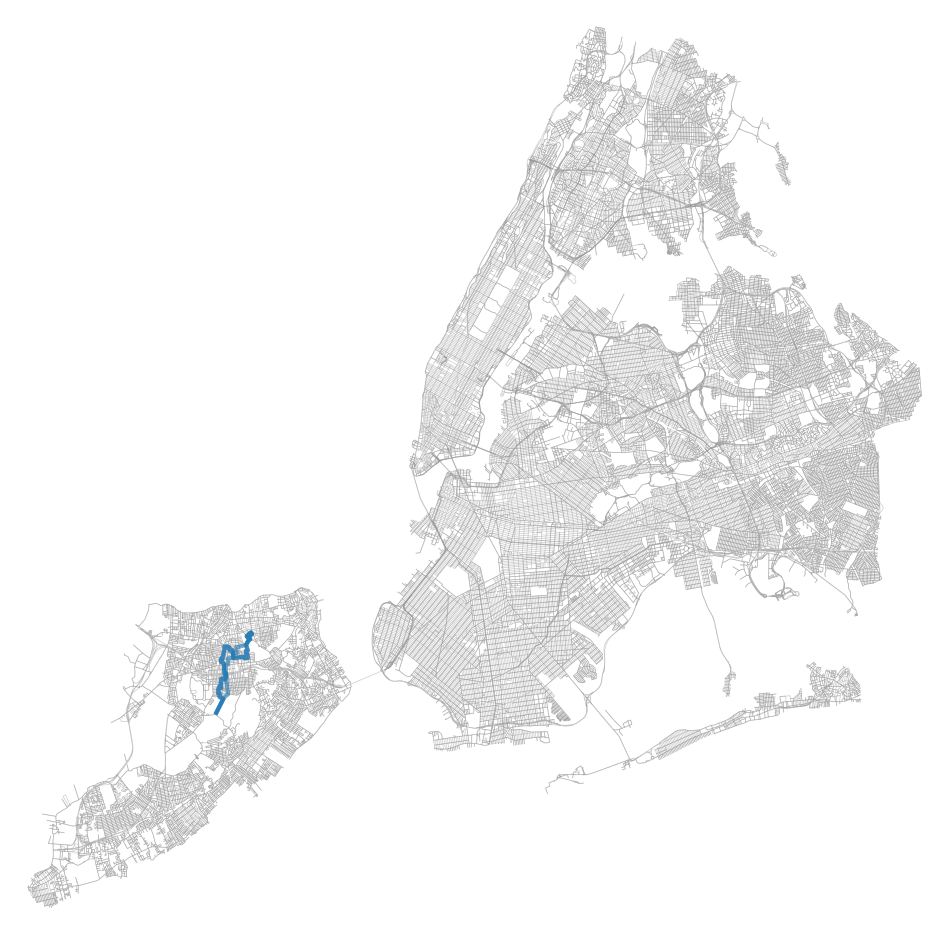

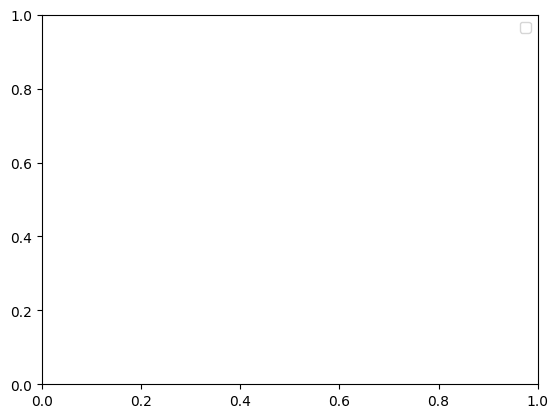

In [743]:
# Create a GeoDataFrame for easier plotting
gdf = gpd.GeoDataFrame(geometry=[linestring1, linestring2, linestring3], index=['Route 1', 'Route 2', 'Route 3'])

# Plotting
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(ax=ax, linewidth=3, alpha=0.6)
ox.plot_graph(G_drive, ax=ax, node_size=0, edge_linewidth=0.5, edge_alpha=0.5)
plt.legend(gdf.index)
plt.show()


In [744]:
import osmnx as ox
import geopandas as gpd
import folium

# Assuming G_drive and routes are already defined and loaded correctly
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf2 = ox.utils_graph.route_to_gdf(G_drive, route2)
route_gdf3 = ox.utils_graph.route_to_gdf(G_drive, route3)

# Start with the first route
m1 = route_gdf1.explore(tiles='CartoDB positron', color='red', name='Route 1', style_kwds={'weight':5, 'opacity':0.8})

# Add the second route with different style
m2 = route_gdf2.explore(tiles='CartoDB positron', color='blue', m=m1, name='Route 2', style_kwds={'weight':5, 'opacity':0.6, 'dashArray': '5, 5'})

# Finally, add the third route with another distinct style
m3 = route_gdf3.explore(tiles='CartoDB positron', color='green', m=m2, name='Route 3', style_kwds={'weight':5, 'opacity':0.4, 'dashArray': '10, 10'})



# Show the map
m3



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-744-f0527ab350dc>:6: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-744-f0527ab350dc>:7: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

## Shortest path - samples - GNC to KKZ

### Based on distance

In [745]:
#Computing route 1 - based on length
route1 = ox.shortest_path(G_drive, orig_node, dest_node, weight="length")  # Minimizing length
print(route1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]


### Based on PM

In [746]:
# impute speed on all edges missing data
G_drive = ox.add_edge_speeds(G_drive)

# calculate travel time (seconds) for all edges
G_drive = ox.add_edge_travel_times(G_drive)

In [747]:
cc_edges.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid  oneway  \
u        v         key                                            
39076461 42854803  0                           25161578    True   
         274283981 0              [122633397, 25161349]    True   
39076490 277672046 0                            5699971    True   
         277672005 0                         1014007069    True   
39076504 462124701 0    [618709517, 618709515, 5700693]    True   

                              highway reversed   length  \
u        v         key                                    
39076461 42854803  0    motorway_link    False  254.709   
         274283981 0         motorway    False  767.800   
39076490 277672046 0    motorway_link    False  259.674   
         277672005 0         motorway    False  291.839   
39076504 462124701 0    motorway_link    False  433.148   

                                                                 geometry  \
u        v         key                                                      
39076461 42854803  0    LINESTRING (-73.79463 40.78641, -73.79361 40.7...   
         274283981 0    LINESTRING (-73.79463 40.78641, -73.79309 40.7...   
39076490 277672046 0    LINESTRING (-73.75709 40.76243, -73.75721 40.7...   
         277672005 0    LINESTRING (-73.75709 40.76243, -73.75741 40.7...   
39076504 462124701 0    LINESTRING (-73.74416 40.75347, -73.74453 40.7...   

                       lanes  ref                  name maxspeed bridge  \
u        v         key                                                    
39076461 42854803  0     NaN  NaN                   NaN      NaN    NaN   
         274283981 0       2   CI  Cross Island Parkway   50 mph    NaN   
39076490 277672046 0     NaN  NaN                   NaN      NaN    NaN   
         277672005 0       3   CI  Cross Island Parkway   50 mph    NaN   
39076504 462124701 0       1  NaN                   NaN      NaN    yes   

                       access tunnel width junction est_width  
u        v         key                                         
39076461 42854803  0      NaN    NaN   NaN      NaN       NaN  
         274283981 0      NaN    NaN   NaN      NaN       NaN  
39076490 277672046 0      NaN    NaN   NaN      NaN       NaN  
         277672005 0      NaN    NaN   NaN      NaN       NaN  
39076504 462124701 0      NaN    NaN   NaN      NaN       NaN

#### PM 20%

In [748]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and pm_gdf with necessary columns
assert 'latitude' in pm20.columns and 'longitude' in pm20.columns and 'rating' in pm20.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for pm_gdf to match G_drive's graph CRS
pm20['geometry'] = pm20.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
pm20 = pm20.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for pm_gdf
pm20['geohash'] = pm20.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(pm20[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)



# Compute PM  route

routePM20 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


499500


##### Average execution time after 50 runs:

In [749]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### plotting shortest route: PM vs distance

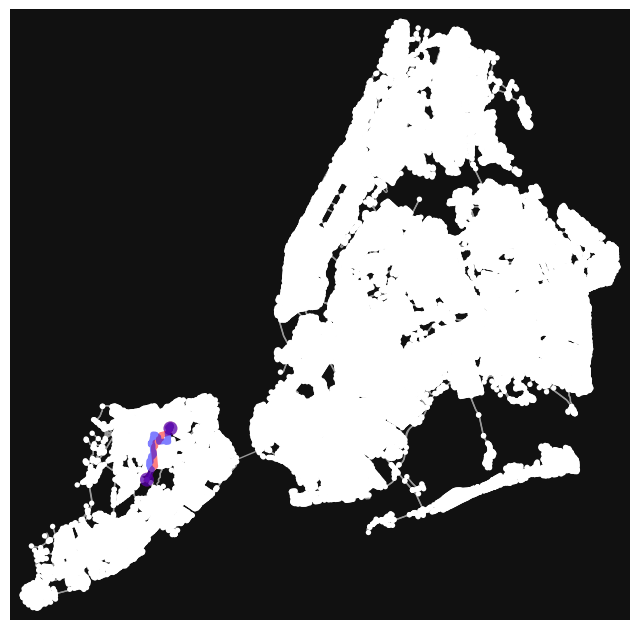

In [750]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, routePM20], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [751]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdfPM20 = ox.utils_graph.route_to_gdf(G_drive, routePM20)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdfPM20.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-751-a96e6d66dc59>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-751-a96e6d66dc59>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

##### convert route to linestring

In [752]:
print(route1)
print(routePM20)

[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]
[42959081, 6937755088, 2523812078, 42977771, 42981971, 43002963, 42977134, 42977131, 42959891, 42959888, 42959885, 42961658, 42961653, 42953995, 43003329, 42976224, 42976197, 43006850, 2554418647, 42981553, 42989809, 42961868, 11754651792, 42982389, 42978238, 42961916, 2571915585, 42953967, 2571915602, 42973102, 42954333, 42954315, 42956720, 42975626, 42975623, 42975617, 42975610, 42975604, 42975596, 42994463, 42977329, 42994457,

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [753]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in routePM20]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/routePM20.geojson'
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in routePM20]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/routePM20.geojson\'\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

#### PM 40%

In [754]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and pm_gdf with necessary columns
assert 'latitude' in pm40_gdf.columns and 'longitude' in pm40_gdf.columns and 'rating' in pm40_gdf.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for pm_gdf to match G_drive's graph CRS
pm40_gdf['geometry'] = pm40_gdf.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
pm40_gdf = pm40_gdf.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for pm_gdf
pm40_gdf['geohash'] = pm40_gdf.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(pm40_gdf[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)



# Compute PM  route

routePM40 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

499500


##### Average execution time after 50 runs:

In [755]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### plotting shortest route: PM vs distance

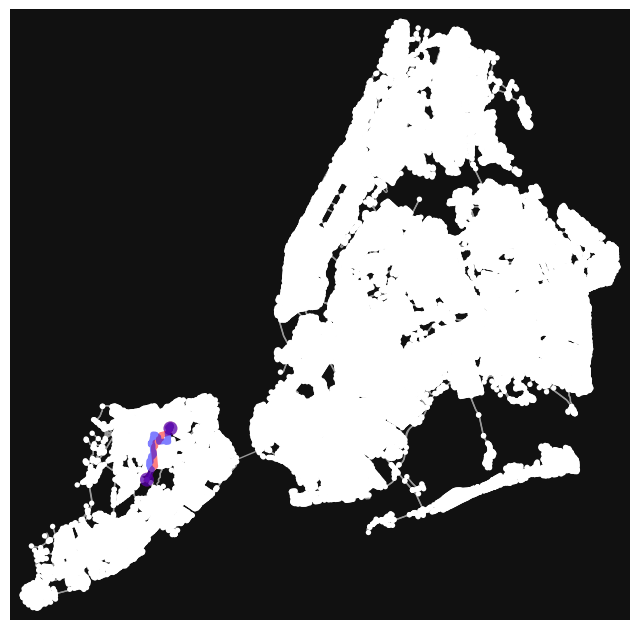

In [756]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, routePM40], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [757]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdfPM40 = ox.utils_graph.route_to_gdf(G_drive, routePM40)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdfPM40.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-757-93a2fa0c64a5>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-757-93a2fa0c64a5>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

##### convert route to linestring

In [758]:
print(route1)
print(routePM40)

[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]
[42959081, 6937755088, 2523812078, 42977771, 42981971, 43002963, 42977134, 42977131, 42959891, 42959888, 42959885, 42961658, 42961653, 42953995, 43003329, 42976224, 42976197, 43006850, 2554418647, 42981553, 42989809, 42961868, 11754651792, 42982389, 42978238, 42961916, 2571915585, 42953967, 2571915602, 42973102, 42954333, 42954315, 42956720, 42975626, 42975623, 42975617, 42975610, 42975604, 42975596, 42994463, 42977329, 42994457,

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [759]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in routePM40]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/routePM40.geojson' #route 2 is for PM
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in routePM40]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/routePM40.geojson\' #route 2 is for PM\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

#### PM 60%

In [760]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and pm_gdf with necessary columns
assert 'latitude' in pm60_gdf.columns and 'longitude' in pm60_gdf.columns and 'rating' in pm60_gdf.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for pm_gdf to match G_drive's graph CRS
pm60_gdf['geometry'] = pm60_gdf.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
pm60_gdf = pm60_gdf.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for pm_gdf
pm60_gdf['geohash'] = pm60_gdf.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(pm60_gdf[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)



# Compute PM  route

routePM60 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

499500


##### Average execution time after 50 runs:

In [761]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### plotting shortest route: PM vs distance

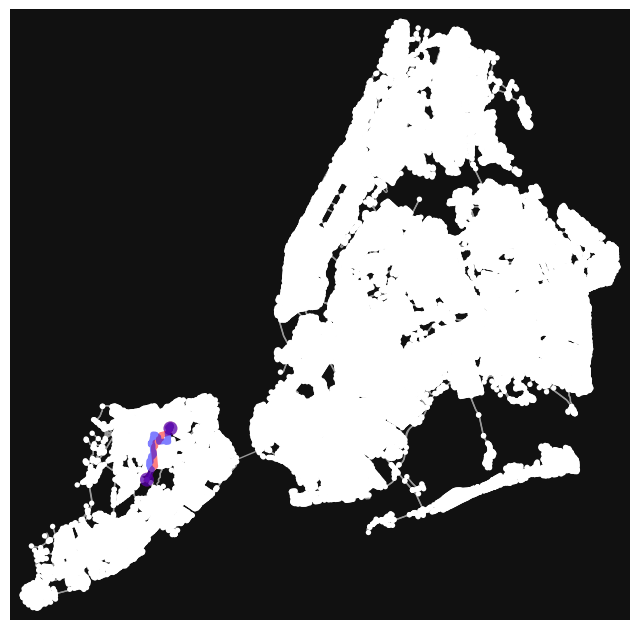

In [762]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, routePM60], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [763]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdfPM60 = ox.utils_graph.route_to_gdf(G_drive, routePM60)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdfPM60.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-763-9c74e0cd7dd5>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-763-9c74e0cd7dd5>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

##### convert route to linestring

In [764]:
print(route1)
print(routePM60)

[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]
[42959081, 6937755088, 2523812078, 42977771, 42981971, 43002963, 42977134, 42977131, 42959891, 42959888, 42959885, 42961658, 42961653, 42953995, 43003329, 42976224, 42976197, 43006850, 2554418647, 42981553, 42989809, 42961868, 11754651792, 42982389, 42978238, 42961916, 2571915585, 42953967, 2571915602, 42973102, 42954333, 42954315, 42956720, 42975626, 42975623, 42975617, 42975610, 42975604, 42975596, 42994463, 42977329, 42994457,

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [765]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in routePM60]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/routePM60.geojson' #route 2 is for PM
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in routePM60]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/routePM60.geojson\' #route 2 is for PM\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

#### PM 80%

In [766]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and pm_gdf with necessary columns
assert 'latitude' in pm80_gdf.columns and 'longitude' in pm80_gdf.columns and 'rating' in pm80_gdf.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for pm_gdf to match G_drive's graph CRS
pm80_gdf['geometry'] = pm80_gdf.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
pm80_gdf = pm80_gdf.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for pm_gdf
pm80_gdf['geohash'] = pm80_gdf.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(pm80_gdf[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)



# Compute PM  route

routePM80 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

499500


##### Average execution time after 50 runs:

In [767]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### plotting shortest route: PM vs distance

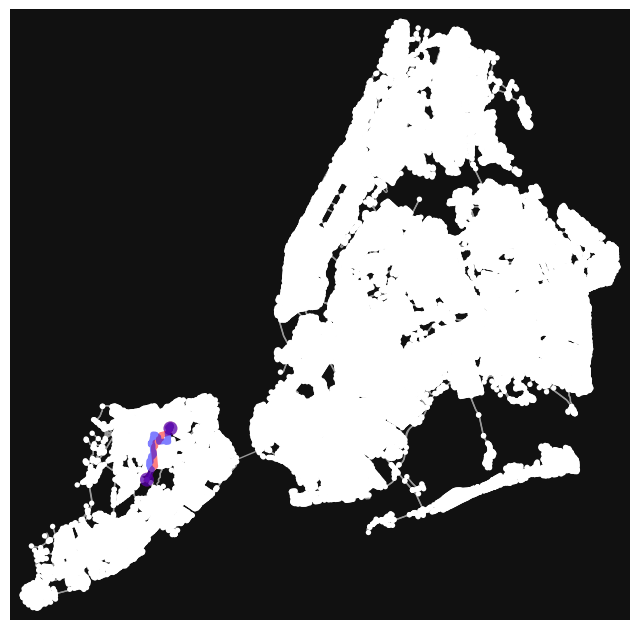

In [768]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, routePM80], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [769]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdfPM80 = ox.utils_graph.route_to_gdf(G_drive, routePM80)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdfPM80.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-769-d26d7aa147fa>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-769-d26d7aa147fa>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

##### convert route to linestring

In [770]:
print(route1)
print(routePM80)

[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]
[42959081, 6937755088, 2523812078, 42977771, 42981971, 43002963, 42977134, 42977131, 42959891, 42959888, 42959885, 42961658, 42961653, 42953995, 43003329, 42976224, 42976197, 43006850, 2554418647, 42981553, 42989809, 42961868, 11754651792, 42982389, 42978238, 42961916, 2571915585, 42953967, 2571915602, 42973102, 42954333, 42954315, 42956720, 42975626, 42975623, 42975617, 42975610, 42975604, 42975596, 42994463, 42977329, 42994457,

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [771]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in routePM80]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/routePM80.geojson' #route 2 is for PM
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in routePM80]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/routePM80.geojson\' #route 2 is for PM\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

#### PM Samples: Calculate Hausdorff Distance

In [772]:
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming G_drive is already loaded with the appropriate region
def create_linestring_from_route(route, graph):
    node_points = [(graph.nodes[node]['x'], graph.nodes[node]['y']) for node in route]
    return LineString(node_points)

linestring0 = create_linestring_from_route(route1, G_drive)
linestring1 = create_linestring_from_route(routePM20, G_drive)
linestring2 = create_linestring_from_route(routePM40, G_drive)
linestring3 = create_linestring_from_route(routePM60, G_drive)
linestring4 = create_linestring_from_route(routePM80, G_drive)


In [773]:
distance0_1 = linestring0.hausdorff_distance(linestring1)
distance1_2 = linestring1.hausdorff_distance(linestring2)
distance1_3 = linestring1.hausdorff_distance(linestring3)
distance2_3 = linestring2.hausdorff_distance(linestring3)
distance4_2 = linestring4.hausdorff_distance(linestring2)

print(f"Hausdorff distance between Route 0 and Route 1: {distance0_1}")
print(f"Hausdorff distance between Route 1 and Route 2: {distance1_2}")
print(f"Hausdorff distance between Route 1 and Route 3: {distance1_3}")
print(f"Hausdorff distance between Route 2 and Route 3: {distance2_3}")
print(f"Hausdorff distance between Route 4 and Route 2: {distance4_2}")


Hausdorff distance between Route 0 and Route 1: 0.006156401744530814
Hausdorff distance between Route 1 and Route 2: 0.0
Hausdorff distance between Route 1 and Route 3: 0.0
Hausdorff distance between Route 2 and Route 3: 0.0
Hausdorff distance between Route 4 and Route 2: 0.0


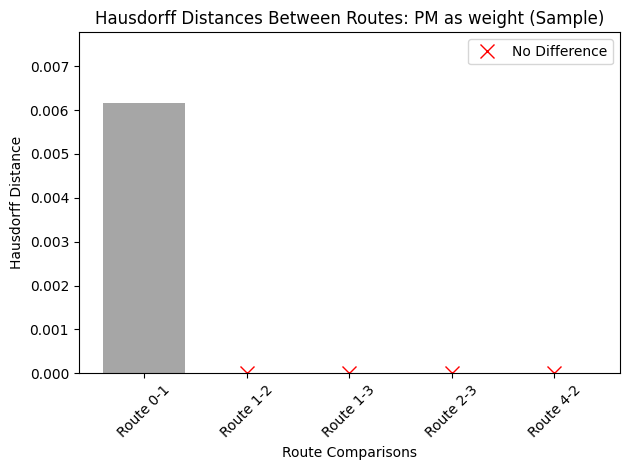

In [827]:
import matplotlib.pyplot as plt
import numpy as np

# Labels for the comparisons
labels = ['Route 0-1', 'Route 1-2', 'Route 1-3', 'Route 2-3', 'Route 4-2']

# Corresponding Hausdorff distances
distances = [0.006156401744530814, 0.0, 0.0, 0.0, 0.0]

# Create the bar graph
fig, ax = plt.subplots()
bars = ax.bar(labels, distances, color='gray', alpha=0.7)

# Adding markers for zero values
zero_distances = [0 if dist == 0 else None for dist in distances]  # Mark only zero values
x_positions = range(len(labels))  # X positions for the labels
markers, = ax.plot(x_positions, zero_distances, 'rx', markersize=10, label='No Difference')  # 'rx' for red X

# Adding labels and title
ax.set_xlabel('Route Comparisons')
ax.set_ylabel('Hausdorff Distance')
ax.set_title('Hausdorff Distances Between Routes: PM as weight (Sample)')
ax.set_ylim(0, max(distances) * 1.1 + 0.001)  # Set y-axis limits to slightly above the highest distance

# Adding a legend to explain markers
ax.legend()

# Display the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to make room for label rotation
plt.show()


In [774]:
intersection0_1 = linestring0.intersection(linestring1)
intersection1_2 = linestring1.intersection(linestring2)
intersection1_3 = linestring1.intersection(linestring3)
intersection2_3 = linestring2.intersection(linestring3)
intersection4_2 = linestring4.intersection(linestring2)

# Checking if there are intersections and what type they are
print("Do routes 0 and 1 intersect?", "Yes" if not intersection0_1.is_empty else "No")
print("Do routes 1 and 2 intersect?", "Yes" if not intersection1_2.is_empty else "No")
print("Do routes 1 and 3 intersect?", "Yes" if not intersection1_3.is_empty else "No")
print("Do routes 2 and 3 intersect?", "Yes" if not intersection2_3.is_empty else "No")
print("Do routes 4 and 2 intersect?", "Yes" if not intersection4_2.is_empty else "No")


Do routes 0 and 1 intersect? Yes
Do routes 1 and 2 intersect? Yes
Do routes 1 and 3 intersect? Yes
Do routes 2 and 3 intersect? Yes
Do routes 4 and 2 intersect? Yes


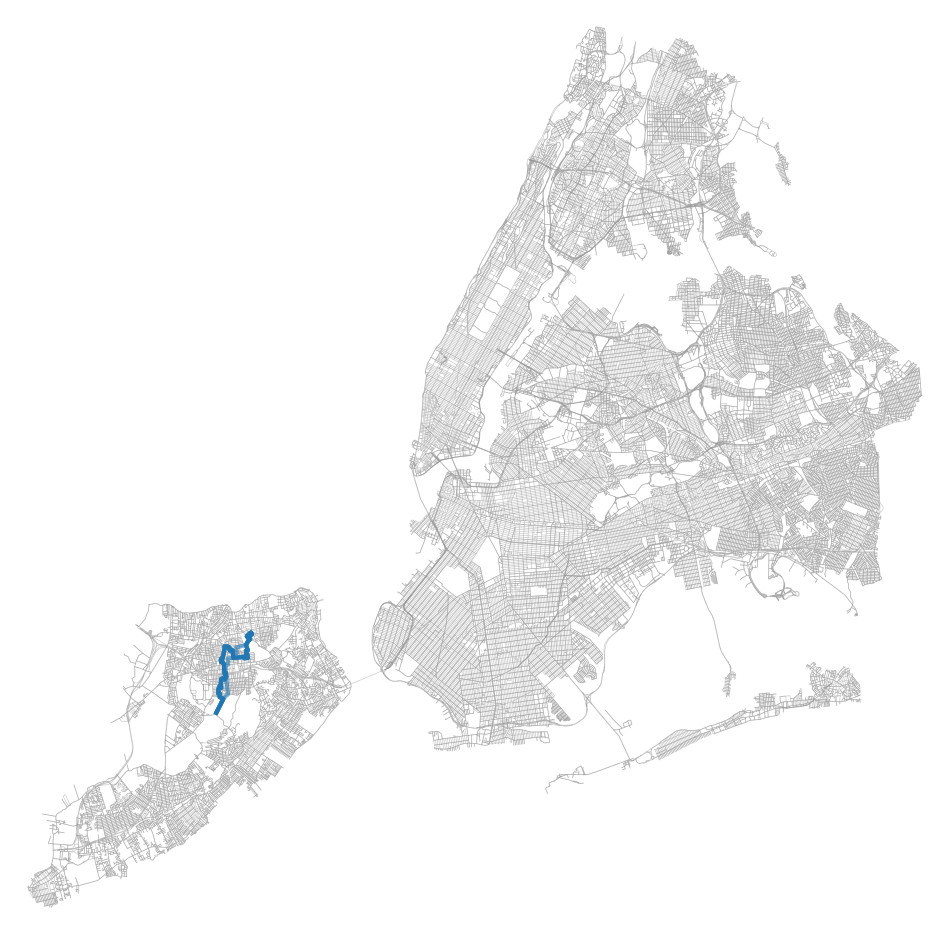

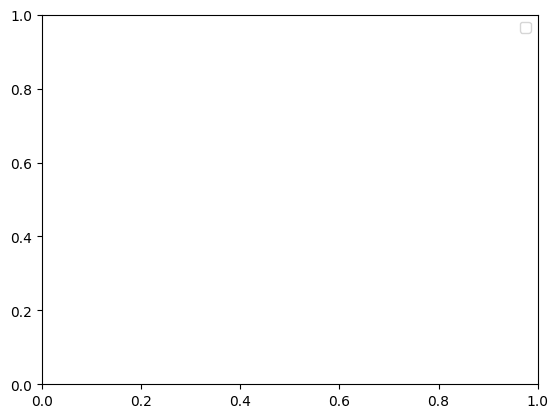

In [775]:
# Create a GeoDataFrame for easier plotting
gdf = gpd.GeoDataFrame(geometry=[linestring0, linestring1, linestring2, linestring3, linestring4], index=['Route 0','Route 1', 'Route 2', 'Route 3','Route 4'])

# Plotting
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(ax=ax, linewidth=3, alpha=0.6)
ox.plot_graph(G_drive, ax=ax, node_size=0, edge_linewidth=0.5, edge_alpha=0.5)
plt.legend(gdf.index)
plt.show()


In [817]:
import osmnx as ox
import geopandas as gpd
import folium

# Assuming G_drive and routes are already defined and loaded correctly
route0_gdf = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, routePM20)
route_gdf2 = ox.utils_graph.route_to_gdf(G_drive, routePM40)
route_gdf3 = ox.utils_graph.route_to_gdf(G_drive, routePM60)
route_gdf4 = ox.utils_graph.route_to_gdf(G_drive, routePM80)

# Start with the first route
m0 = route0_gdf.explore(tiles='CartoDB positron', color='red', name='Route 0', style_kwds={'weight':5, 'opacity':0.8})

# Add the second route with different style
m1 = route_gdf1.explore(tiles='CartoDB positron', color='blue', m=m0, name='Route 1', style_kwds={'weight':5, 'opacity':0.6, 'dashArray': '5, 5'})

# Add the third route with another distinct style
m2 = route_gdf2.explore(tiles='CartoDB positron', color='green', m=m1, name='Route 2', style_kwds={'weight':5, 'opacity':0.4, 'dashArray': '10, 10'})

# Add the fourth route with another distinct style
m3 = route_gdf3.explore(tiles='CartoDB positron', color='orange', m=m2, name='Route 3', style_kwds={'weight':5, 'opacity':0.2, 'dashArray': '15, 15'})

# Finally add the fifth route
m4 = route_gdf4.explore(tiles='CartoDB positron', color='purple', m=m3, name='Route 4', style_kwds={'weight':5, 'opacity':0.2, 'dashArray': '20, 20'})

# Show the map
m4


<ipython-input-817-28eb265b73c0>:6: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route0_gdf = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-817-28eb265b73c0>:7: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, routePM20)
<ipython-input-817-28eb265b73c0>:8: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `

### Based on NO2

In [777]:
# impute speed on all edges missing data
G_drive = ox.add_edge_speeds(G_drive)

# calculate travel time (seconds) for all edges
G_drive = ox.add_edge_travel_times(G_drive)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [778]:
cc_edges.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid  oneway  \
u        v         key                                            
39076461 42854803  0                           25161578    True   
         274283981 0              [122633397, 25161349]    True   
39076490 277672046 0                            5699971    True   
         277672005 0                         1014007069    True   
39076504 462124701 0    [618709517, 618709515, 5700693]    True   

                              highway reversed   length  \
u        v         key                                    
39076461 42854803  0    motorway_link    False  254.709   
         274283981 0         motorway    False  767.800   
39076490 277672046 0    motorway_link    False  259.674   
         277672005 0         motorway    False  291.839   
39076504 462124701 0    motorway_link    False  433.148   

                                                                 geometry  \
u        v         key                                                      
39076461 42854803  0    LINESTRING (-73.79463 40.78641, -73.79361 40.7...   
         274283981 0    LINESTRING (-73.79463 40.78641, -73.79309 40.7...   
39076490 277672046 0    LINESTRING (-73.75709 40.76243, -73.75721 40.7...   
         277672005 0    LINESTRING (-73.75709 40.76243, -73.75741 40.7...   
39076504 462124701 0    LINESTRING (-73.74416 40.75347, -73.74453 40.7...   

                       lanes  ref                  name maxspeed bridge  \
u        v         key                                                    
39076461 42854803  0     NaN  NaN                   NaN      NaN    NaN   
         274283981 0       2   CI  Cross Island Parkway   50 mph    NaN   
39076490 277672046 0     NaN  NaN                   NaN      NaN    NaN   
         277672005 0       3   CI  Cross Island Parkway   50 mph    NaN   
39076504 462124701 0       1  NaN                   NaN      NaN    yes   

                       access tunnel width junction est_width  
u        v         key                                         
39076461 42854803  0      NaN    NaN   NaN      NaN       NaN  
         274283981 0      NaN    NaN   NaN      NaN       NaN  
39076490 277672046 0      NaN    NaN   NaN      NaN       NaN  
         277672005 0      NaN    NaN   NaN      NaN       NaN  
39076504 462124701 0      NaN    NaN   NaN      NaN       NaN

#### NO2 20%

In [779]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and NO2 gdf with necessary columns
assert 'latitude' in no2_20.columns and 'longitude' in no2_20.columns and 'rating' in no2_20.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for NO2 gdf to match G_drive's graph CRS
no2_20['geometry'] = no2_20.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
no2_20 = no2_20.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for NO2 gdf
no2_20['geohash'] = no2_20.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(no2_20[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)



# Compute NO2  route

routeNO2_20 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


499500


##### Average execution time after 50 runs:

In [780]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### plotting shortest route: PM vs distance

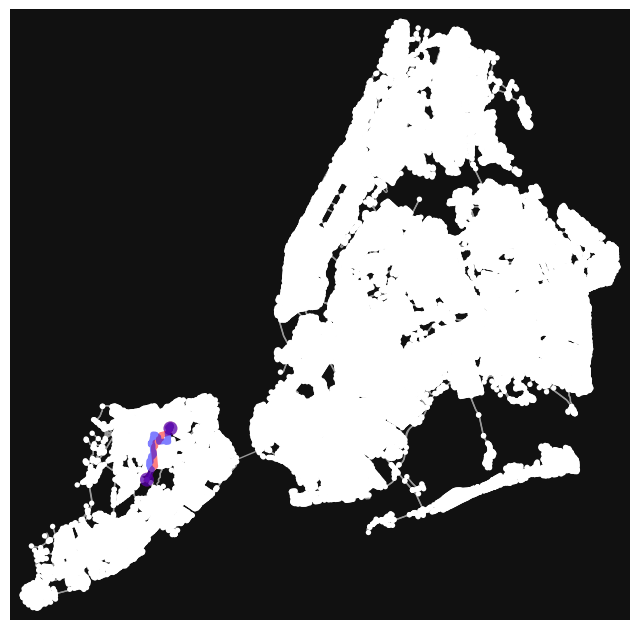

In [781]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, routeNO2_20], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [782]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdfNO2_20 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_20)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdfNO2_20.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-782-87a95d7e8368>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-782-87a95d7e8368>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

##### convert route to linestring

In [783]:
print(route1)
print(route_gdfNO2_20)

[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]
                                 osmid  oneway  \
u           v           key                      
42959081    6937755088  0      5716322   False   
6937755088  2523812078  0      5712112   False   
2523812078  42977771    0      5715566   False   
42977771    42981971    0      5715566   False   
42981971    43002963    0      5715566   False   
43002963    42977134    0      5714880   False   
42977134    42977131    0      57

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [784]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in routeNO2_20]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/routeNO2_20.geojson'
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in routeNO2_20]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/routeNO2_20.geojson\'\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

#### NO2 40%

In [785]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and NO2 gdf with necessary columns
assert 'latitude' in no2_40.columns and 'longitude' in no2_40.columns and 'rating' in no2_40.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for NO2 gdf to match G_drive's graph CRS
no2_40['geometry'] = no2_40.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
no2_40 = no2_40.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for NO2 gdf
no2_40['geohash'] = no2_40.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(no2_40[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)



# Compute NO2  route

routeNO2_40 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

499500


##### Average execution time after 50 runs:

In [786]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### plotting shortest route: PM vs distance

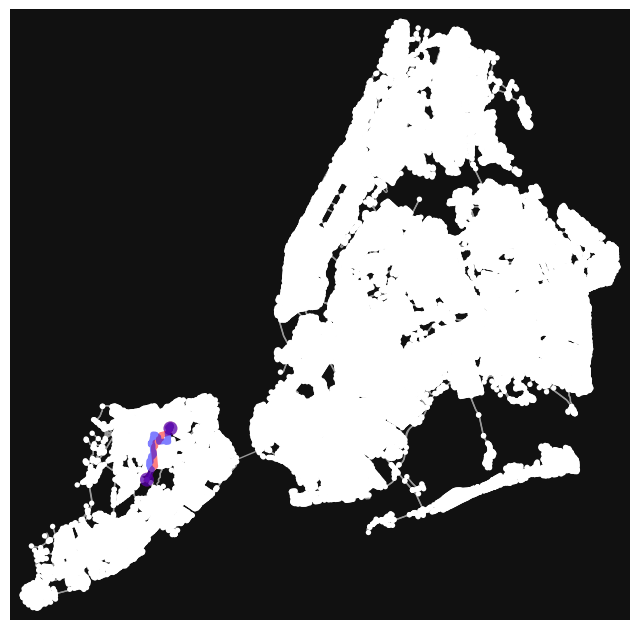

In [787]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, routeNO2_40], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [788]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdfNO2_40 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_40)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdfNO2_40.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-788-7c5742bbee9a>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-788-7c5742bbee9a>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

##### convert route to linestring

In [789]:
print(route1)
print(routeNO2_40)

[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]
[42959081, 6937755088, 2523812078, 42977771, 42981971, 43002963, 42977134, 42977131, 42959891, 42959888, 42959885, 42961658, 42961653, 42953995, 43003329, 42976224, 42976197, 43006850, 2554418647, 42981553, 42989809, 42961868, 11754651792, 42982389, 42978238, 42961916, 2571915585, 42953967, 2571915602, 42973102, 42954333, 42954315, 42956720, 42975626, 42975623, 42975617, 42975610, 42975604, 42975596, 42994463, 42977329, 42994457,

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [790]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in routeNO2_40]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/routeNO2_40.geojson' #route 2 is for PM
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in routeNO2_40]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/routeNO2_40.geojson\' #route 2 is for PM\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

#### NO2 60%

In [791]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and NO2 gdf with necessary columns
assert 'latitude' in no2_60.columns and 'longitude' in no2_60.columns and 'rating' in no2_60.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for NO2 gdf to match G_drive's graph CRS
no2_60['geometry'] = no2_60.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
no2_60 = no2_60.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for NO2 gdf
no2_60['geohash'] = no2_60.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(no2_60[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)



# Compute NO2  route

routeNO2_60 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

499500


##### Average execution time after 50 runs:

In [792]:
print(average_execution_time)

499500


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### plotting shortest route: PM vs distance

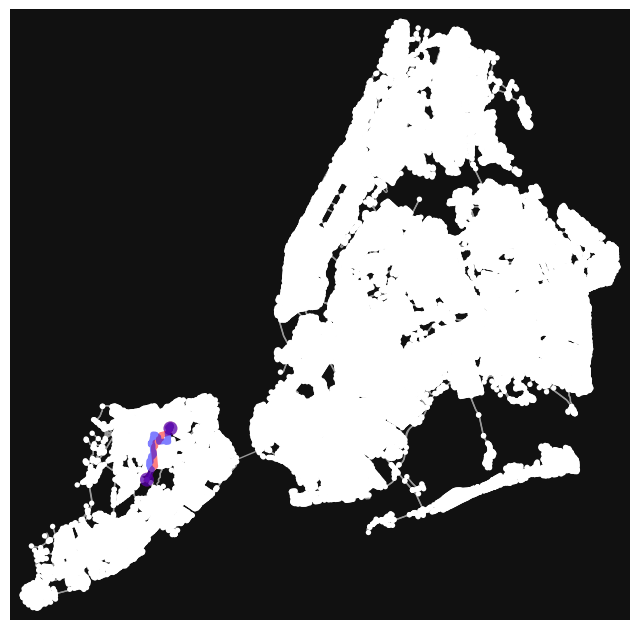

In [793]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, routeNO2_60], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [794]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdfNO2_60 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_60)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdfNO2_60.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-794-b90d4c3fea4f>:2: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-794-b90d4c3fea4f>:3: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See th

##### convert route to linestring

In [795]:
print(route1)
print(routeNO2_60)

[42959081, 6937755088, 42977763, 42981987, 43016573, 43016577, 43016546, 43021655, 42959873, 43011028, 2897509180, 42995428, 43021650, 43019972, 43015723, 43003233, 43006850, 2554418647, 42981553, 42989809, 42961868, 43008497, 42978240, 42978242, 42977400, 42962584, 42971001, 42977379, 42975883, 42975860, 42959377, 42977368, 42953410, 42953407, 42953404, 42953400, 43008925, 43010807, 42971322, 43016280, 42995070, 42947895, 42964353, 42996030, 42996022, 42968867, 42968866, 42968862, 42973224, 42965895, 42965898, 42999218, 42999222, 42999225, 42949520, 42949523]
[42959081, 6937755088, 2523812078, 42977771, 42981971, 43002963, 42977134, 42977131, 42959891, 42959888, 42959885, 42961658, 42961653, 42953995, 43003329, 42976224, 42976197, 43006850, 2554418647, 42981553, 42989809, 42961868, 11754651792, 42982389, 42978238, 42961916, 2571915585, 42953967, 2571915602, 42973102, 42954333, 42954315, 42956720, 42975626, 42975623, 42975617, 42975610, 42975604, 42975596, 42994463, 42977329, 42994457,

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [796]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in routeNO2_60]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/routeNO2_60.geojson' #route 2 is for PM
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

'\nimport osmnx as ox\nfrom shapely.geometry import LineString\nimport geopandas as gpd\nfrom google.colab import files\n\n# Convert route to LineString\nnode_points = [(G_drive.nodes[node][\'x\'], G_drive.nodes[node][\'y\']) for node in routeNO2_60]\nlinestring = LineString(node_points)\n\n# Save to GeoDataFrame\ngdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")\ngeojson_path = \'/content/routeNO2_60.geojson\' #route 2 is for PM\ngdf.to_file(geojson_path, driver=\'GeoJSON\')\n\n# Offer download\nfiles.download(geojson_path)\n'

#### NO2 80%

In [ ]:
%timeit -r 1 -n 50

import osmnx as ox
import geopandas as gpd
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geohash2

# Ensure proper loading of G_drive and NO2 gdf with necessary columns
assert 'latitude' in no2_80.columns and 'longitude' in no2_80.columns and 'rating' in no2_80.columns, "pm_gdf must contain 'latitude', 'longitude', and 'rating'."

# Function to compute geohash directly with specified precision
def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Set CRS for NO2 gdf to match G_drive's graph CRS
no2_80['geometry'] = no2_80.apply(lambda row: Point(row.longitude, row.latitude), axis=1)
no2_80 = no2_80.set_crs(G_drive.graph['crs'], allow_override=True)

# Compute geohash for NO2 gdf
no2_80['geohash'] = no2_80.apply(lambda row: compute_geohash(row.latitude, row.longitude), axis=1)

# Convert the graph to GeoDataFrames for spatial operations
nodes, edges = ox.graph_to_gdfs(G_drive)

# Compute geohash for edges if not present
if 'geohash' not in edges.columns:
    edges['geohash'] = edges['geometry'].apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x))

# Merge pm_gdf with edges based on geohash
edges = edges.merge(no2_80[['geohash', 'rating']], on='geohash', how='left')

# Calculate weights (inverse of rating)
edges['weight'] = edges['rating'].apply(lambda x: 1 / (x + 1) if pd.notnull(x) else 1)

# Ensure that 'osmid' entries in edges are not lists
if any(isinstance(x, list) for x in edges['osmid']):
    edges['osmid'] = edges['osmid'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Convert the DataFrame to a dictionary for quick lookup
weight_dict = edges.set_index('osmid')['weight'].to_dict()

# Ensure that 'osmid' entries in G_drive are not lists
for u, v, key, data in G_drive.edges(data=True, keys=True):
    if isinstance(data['osmid'], list):
        data['osmid'] = data['osmid'][0]

# Update G_drive with new weights using the dictionary
for u, v, key, data in G_drive.edges(data=True, keys=True):
    data['weight'] = weight_dict.get(data['osmid'], data.get('length', 1))

import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Coordinates and nodes fetching is correct
Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y = Greenbelt_Nature_Center.geometry.x, Greenbelt_Nature_Center.geometry.y
Kids_Korral_x, Kids_Korral_y = Kids_Korral.geometry.x, Kids_Korral.geometry.y

orig_node = ox.nearest_nodes(G_drive, Greenbelt_Nature_Center_x, Greenbelt_Nature_Center_y)
dest_node = ox.nearest_nodes(G_drive, Kids_Korral_x, Kids_Korral_y)



# Compute NO2  route

routeNO2_80 = ox.shortest_path(G_drive, orig_node, dest_node, weight="osmid")  # Minimizing rating

# Calculate the sum of the first 1000 integers
average_execution_time = sum(range(1000))
print(average_execution_time)

##### Average execution time after 50 runs:

In [ ]:
print(average_execution_time)

##### plotting shortest route: PM vs distance

In [ ]:

# Plot both routes on the same graph
fig, ax = ox.plot_graph_routes(G_drive, [route1, routeNO2_80], route_colors=['red', 'blue'], route_linewidth=6)
plt.show()


In [ ]:
#another map visualization
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdfNO2_80 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_80)
m1 = route_gdf1.explore(tiles="CartoDB positron", color="red")
m2 = route_gdfNO2_80.explore(tiles="CartoDB positron", color="blue", m=m1)
m2

##### convert route to linestring

In [ ]:
print(route1)
print(routeNO2_80)

In [ ]:
'''
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
from google.colab import files

# Convert route to LineString
node_points = [(G_drive.nodes[node]['x'], G_drive.nodes[node]['y']) for node in routeNO2_80]
linestring = LineString(node_points)

# Save to GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=[linestring], crs="EPSG:4326")
geojson_path = '/content/routeNO2_80.geojson' #route 2 is for PM
gdf.to_file(geojson_path, driver='GeoJSON')

# Offer download
files.download(geojson_path)
'''

#### NO2 Samples: Calculate Hausdorff Distance

In [ ]:
import osmnx as ox
from shapely.geometry import LineString
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming G_drive is already loaded with the appropriate region
def create_linestring_from_route(route, graph):
    node_points = [(graph.nodes[node]['x'], graph.nodes[node]['y']) for node in route]
    return LineString(node_points)

linestring0 = create_linestring_from_route(route1, G_drive)
linestring1 = create_linestring_from_route(routeNO2_20, G_drive)
linestring2 = create_linestring_from_route(routeNO2_40, G_drive)
linestring3 = create_linestring_from_route(routeNO2_60, G_drive)
linestring4 = create_linestring_from_route(routeNO2_80, G_drive)


ValueError: aspect must be finite and positive 

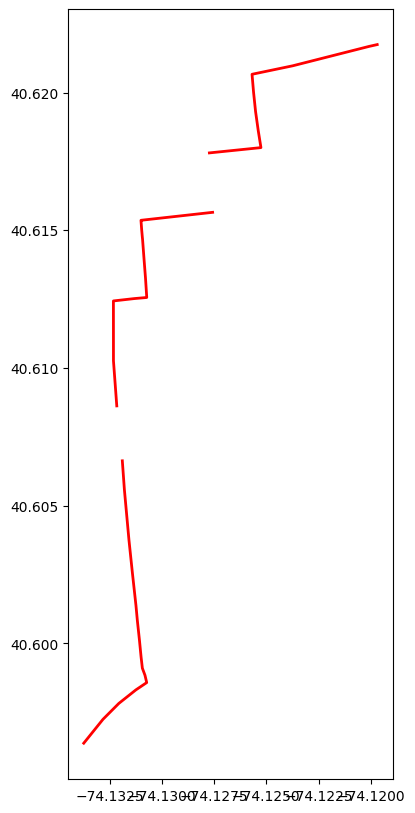

In [840]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import LineString

def create_linestring_from_route(route, graph):
    node_points = [(graph.nodes[node]['x'], graph.nodes[node]['y']) for node in route]
    return LineString(node_points)

# Assume routes are loaded into linestring0, linestring1, ..., linestring4
linestring0 = create_linestring_from_route(route1, G_drive)
linestring1 = create_linestring_from_route(routeNO2_20, G_drive)
linestring2 = create_linestring_from_route(routeNO2_40, G_drive)
linestring3 = create_linestring_from_route(routeNO2_60, G_drive)
linestring4 = create_linestring_from_route(routeNO2_80, G_drive)

# Compute differences between linestrings
difference_0_1 = linestring0.difference(linestring1)
difference_1_2 = linestring1.difference(linestring2)
difference_2_3 = linestring2.difference(linestring3)
difference_3_4 = linestring3.difference(linestring4)

# Create GeoDataFrames for visualization
gdf_0_1 = gpd.GeoDataFrame(geometry=[difference_0_1], crs="EPSG:4326")
gdf_1_2 = gpd.GeoDataFrame(geometry=[difference_1_2], crs="EPSG:4326")
gdf_2_3 = gpd.GeoDataFrame(geometry=[difference_2_3], crs="EPSG:4326")
gdf_3_4 = gpd.GeoDataFrame(geometry=[difference_3_4], crs="EPSG:4326")

# Plotting all differences
fig, ax = plt.subplots(figsize=(10, 10))
gdf_0_1.plot(ax=ax, color='red', linewidth=2, label='Diff Route 0-1')
gdf_1_2.plot(ax=ax, color='blue', linewidth=2, label='Diff Route 1-2')
gdf_2_3.plot(ax=ax, color='green', linewidth=2, label='Diff Route 2-3')
gdf_3_4.plot(ax=ax, color='orange', linewidth=2, label='Diff Route 3-4')
ox.plot_graph(G_drive, ax=ax, node_size=0, edge_linewidth=0.5, edge_alpha=0.5)

# Add legend and show plot
plt.legend()
plt.show()


In [818]:
distance0_1 = linestring0.hausdorff_distance(linestring1)
distance1_2 = linestring1.hausdorff_distance(linestring2)
distance1_3 = linestring1.hausdorff_distance(linestring3)
distance2_3 = linestring2.hausdorff_distance(linestring3)
distance4_2 = linestring4.hausdorff_distance(linestring2)

print(f"Hausdorff distance between Route 0 and Route 1: {distance0_1}")
print(f"Hausdorff distance between Route 1 and Route 2: {distance1_2}")
print(f"Hausdorff distance between Route 1 and Route 3: {distance1_3}")
print(f"Hausdorff distance between Route 2 and Route 3: {distance2_3}")
print(f"Hausdorff distance between Route 4 and Route 2: {distance4_2}")


Hausdorff distance between Route 0 and Route 1: 0.006156401744530814
Hausdorff distance between Route 1 and Route 2: 0.0
Hausdorff distance between Route 1 and Route 3: 0.0
Hausdorff distance between Route 2 and Route 3: 0.0
Hausdorff distance between Route 4 and Route 2: 0.0


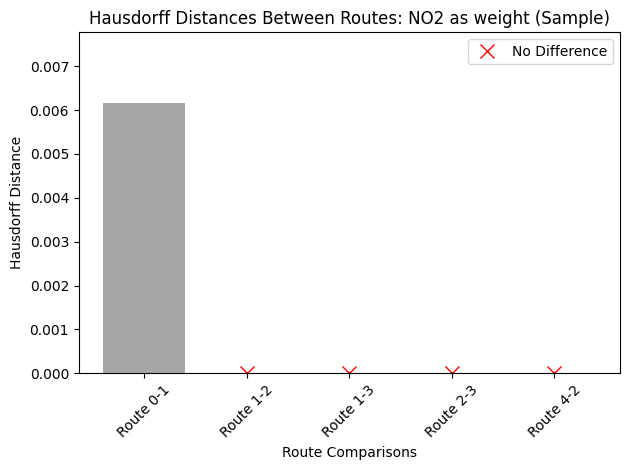

In [826]:
import matplotlib.pyplot as plt
import numpy as np

# Labels for the comparisons
labels = ['Route 0-1', 'Route 1-2', 'Route 1-3', 'Route 2-3', 'Route 4-2']

# Corresponding Hausdorff distances
distances = [0.006156401744530814, 0.0, 0.0, 0.0, 0.0]

# Create the bar graph
fig, ax = plt.subplots()
bars = ax.bar(labels, distances, color='gray', alpha=0.7)

# Adding markers for zero values
zero_distances = [0 if dist == 0 else None for dist in distances]  # Mark only zero values
x_positions = range(len(labels))  # X positions for the labels
markers, = ax.plot(x_positions, zero_distances, 'rx', markersize=10, label='No Difference')  # 'rx' for red X

# Adding labels and title
ax.set_xlabel('Route Comparisons')
ax.set_ylabel('Hausdorff Distance')
ax.set_title('Hausdorff Distances Between Routes: NO2 as weight (Sample)')
ax.set_ylim(0, max(distances) * 1.1 + 0.001)  # Set y-axis limits to slightly above the highest distance

# Adding a legend to explain markers
ax.legend()

# Display the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to make room for label rotation
plt.show()


In [ ]:
intersection0_1 = linestring0.intersection(linestring1)
intersection1_2 = linestring1.intersection(linestring2)
intersection1_3 = linestring1.intersection(linestring3)
intersection2_3 = linestring2.intersection(linestring3)
intersection4_2 = linestring4.intersection(linestring2)

# Checking if there are intersections and what type they are
print("Do routes 1 and 2 intersect?", "Yes" if not intersection1_2.is_empty else "No")
print("Do routes 1 and 3 intersect?", "Yes" if not intersection1_3.is_empty else "No")
print("Do routes 2 and 3 intersect?", "Yes" if not intersection2_3.is_empty else "No")
print("Do routes 4 and 2 intersect?", "Yes" if not intersection4_2.is_empty else "No")


In [ ]:
# Create a GeoDataFrame for easier plotting
gdf = gpd.GeoDataFrame(geometry=[linestring0, linestring1, linestring2, linestring3, linestring4], index=['Route 0','Route 1', 'Route 2', 'Route 3','Route 4'])

# Plotting
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(ax=ax, linewidth=3, alpha=0.6)
ox.plot_graph(G_drive, ax=ax, node_size=0, edge_linewidth=0.5, edge_alpha=0.5)
plt.legend(gdf.index)
plt.show()


In [816]:
import osmnx as ox
import geopandas as gpd
import folium

# Assuming G_drive and routes are already defined and loaded correctly
route1_gdf = ox.utils_graph.route_to_gdf(G_drive, route1)
route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_20)
route_gdf2 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_40)
route_gdf3 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_60)
route_gdf4 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_80)

# Start with the first route
m0 = route1_gdf.explore(tiles='CartoDB positron', color='orange', name='Route 0', style_kwds={'weight':5, 'opacity':0.8})

# Add the second route with different style
m1 = route_gdf1.explore(tiles='CartoDB positron', color='red', m=m0, name='Route 1', style_kwds={'weight':5, 'opacity':0.8})

# Add the third route with different style
m2 = route_gdf2.explore(tiles='CartoDB positron', color='blue', m=m1, name='Route 2', style_kwds={'weight':5, 'opacity':0.6, 'dashArray': '5, 5'})

# Add the fourth route with another distinct style
m3 = route_gdf3.explore(tiles='CartoDB positron', color='green', m=m2, name='Route 3', style_kwds={'weight':5, 'opacity':0.4, 'dashArray': '10, 10'})

# Add the fifth route with another distinct style
m4 = route_gdf4.explore(tiles='CartoDB positron', color='yellow', m=m3, name='Route 4', style_kwds={'weight':5, 'opacity':0.2, 'dashArray': '15, 15'})

# Show the map
m4


<ipython-input-816-2a868d47d3f3>:6: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route1_gdf = ox.utils_graph.route_to_gdf(G_drive, route1)
<ipython-input-816-2a868d47d3f3>:7: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via `routing.route_to_gdf` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  route_gdf1 = ox.utils_graph.route_to_gdf(G_drive, routeNO2_20)
<ipython-input-816-2a868d47d3f3>:8: FutureWarning: The `route_to_gdf` function has moved to the `routing` module. Calling `utils_graph.route_to_gdf` is deprecated and will be removed in the v2.0.0 release. Call it via

#comparison of linestrings/street segments

In [839]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import LineString
import geohash2



def compute_geohash(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision=precision)

# Convert NO2 data into a GeoDataFrame with geohash and ensure it's already set
no2['geohash'] = no2.apply(lambda x: compute_geohash(x.latitude, x.longitude, precision=7), axis=1)
no2_gdf = gpd.GeoDataFrame(no2, geometry=gpd.points_from_xy(no2.longitude, no2.latitude))

# Create a function to calculate route healthiness
def evaluate_route_healthiness(route_gdf, no2_gdf):
    # Merge route geodataframe with NO2 data based on geohash proximity
    route_gdf['geohash'] = route_gdf.geometry.apply(lambda geom: compute_geohash(geom.centroid.y, geom.centroid.x, precision=7))
    merged_gdf = route_gdf.merge(no2_gdf[['geohash', 'rating']], on='geohash', how='left')
    merged_gdf['rating'] = merged_gdf['rating'].fillna(0)  # Handle segments without NO2 data

    # Calculate average rating for healthiness
    average_rating = merged_gdf['rating'].mean()
    return average_rating

# Convert routes to GeoDataFrames
def create_route_gdf(route, graph):
    nodes = [graph.nodes[node] for node in route]
    edges = [LineString([(nodes[i]['x'], nodes[i]['y']), (nodes[i+1]['x'], nodes[i+1]['y'])]) for i in range(len(nodes)-1)]
    route_gdf = gpd.GeoDataFrame(geometry=edges, crs="EPSG:4326")
    return route_gdf

route0_gdf = create_route_gdf(route1, G_drive)
route1_gdf = create_route_gdf(routeNO2_20, G_drive)

# Evaluate healthiness
healthiness0 = evaluate_route_healthiness(route0_gdf, no2_gdf)
healthiness1 = evaluate_route_healthiness(route1_gdf, no2_gdf)

print(f"Healthiness of Route 0: {healthiness0}")
print(f"Healthiness of Route 1: {healthiness1}")

# Compare healthiness
healthier_route = "Route 0" if healthiness0 > healthiness1 else "Route 1"
print(f"The healthier route is {healthier_route}.")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Healthiness of Route 0: 0.0
Healthiness of Route 1: 0.0
The healthier route is Route 1.
